In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib notebook
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.gridspec as gridspec
from matplotlib import colors, ticker
import os 
import sys
import glob
from scipy.special import gamma

# load static copy of modules for reproducibility
if 'bayes-drt_20201113' not in sys.path:
    sys.path.append('bayes-drt_20201113')
import drt
import eis_utils as gt
from stan_models import load_pickle

%load_ext autoreload
%autoreload 2

In [3]:
# load all stan models - required for unpickling DRT objects
sms = glob.glob('../bayes-drt/stan_model_files/*.pkl')
for file in sms:
    load_pickle(file)

In [42]:
data_path = '../data'
# glob.glob(os.path.join(data_path,'*.csv'))

model_info = {'PM':{'path':'bayes_results','color':'k','order':0},
              'MAP':{'path':'map_results','color':'r','order':0},
              'HB':{'path':'comparisons/hyper-ridge/results','color':'k','order':1},
              'EN':{'path':'comparisons/ElasticNet/results','color':'k','order':2},
              'GP':{'path':'comparisons/GP-DRT/results/for_figs','color':'k','order':3},
              'gEISi':{'path':'comparisons/gEISi/results','color':'k','order':4}
             }

tick_size = 9
label_size = 11

plt.rcParams['font.family'] = 'serif'
plt.rcParams["mathtext.fontset"] = "dejavuserif"
plt.rcParams['xtick.labelsize'] = tick_size
plt.rcParams['ytick.labelsize'] = tick_size
plt.rcParams['axes.labelsize'] = label_size
plt.rcParams['legend.fontsize'] = tick_size - 1

default_colors=plt.rcParams['axes.prop_cycle'].by_key()['color']

plotdir = 'images'
latexdir = os.path.join(os.environ['HOME'],'OneDrive - Colorado School of Mines\\Research\\Manuscripts\\BayesianDRT_2020\\latex_Revision2\\latex')

# Graphical Abstract

In [5]:
# probability distributions
def pdf_gamma(x,shape,rate):
    return rate**shape*x**(shape-1)*np.exp(-x*rate)/(gamma(shape))

def pdf_invgamma(x,shape,rate):
    return rate**shape*x**(-shape-1)*np.exp(-rate/x)/(gamma(shape))

def pdf_exp(x,rate):
    return rate*np.exp(-rate*x)

def pdf_normal(x,mu,sigma):
    return (1/(sigma*np.sqrt(2*np.pi)))*np.exp(-0.5*((x-mu)/sigma)**2)

<IPython.core.display.Javascript object>


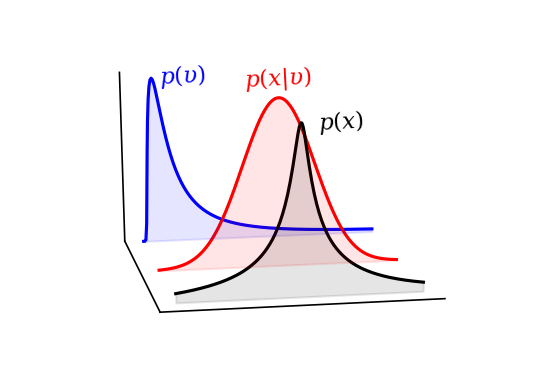

In [246]:
"Hierarchical prior visualization"

fig = plt.figure(figsize=(3.625,2.5))
ax = fig.add_subplot(111,projection='3d')

x1 = np.linspace(-1,1,200)
ups = np.arange(1e-5,1.5,0.01)
a = 0.05
b = 0.1
pxc = np.array([np.trapz(pdf_normal(x,0,ups)*pdf_invgamma(ups,a,b),x=ups) for x in x1])

x2 = np.linspace(1e-4,1,200)
pu = pdf_invgamma(x2,1,0.1)

px = pdf_normal(x1,0,0.3)

ys = [pxc,px,pu]
cs = ['k','r','b']
for n,(y,c) in enumerate(zip(ys,cs)):
    z = len(ys) - n
    
    # plot the line
    ax.plot(x1,(y/np.max(y))[::-1],z,zdir='y',label=col,zorder=-10*n,c=c)
    # fill
    ax.add_collection3d(plt.fill_between(x1,(y/np.max(y))[::-1],alpha=0.05,color=c),z,zdir='y')
    
ax.set_xticks([])
ax.set_xticklabels([])
ax.set_yticks([])
ax.set_yticklabels([])
ax.set_zticks([])
ax.set_zticklabels([])

# these lines turn off the background grid. Comment them out if you want the grid in the background
for w_axis in [ax.w_xaxis,ax.w_yaxis,ax.w_zaxis]:
    w_axis._axinfo['grid'].update({'linestyle':':','color':(1,1,1,0)})
for axis in [ax.xaxis,ax.yaxis,ax.zaxis]:
    axis.set_pane_color((1,1,1,0))

# this sets the view angle. You can adjust it to rotate the plot to your liking
# azim sets the rotation, elev sets the elevation of the "camera"
ax.view_init(azim=80,elev=20)

ax.text(-0.7,0,0.5,'$p(x)$',zdir='x',size=11)
ax.text(-0.2,-1,0.65,r'$p(x|\upsilon)$',zdir='x',size=11,c='r')
ax.text(0.45,-2,0.55,r'$p(\upsilon)$',zdir='x',size=11,c='b')
    
fig.tight_layout()
fig.savefig(os.path.join(plotdir,'GraphAbs_priors.jpg'),dpi=500)

# Prior distributions

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


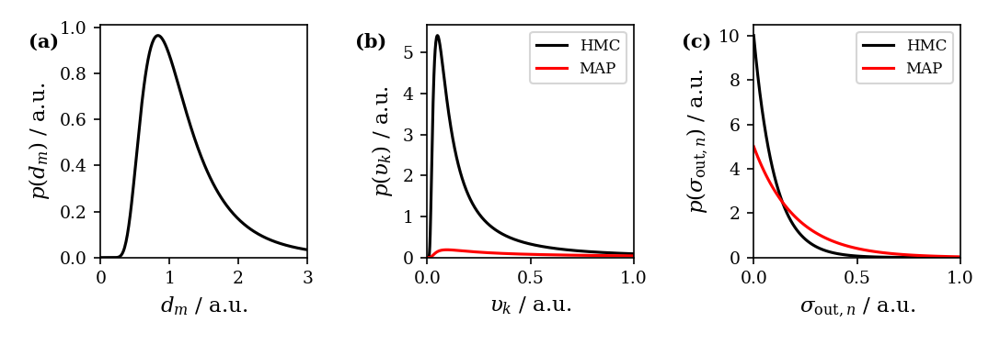

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in power
  
C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in true_divide
  
C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in multiply
  
C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in power
  
C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in true_divide
  
C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in multiply
  
C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in power
  
C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\

In [775]:
fig, axes = plt.subplots(1,3,figsize=(7.25,2.5))

# d0-2 prior
x = np.arange(0,3,0.01)
axes[0].plot(x,pdf_invgamma(x,5,5),c='k')
axes[0].set_xlabel('$d_m$ / a.u.')
axes[0].set_ylabel('$p(d_m)$ / a.u.')

# upsilon prior
x = np.arange(0,1,0.001)
axes[1].plot(x,pdf_invgamma(x,1,0.1),c='k',label='HMC')
axes[1].plot(x,pdf_invgamma(x,0.05,0.1),c='r',label='MAP')
axes[1].set_xlabel(r'$\upsilon_k$ / a.u.')
axes[1].set_ylabel(r'$p(\upsilon_k)$ / a.u.')

# sigma_out prior
x = np.arange(0,1,0.01)
axes[2].plot(x,pdf_exp(x,10),c='k',label='HMC')
axes[2].plot(x,pdf_exp(x,5),c='r',label='MAP')
axes[2].set_xlabel('$\sigma_{\mathrm{out},n}$ / a.u.')
axes[2].set_ylabel('$p(\sigma_{\mathrm{out},n})$ / a.u.')

for ax in axes[1:]:
    ax.legend()
    
# subfigure labels
for n,ax in enumerate(axes.ravel()):
    let = chr(n+97)
    ax.text(-0.35,0.9,f'({let})',transform=ax.transAxes,fontweight='bold')
    ax.set_ylim(0,ax.get_ylim()[1])
    
axes[0].set_xlim(0,3)
axes[1].set_xlim(0,1)
axes[2].set_xlim(0,1)
    
fig.tight_layout()
fig.savefig(os.path.join(plotdir,'Priors.jpg'),dpi=500)
fig.savefig(os.path.join(latexdir,'Priors.pdf'),dpi=500)

# Illustrative example: ZARC

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


<IPython.core.display.Javascript object>


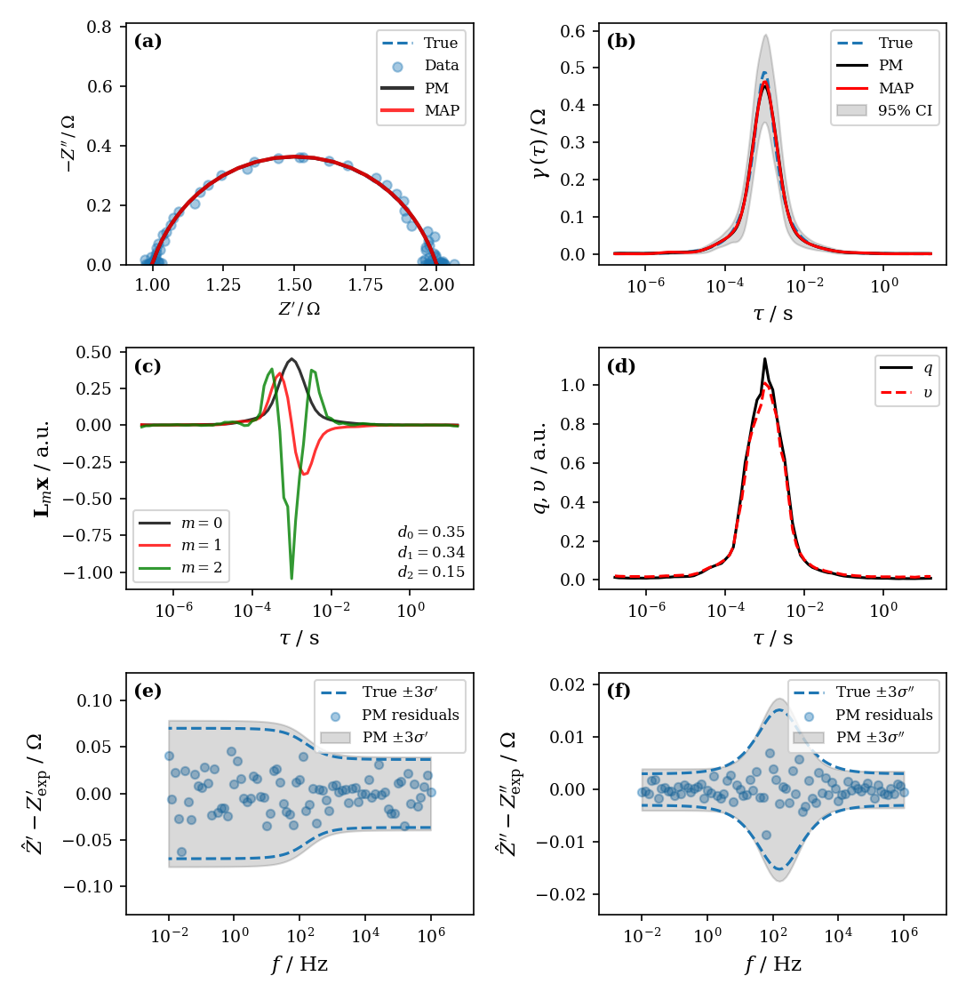

In [711]:
circ = 'ZARC'
err_model = 'Macdonald'
noise_level = 1.0

fig,axes = plt.subplots(3,2,figsize=(7.25,7.5))

# load impedance data
Z_file = os.path.join(data_path,'simulated',f'Z_{circ}_noiseless.csv')
Zn_file = os.path.join(data_path,'simulated',f'Z_{circ}_{err_model}_{noise_level}.csv')
# plot impedance data Nyquist
Zdf = pd.read_csv(Z_file)
Zndf = pd.read_csv(Zn_file)
gt.plot_nyquist(Zdf,ax=axes[0,0],label='True',plot_func='plot',ls='--',label_size=tick_size)
gt.plot_nyquist(Zndf,ax=axes[0,0],label='Data',s=25,alpha=0.4,label_size=tick_size)

# get results filenames
fname = os.path.split(Zn_file)[1]
suffix = fname[1:]
Zout = f'Zout{suffix}'
Gout = f'Gout{suffix}'
obj_out = f'obj{suffix}'.replace('.csv','.pkl')

# load true DRT
g_file = os.path.join(data_path,'simulated',f'gamma_{circ}.csv')
g_true = pd.read_csv(g_file)
g_true = g_true[(g_true['tau']>= 1/(2*np.pi*Zdf['Freq'].max())) & (g_true['tau']<= 1/(2*np.pi*Zdf['Freq'].min()))]
axes[0,1].plot(g_true['tau'],g_true['gamma'],label='True',ls='--')

for model_name in ['PM','MAP']:
    path = model_info[model_name]['path']
    color = model_info[model_name]['color']
    # load results
    Zres = pd.read_csv(os.path.join(path,Zout))
    Gres = pd.read_csv(os.path.join(path,Gout))
    # limit DRT range to data range
    Gres = Gres[(Gres['tau']>= 1/(2*np.pi*Zdf['Freq'].max())) & (Gres['tau']<= 1/(2*np.pi*Zdf['Freq'].min()))]

    # plot DRT on appropriate axis
    if model_name=='PM':
        axes[0,1].plot(Gres['tau'],Gres['gamma'],label='PM',c=color)
        axes[0,1].fill_between(Gres['tau'],Gres['gamma_lo'],Gres['gamma_hi'],alpha=0.15,label='95% CI',
                               color=color,lw=1)
    elif model_name=='MAP':
        axes[0,1].plot(Gres['tau'],Gres['gamma'],label='MAP',c=color,ls='-',alpha=1)

    # plot impedance fit
    gt.plot_nyquist(Zres,ax=axes[0,0],plot_func='plot',label=model_name,c=color,lw=2,alpha=0.8,label_size=tick_size,
                        ls='-')

# load DRT objects to get hyperparameters
dr_mcmc = load_pickle(os.path.join(model_info['PM']['path'],obj_out))
# dr_map = load_pickle(os.path.join(model_info['MAP']['path'],obj_out))
# if noise_level > 0:
#     dr_mcmc._sigma_min = 0.002
#     dr_map._sigma_min = 0.002
# else:
#     dr_mcmc._sigma_min = 0.005
#     dr_map._sigma_min = 0.005


# plot derivatives
L0B = dr_mcmc.distribution_matrices['DRT']['L0']@dr_mcmc.distribution_fits['DRT']['coef']
L1B = dr_mcmc.distribution_matrices['DRT']['L1']@dr_mcmc.distribution_fits['DRT']['coef']
L2B = dr_mcmc.distribution_matrices['DRT']['L2']@dr_mcmc.distribution_fits['DRT']['coef']
d0 = np.mean(dr_mcmc._sample_result['d0_strength'])
d1 = np.mean(dr_mcmc._sample_result['d1_strength'])
d2 = np.mean(dr_mcmc._sample_result['d2_strength'])
tau = dr_mcmc.distributions['DRT']['tau']
axes[1,0].plot(tau,L0B,label='$m=0$',c='k',alpha=0.8)
axes[1,0].plot(tau,L1B,label='$m=1$',c='r',alpha=0.8)
axes[1,0].plot(tau,L2B,label='$m=2$',c='g',alpha=0.8)
# indicate values of d0-2 on plot
axes[1,0].text(0.78,0.05,'$d_0={:.2f}$\n$d_1={:.2f}$\n$d_2={:.2f}$'.format(d0,d1,d2),
              transform=axes[1,0].transAxes,size=tick_size-1)

# plot upsilon and q
ups = np.mean(dr_mcmc._sample_result['ups'],axis=0)
LB = np.mean(dr_mcmc._sample_result['q'],axis=0)
axes[1,1].plot(tau,LB,label='$q$',c='k')
axes[1,1].plot(tau,ups,label=r'$\upsilon$',c='r',ls='--')


# plot error structure
# plot residuals
re_err = (Zres['Zreal'] - Zndf['Zreal']).values
im_err = (Zres['Zimag'] - Zndf['Zimag']).values
axes[2,0].scatter(Zndf['Freq'],re_err,s=20,alpha=0.4,label=r'PM residuals')
axes[2,1].scatter(Zndf['Freq'],im_err,s=20,alpha=0.4,label=r'PM residuals')
# plot true error scale
p = axes[2,0].plot(Zndf['Freq'],-3*Zndf['sigma_re'],label='True $\pm 3\sigma^{\prime}$',ls='--')
p = axes[2,1].plot(Zndf['Freq'],-3*Zndf['sigma_im'],label='True $\pm 3\sigma^{\prime\prime}$',ls='--')
axes[2,0].plot(Zndf['Freq'],3*Zndf['sigma_re'],c=p[0].get_color(),ls='--')
axes[2,1].plot(Zndf['Freq'],3*Zndf['sigma_im'],c=p[0].get_color(),ls='--')

# plot recovered error scale
sigma_re,sigma_im = dr_mcmc.predict_sigma(dr_mcmc.f_train)
axes[2,0].fill_between(dr_mcmc.f_train,-3*sigma_re,3*sigma_re,alpha=0.15,color='k',lw=1,label='PM $\pm 3\sigma^{\prime}$')
axes[2,1].fill_between(dr_mcmc.f_train,-3*sigma_im,3*sigma_im,alpha=0.15,color='k',lw=1,label='PM $\pm 3\sigma^{\prime\prime}$')

# formatting
# sort legend for Nyquist plot
h,l = axes[0,0].get_legend_handles_labels()
srt_idx = [0,-1,1,2]
axes[0,0].legend(handles=[h[idx] for idx in srt_idx],labels=[l[idx] for idx in srt_idx])
    
for ax in axes.ravel()[1:]:
    ax.set_xscale('log')
    ax.legend()

for ax in axes.ravel()[1:4]:
    ax.set_xlabel(r'$\tau$ / s')
    
axes[0,1].set_ylabel(r'$\gamma\,(\tau) \, / \, \Omega$')
axes[1,0].set_ylabel('$\mathbf{L}_m \mathbf{x}$ / a.u.')
axes[1,1].set_ylabel(r'$q,\upsilon$ / a.u.')
    
axes[2,0].set_ylabel('$\hat{Z}^{\prime} - Z^{\prime}_{\mathrm{exp}}$ / $\Omega$')
axes[2,1].set_ylabel('$\hat{Z}^{\prime\prime} - Z^{\prime\prime}_{\mathrm{exp}}$ / $\Omega$')

for ax in axes[2]:
    ax.set_xlabel('$f$ / Hz')
    # make more room for legends
    ax.set_xlim(Zndf['Freq'].min()/20,Zndf['Freq'].max()*20)
    ax.legend(loc='upper right')
    
# make more room for legend
axes[2,0].set_ylim(-0.13,0.13)

# subfigure labels
for n,ax in enumerate(axes.ravel()):
    let = chr(n+97)
    ax.text(0.02,0.9,f'({let})',transform=ax.transAxes,fontweight='bold')

fig.tight_layout()
fig.savefig(os.path.join(plotdir,'ZARC_IllusEx.jpg'),dpi=500)
fig.savefig(os.path.join(latexdir,'ZARC_IllusEx.pdf'),dpi=500)

# Results for all simulated spectra at low noise
## Bayesian posterior distribution & MAP

In [6]:
def plot_true_drt(circ,ax,trunc_tau_plot,Zdf,tmin=None,tmax=None,**kw):
    """plot true DRT"""
    if tmax is None:
        tmax = 1/(2*np.pi*Zdf['Freq'].min())
    if tmin is None:
        tmin = 1/(2*np.pi*Zdf['Freq'].max())
    if circ=='RC':
        ax.plot([1e-2,1e-2],[0,10],zorder=-10,lw=1,**kw)
        ax.plot([tmin,tmax],[0,0],zorder=-10,label='True',**kw)
    elif circ=='2RC':
        ax.plot([1e-3,1e-3],[0,10],zorder=-10,lw=1,**kw)
        ax.plot([1e-2,1e-2],[0,10],zorder=-10,lw=1,**kw)
        ax.plot([tmin,tmax],[0,0],zorder=-10,label='True',**kw)
    else:
        g_file = os.path.join(data_path,'simulated',f'gamma_{circ}.csv')
        g_true = pd.read_csv(g_file)
        if trunc_tau_plot:
            g_true = g_true[(g_true['tau']>= tmin) & 
                            (g_true['tau']<= tmax)
                           ]
        ax.plot(g_true['tau'],g_true['gamma'],label='True',zorder=-10,**kw)
        
        if circ=='trunc':
            # add RL element and measurement boundaries
            ax.plot([1e-6,1e-6],[0,-10],zorder=-10,lw=1,**kw)
            ax.axvline(tmax,ls=':',c='k',lw=1)
            ax.axvline(tmin,ls=':',c='k',lw=1)
        elif circ=='RC-ZARC':
            # add RC element
            ymin = np.interp(np.exp(-2),g_true['tau'],g_true['gamma'])
            ax.plot([np.exp(-2),np.exp(-2)],[ymin,10],zorder=-10,lw=1,**kw)
            
    ax.set_xscale('log')
    ax.set_xlabel(r'$\tau$ / s')
    ax.set_ylabel(r'$\gamma \, (\ln{\tau}) \ / \ \Omega$')


def plot_sim_fit(model_name,circ,err_model,noise_level,ax,trunc_tau_plot=True,tmin=None,tmax=None,
                 f_betas=[1e-2,1e-1,1],inset_rect=[0.6,0.5,0.4,0.5]):
    "Plot recovered DRT on main axis and Nyquist fit on inset"

    # get filename suffix
    if noise_level==0:
        suffix = f'{circ}_noiseless'
    else:
        suffix = f'{circ}_{err_model}_{noise_level}'
    
    # plot Nyquist of data on inset
    axi = ax.inset_axes(inset_rect)
    Zn_file = os.path.join(data_path,'simulated',f'Z_{suffix}.csv')
    Zndf = pd.read_csv(Zn_file)
    if tmin is None:
        tmin = 1/(2*np.pi*Zndf['Freq'].max())
    if tmax is None:
        tmax = 1/(2*np.pi*Zndf['Freq'].min())
    gt.plot_nyquist(Zndf,ax=axi,s=20,alpha=0.3,label_size=tick_size-1)
        
    # plot recovered DRT and impedance fit for model
    path = model_info[model_name]['path']
    color = model_info[model_name]['color']
    
    if model_name!='HB':
        Gout = f'Gout_{suffix}.csv'
        Gres = pd.read_csv(os.path.join(path,Gout))
        if model_name=='gEISi':
            Gres['tau'] = np.exp(Gres['tau'])
#             Gres.loc[-1] = [tmin,0]
#             Gres.loc[Gres.index.max()+1] = [tmax,0]
        if trunc_tau_plot:
            # limit DRT range to data range
            Gres = Gres[(Gres['tau']>= tmin) & (Gres['tau']<= tmax)]
        

    # plot recovered DRT on main axis
    if model_name in ('PM','gEISi'):
        ax.plot(Gres['tau'],Gres['gamma'],label=model_name,c=color)
        ax.fill_between(Gres['tau'],Gres['gamma_lo'],Gres['gamma_hi'],alpha=0.15,label='95% CI',
                               color=color,lw=1)
    elif model_name=='GP':
        ax.plot(Gres['tau'],Gres['gamma'],c=color,label='GP')
        ax.fill_between(Gres['tau'],Gres['gamma']-2*Gres['sigma_gamma'],Gres['gamma']+2*Gres['sigma_gamma'],
                            alpha=0.2,color=color,label='95% CI',lw=1)
    elif model_name=='HB':
        for color,f_beta in zip(['k','r','g'],f_betas):
            Gout = 'Gout_{}_fbeta={:.3g}.csv'.format(suffix,f_beta)
            Gres = pd.read_csv(os.path.join(path,Gout))
            if trunc_tau_plot:
                # limit DRT range to data range
                Gres = Gres[(Gres['tau']>= tmin) & (Gres['tau']<= tmax)]
            ax.plot(Gres['tau'],Gres['gamma'],c=color,label=r'$f_\beta = {:.3g}$'.format(f_beta),alpha=0.8)
    else:
        ax.plot(Gres['tau'],Gres['gamma'],c=color,label=model_name)

    # plot fitted impedance on inset
    if model_name!='HB':
        Zout = f'Zout_{suffix}.csv'
        Zres = pd.read_csv(os.path.join(path,Zout))
        gt.plot_nyquist(Zres,ax=axi,plot_func='plot',label=model_name,c=color,label_size=tick_size-1)
    else:
        for color,f_beta in zip(['k','r','g'],f_betas):
            Zout = 'Zout_{}_fbeta={:.3g}.csv'.format(suffix,f_beta)
            Zres = pd.read_csv(os.path.join(path,Zout))
            gt.plot_nyquist(Zres,ax=axi,plot_func='plot',label=model_name,c=color,label_size=tick_size-1)
            
#     ax.set_xscale('log')
#     ax.set_xlabel(r'$\tau$ / s')
    ax.legend(loc='upper left')
    
    # simplify inset
    axi.set_xticks([])
    axi.set_yticks([])
    axi.get_legend().remove()
    axi.set_xlabel('')#'$Z^{\prime}$',size=tick_size-1,ha='right',x=0.9)
    axi.set_ylabel('')#'$-Z^{\prime\prime}$',size=tick_size-1,ha='right',y=0.9)
    
    if circ in ['ZARC-RL','trunc']:
        # indicate zero Z''
        axi.axhline(0,lw=0.7,c='k',zorder=-10)
    else:
        axi.set_ylim(0,axi.get_ylim()[1])

In [7]:
def plot_all_sim_drts(models,err_model,noise_level,nonneg=False):
    if nonneg:
        # plot only nonnegative DRTs
        circuits = ['RC','ZARC','2RC','2ZARC','RC-ZARC','Gerischer']
        fig,axes = plt.subplots(3,2,figsize=(7.25,7.5))
    else:
        circuits = ['RC','ZARC','2RC','2ZARC','RC-ZARC','Gerischer','ZARC-RL','trunc']
        fig,axes = plt.subplots(4,2,figsize=(7.25,8.5))

    for circ,ax in zip(circuits,axes.ravel()):
        if circ=='trunc':
            trunc_tau_plot = False
            inset_rect = [0.6,0,0.4,0.4]
        else:
            trunc_tau_plot = True
            inset_rect = [0.6,0.5,0.4,0.5]

        Zfile = f'Z_{circ}_uniform_0.25.csv'
        Zdf = pd.read_csv(os.path.join(data_path,'simulated',Zfile))

        plot_true_drt(circ,ax,trunc_tau_plot,Zdf,tmin=None,tmax=None,ls='--',c=default_colors[0])

        for model_name in models:
            try:
                plot_sim_fit(model_name,circ,err_model,noise_level,ax,trunc_tau_plot=trunc_tau_plot,tmin=None,tmax=None,
                     f_betas=[1e-2,1e-1,1],inset_rect=inset_rect)
            except FileNotFoundError as fnf:
                print(fnf)

    axes[0,0].set_ylim(0,3)
    axes[0,1].set_ylim(0,0.7)
    axes[1,0].set_ylim(0,3)
    axes[1,1].set_ylim(0,0.7)
    axes[2,0].set_ylim(0,3)
    axes[2,1].set_ylim(0,1)
    

    for ax in axes.ravel()[:4]:
        ax.set_xlim(1e-6,1e2)
    axes[2,0].set_xlim(1e-3,1e2)
    axes[2,1].set_xlim(1e-6,1e2)
    
    if nonneg==False:
        # axes[3,0].set_ylim(0,1)
        axes[3,1].set_ylim(-2,2.5)
        axes[3,0].set_xlim(1e-6,1e2)

        axes[3,1].legend(loc='upper left',ncol=2)

        for ax in axes[3]:
            ax.axhline(0,lw=0.5,c='k')
        
    for n,ax in enumerate(axes.ravel()):
        let = chr(n+97)
        ax.text(-0.22,0.9,f'({let})',transform=ax.transAxes,fontweight='bold')

    fig.tight_layout()
    return fig,axes

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


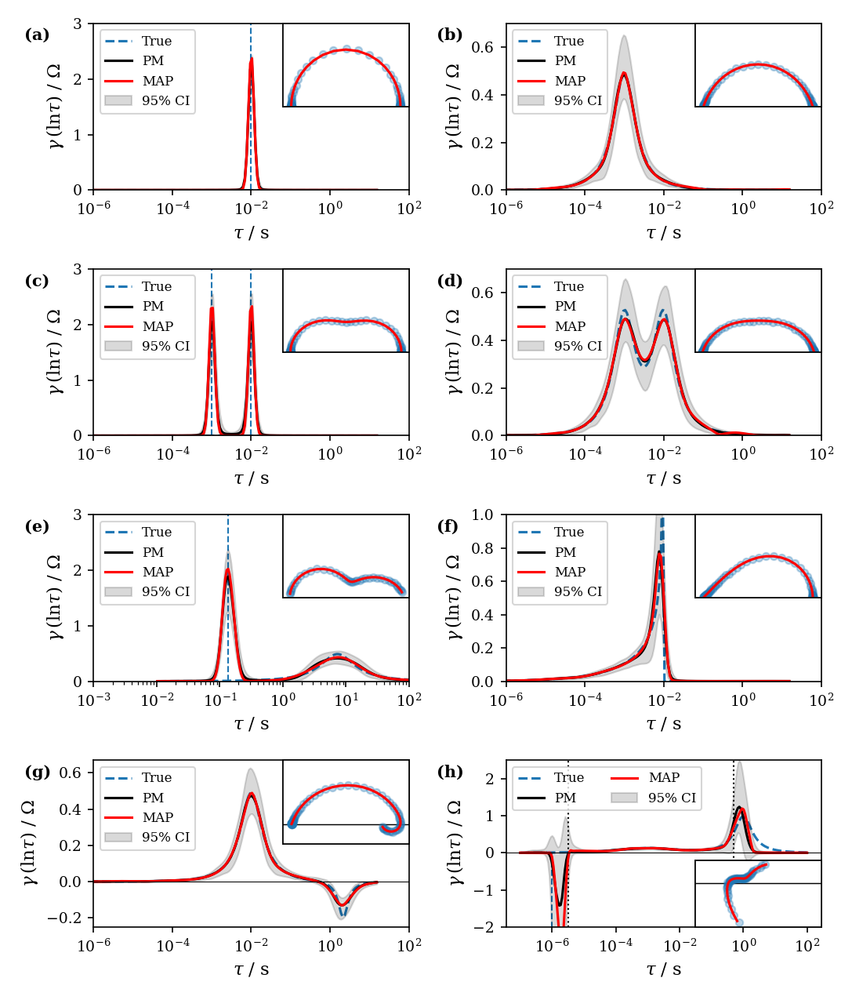

In [825]:
fig,axes = plot_all_sim_drts(['PM','MAP'],'uniform',0.25)


# fig.savefig(os.path.join(plotdir,'DRTs_AllSimData_uniform_0.25.jpg'),dpi=500)
# fig.savefig(os.path.join(latexdir,'DRTs_AllSimData_uniform_0.25.pdf'),dpi=500)

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


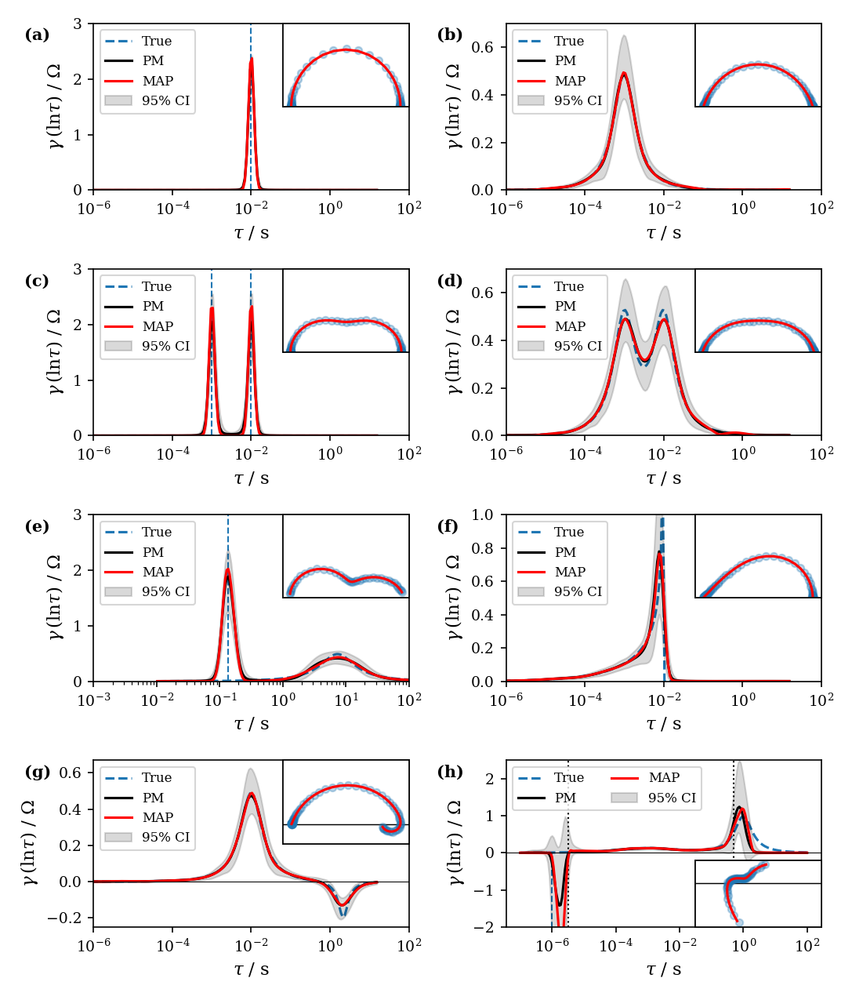

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


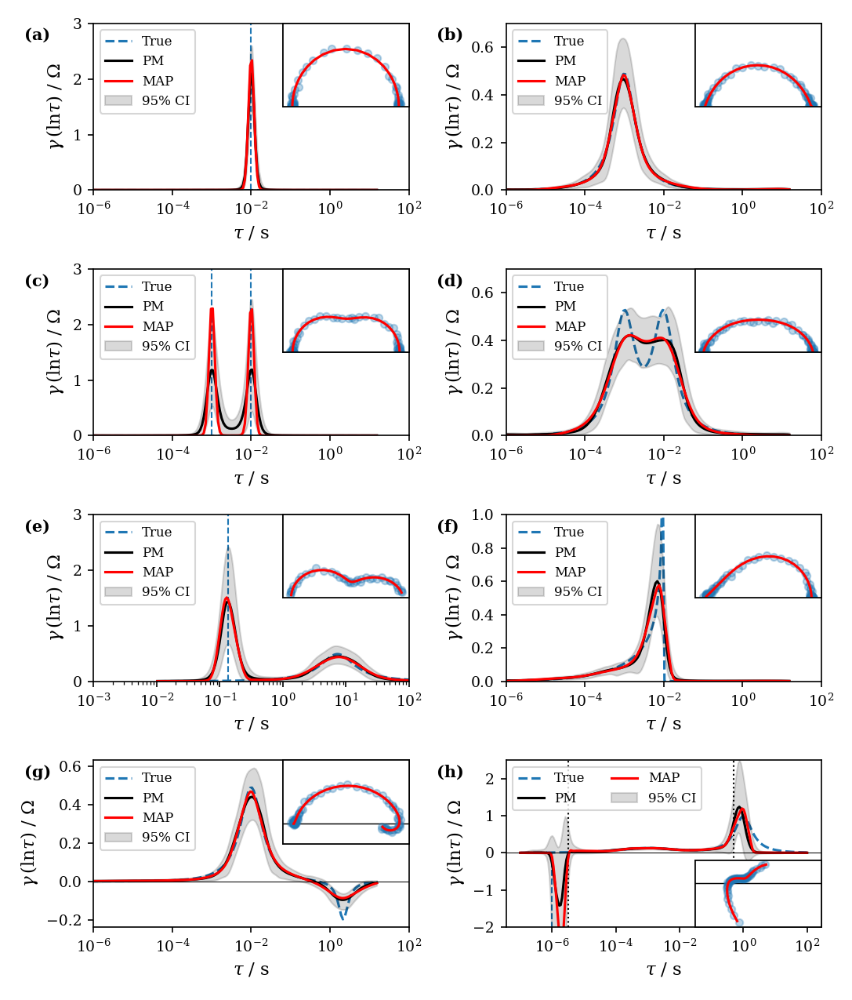

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


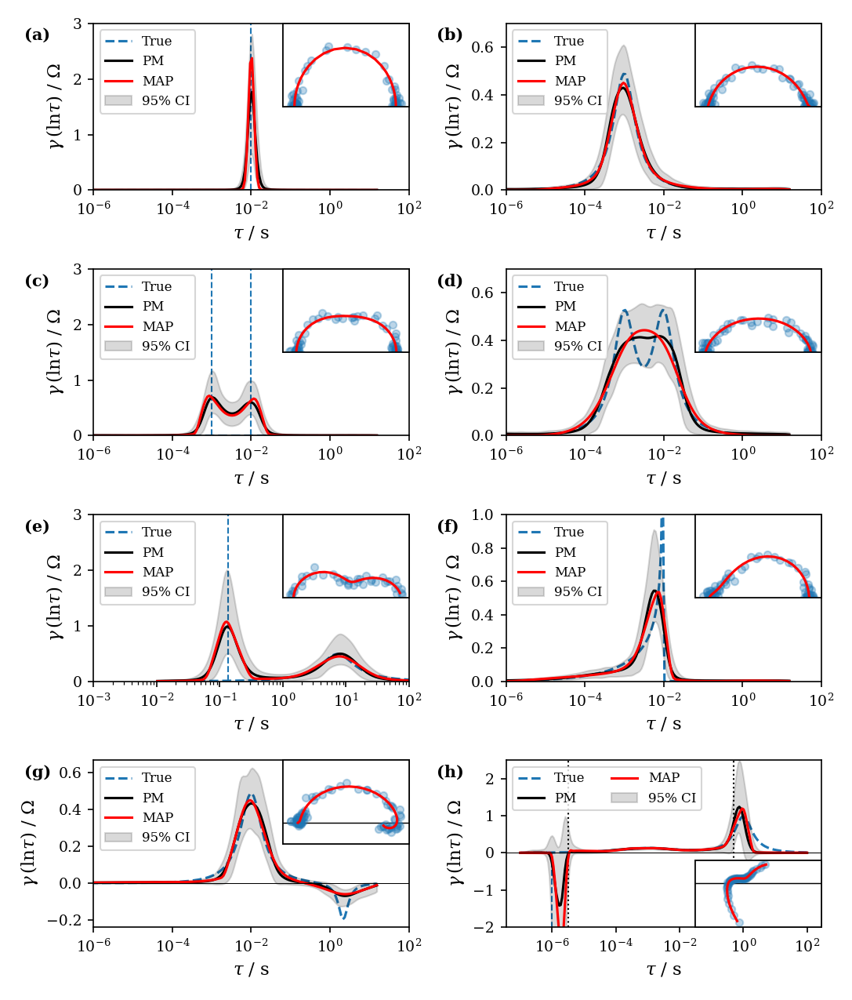

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


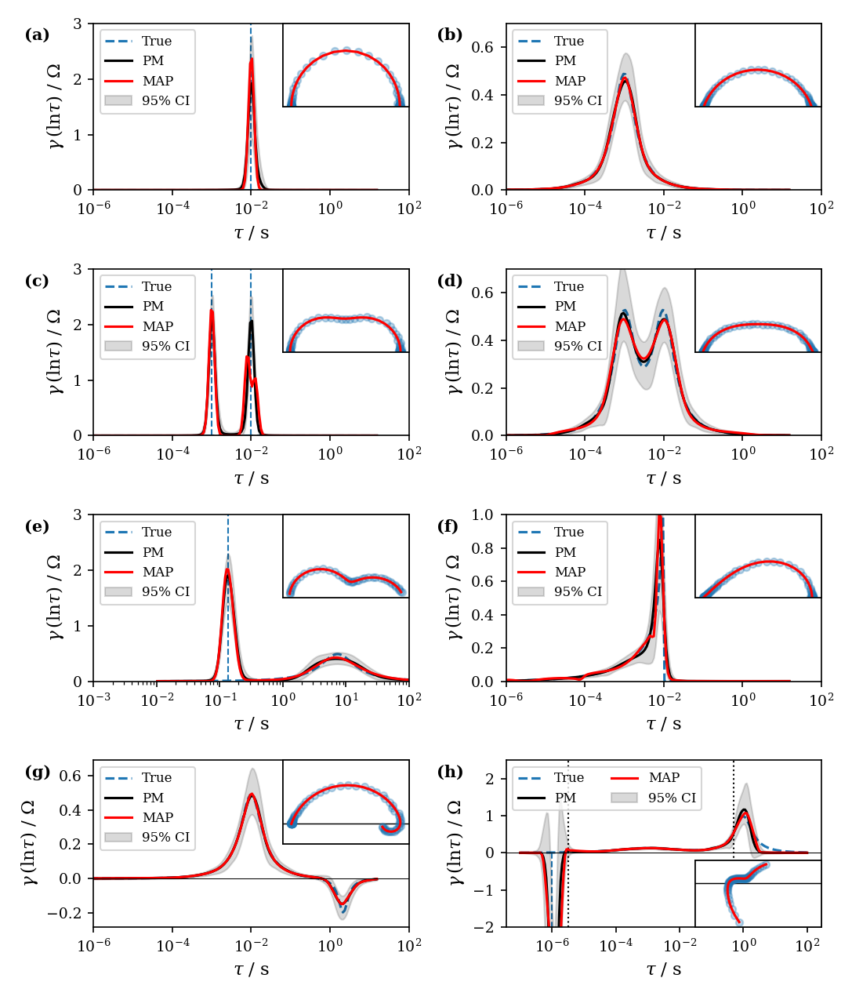

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


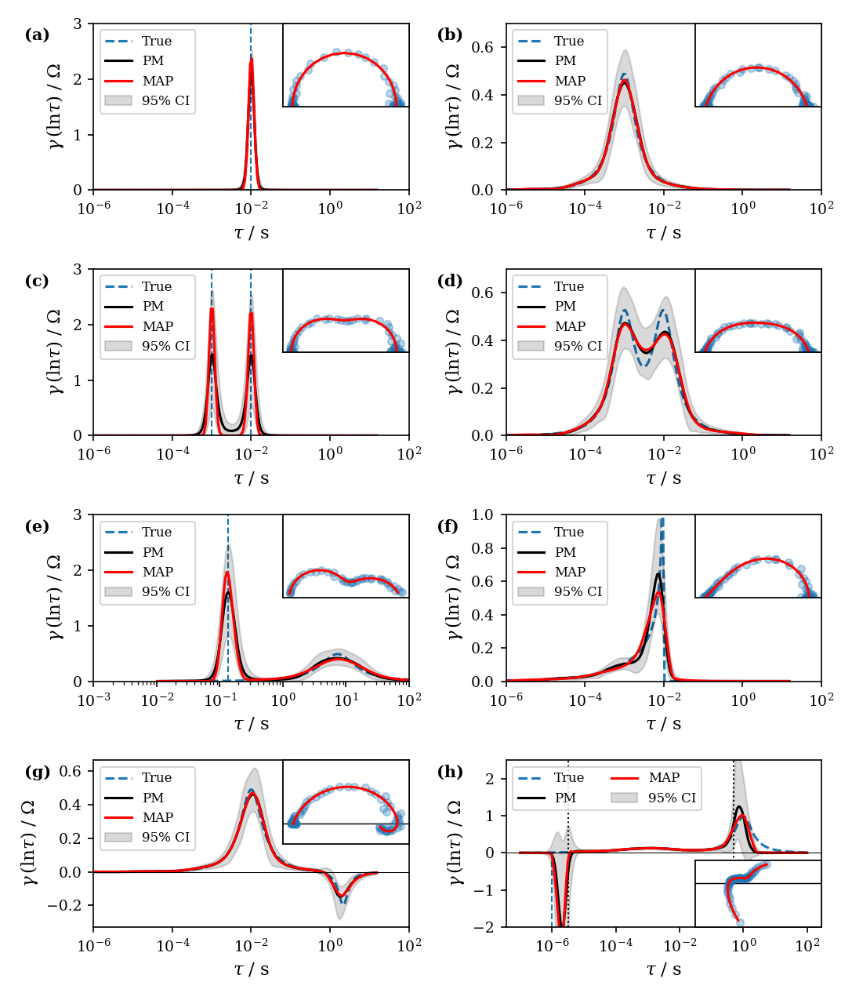

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


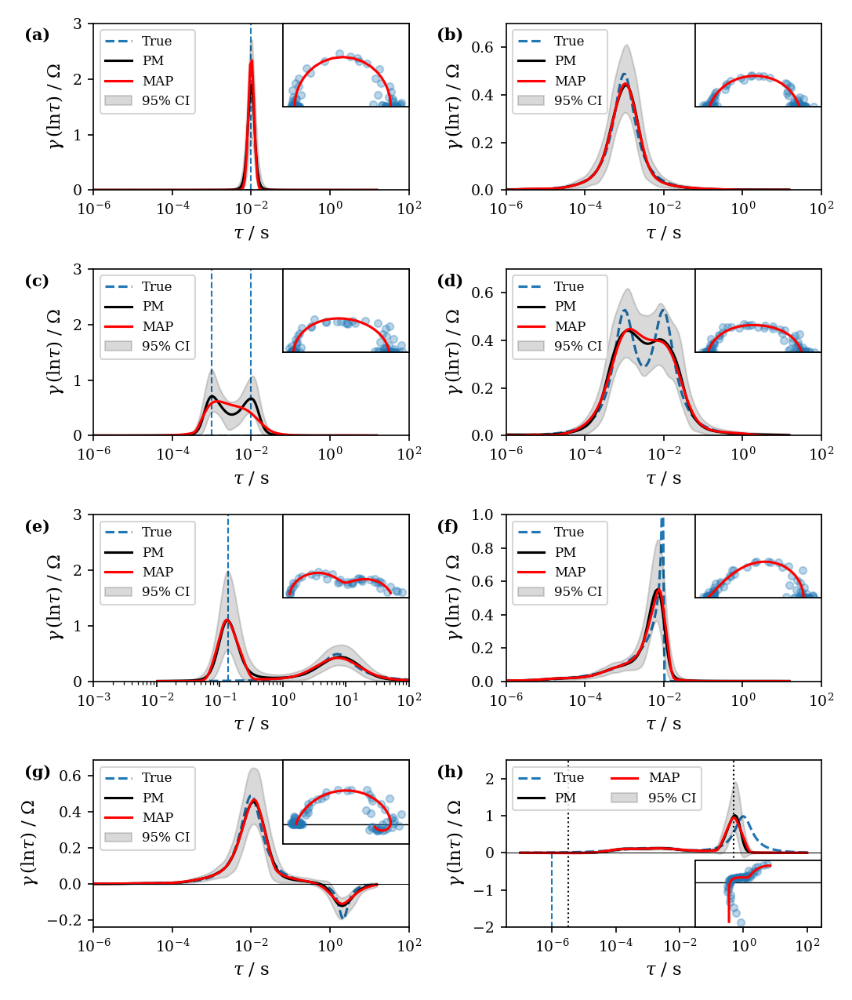

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


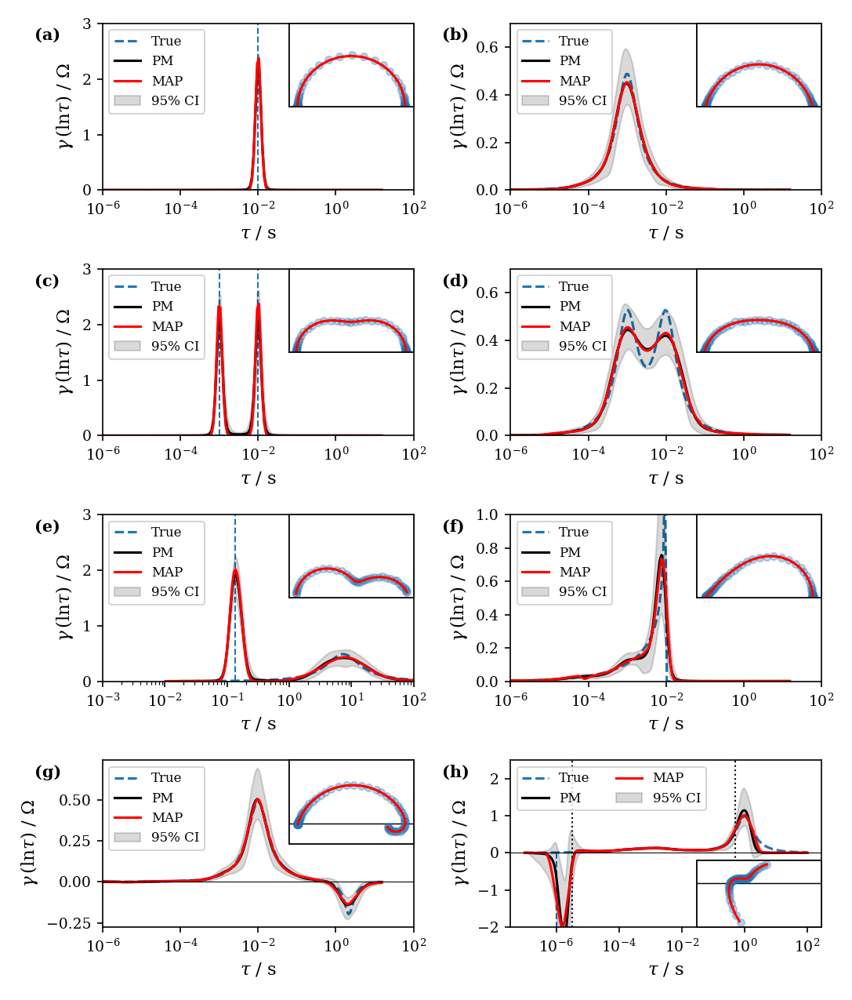

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


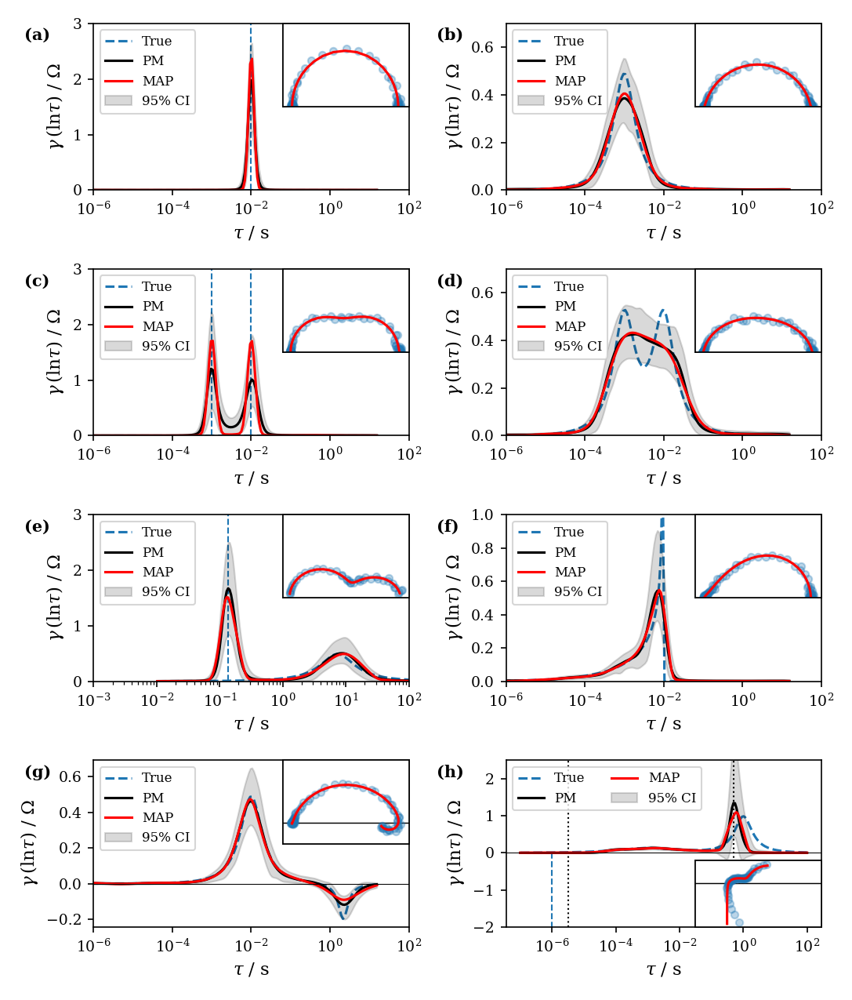

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


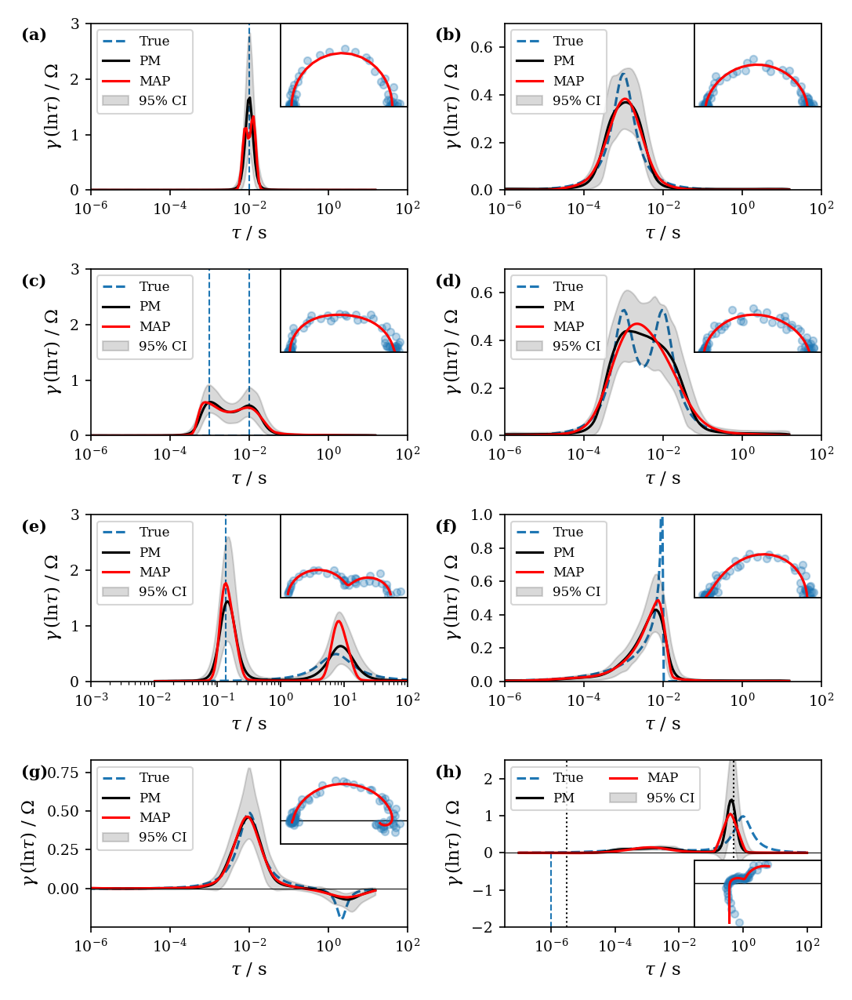

In [826]:
for err_model in ['uniform','Macdonald','Orazem']:
    for noise_level in [0.25,1.0,2.5]:
        fig,axes = plot_all_sim_drts(['PM','MAP'],err_model,noise_level)

        fig.savefig(os.path.join(plotdir,f'DRTs_AllSimData_{err_model}_{noise_level}.jpg'),dpi=500)
        fig.savefig(os.path.join(latexdir,f'DRTs_AllSimData_{err_model}_{noise_level}.pdf'),dpi=500)

# Comparison figures: simulated data

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


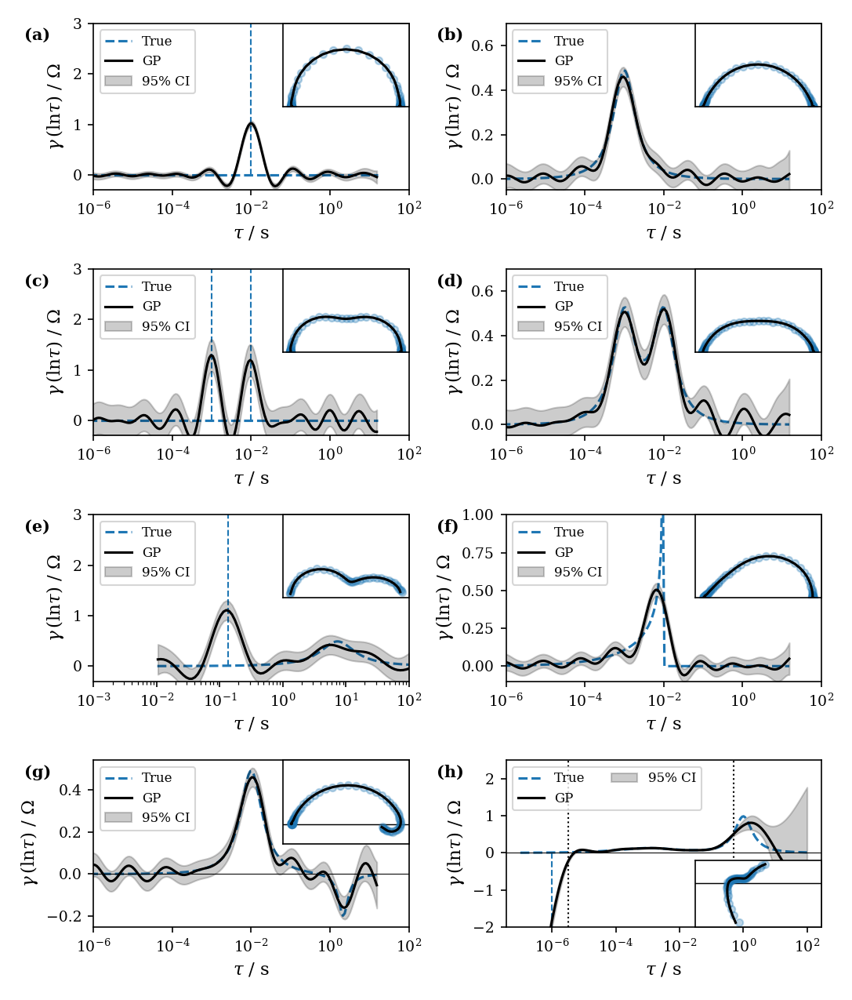

In [827]:
model = 'GP'
fig,axes = plot_all_sim_drts([model],'uniform',0.25,nonneg=False)
for ax,ymin in zip(axes.ravel()[:6],[-0.3,-0.05,-0.3,-0.05,-0.3,-0.1]):
    ax.set_ylim(ymin,ax.get_ylim()[1])

fig.savefig(os.path.join(plotdir,f'{model}_DRTs_AllSimData_uniform_0.25.jpg'),dpi=500)
fig.savefig(os.path.join(latexdir,f'{model}_DRTs_AllSimData_uniform_0.25.pdf'),dpi=500)

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


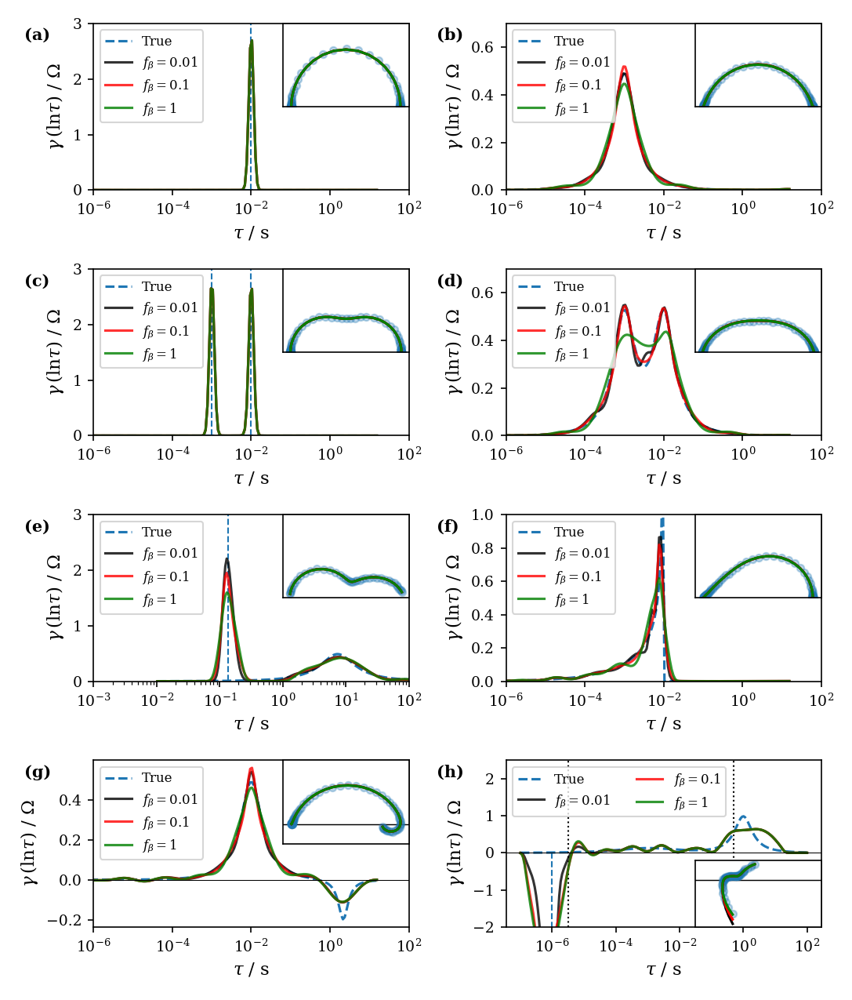

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


<IPython.core.display.Javascript object>


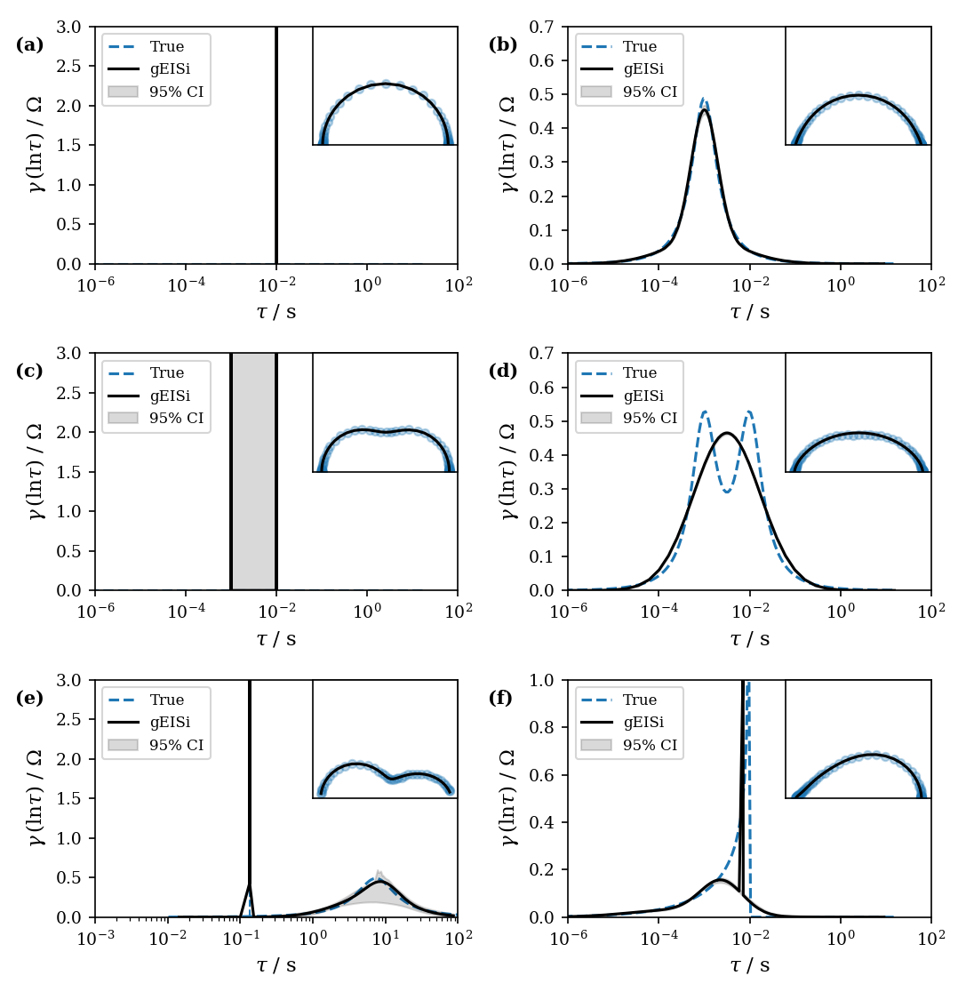

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


<IPython.core.display.Javascript object>


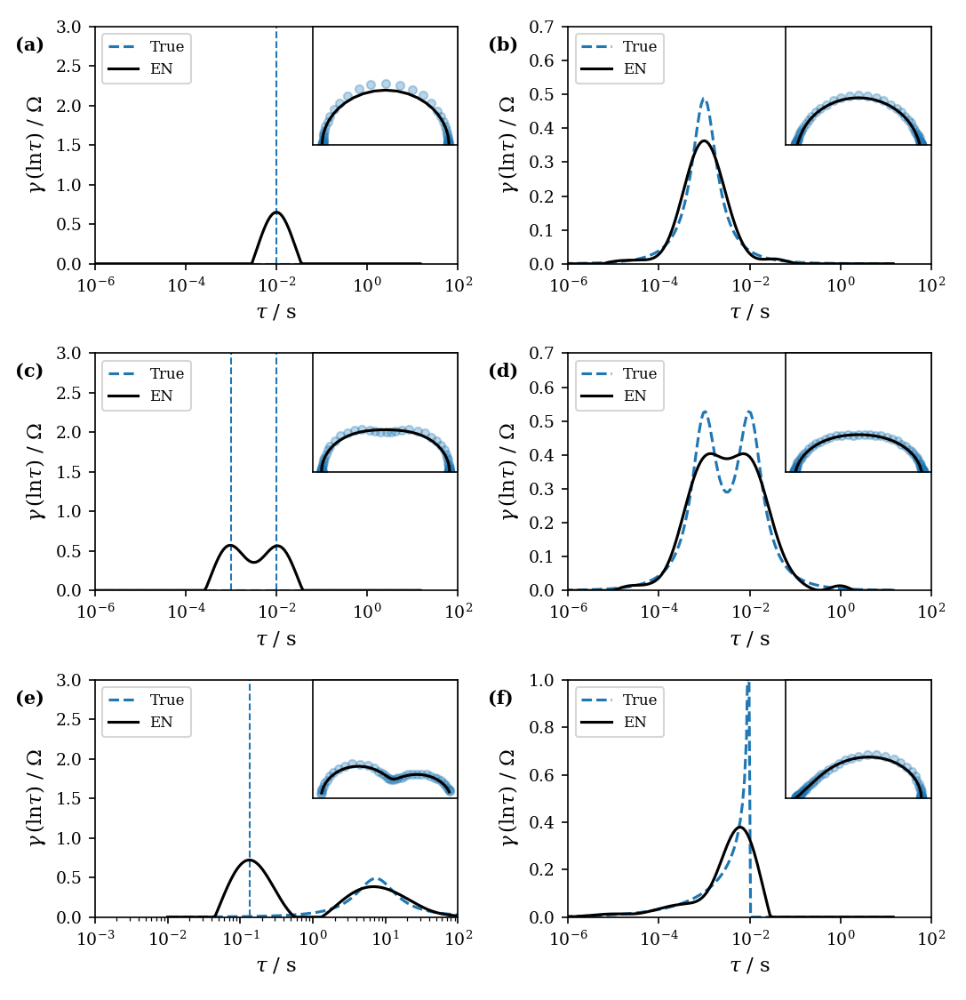

In [828]:
for model,nonneg in zip(['HB','gEISi','EN'],[False,True,True]):
    fig,axes = plot_all_sim_drts([model],'uniform',0.25,nonneg=nonneg)

    fig.savefig(os.path.join(plotdir,f'{model}_DRTs_AllSimData_uniform_0.25.jpg'),dpi=500)
    fig.savefig(os.path.join(latexdir,f'{model}_DRTs_AllSimData_uniform_0.25.pdf'),dpi=500)

In [8]:
def compare_sim_drt(circ,err_model,noise_level,subfig_labels=True,axes=None,trunc_tau_plot=True,tmin=None,tmax=None,
                   models='all',f_betas=[1e-2,1e-1,1]):
    if axes is None:
        if models=='all':
            fig, axes = plt.subplots(3,2,figsize=(7.25,7.5))
        else:
            axis_idx = [model_info[model]['order'] for model in models]
            num_axes = len(np.unique(axis_idx)) + 1
            nrow = int(np.ceil(num_axes/2))
            fig, axes = plt.subplots(nrow,2,figsize=(7.25,2.5*nrow))
    else:
        fig = axes[0].get_figure()
        
    # share y axes for all DRT plots
    axes[0,1].get_shared_y_axes().join(*axes.ravel()[1:])
    axes[0,1].get_shared_x_axes().join(*axes.ravel()[1:])
    
    # get filename suffix
    if noise_level==0:
        suffix = f'{circ}_noiseless'
    else:
        suffix = f'{circ}_{err_model}_{noise_level}'
        
    # plot impedance data
    Z_file = os.path.join(data_path,'simulated',f'Z_{circ}_noiseless.csv')
    Zn_file = os.path.join(data_path,'simulated',f'Z_{suffix}.csv')
    Zdf = pd.read_csv(Z_file)
    Zndf = pd.read_csv(Zn_file)
    gt.plot_nyquist(Zdf,ax=axes[0,0],label='True',plot_func='plot',ls='--',label_size=label_size)
    gt.plot_nyquist(Zndf,ax=axes[0,0],label='Data',s=30,alpha=0.5,label_size=label_size)
    if circ in ['ZARC-RL','trunc']:
        # indicate zero Z''
        axes[0,0].axhline(0,lw=0.7,c='k',zorder=-10)
    else:
        axes[0,0].set_ylim(0,axes[0,0].get_ylim()[1])
    
    # plot true DRT on all DRT axes
    for ax in axes.ravel()[1:]:
        plot_true_drt(circ,ax,trunc_tau_plot,Zdf,ls='--',c=default_colors[0],tmin=tmin,tmax=tmax)
        
    # plot model DRTs
    if models=='all':
        models = list(model_info.keys())
        model_orders = {model:model_info[model]['order'] for model in models}
    else:
        orig_orders = np.array([model_info[model]['order'] for model in models])
        sort_idx = np.argsort(orig_orders)
        sorted_models = np.array(models)[sort_idx]
        sorted_orders = orig_orders[sort_idx]
        model_orders = {}
        prev_orig_order = -1
        prev_order = -1
        for model, orig_order in zip(sorted_models,sorted_orders):
            if orig_order==prev_orig_order:
                new_order = orig_order
            else:
                new_order = prev_order + 1
#             print(model,orig_order,new_order)
            model_orders[model] = new_order
            prev_order = new_order
            prev_orig_order = orig_order
        
    for model_name,order in model_orders.items():
#         info = model_info[model_name]
        
        ax = axes.ravel()[1+order]
        if circ in ['ZARC','RC']:
            inset_rect=[0.6,0.5,0.4,0.5]
        elif circ=='trunc':
            inset_rect=[0.7,0.,0.3,0.3]
        else:
            inset_rect=[0.6,0.7,0.4,0.3]
        plot_sim_fit(model_name,circ,err_model,noise_level,ax,trunc_tau_plot,f_betas=f_betas,
                     tmin=tmin,tmax=tmax,inset_rect=inset_rect)
        
    # subfigure labels
    if subfig_labels:
        for n,ax in enumerate(axes.ravel()):
            let = chr(n+97)
            ax.text(-0.25,0.9,f'({let})',transform=ax.transAxes,fontweight='bold')
        
    fig.tight_layout()
    
    return fig,axes

<IPython.core.display.Javascript object>


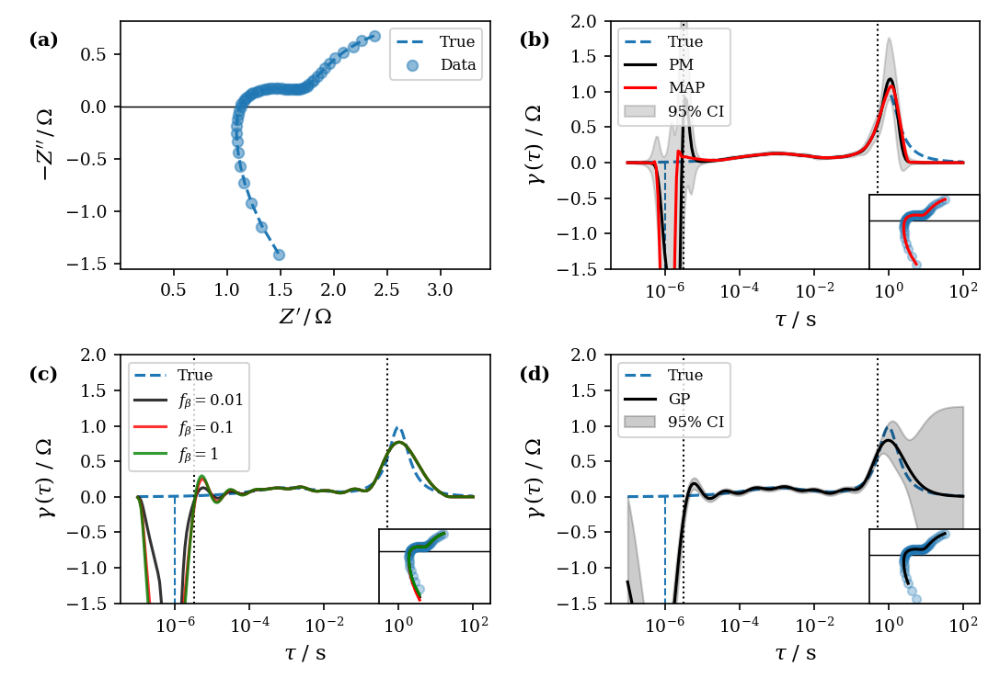

<IPython.core.display.Javascript object>


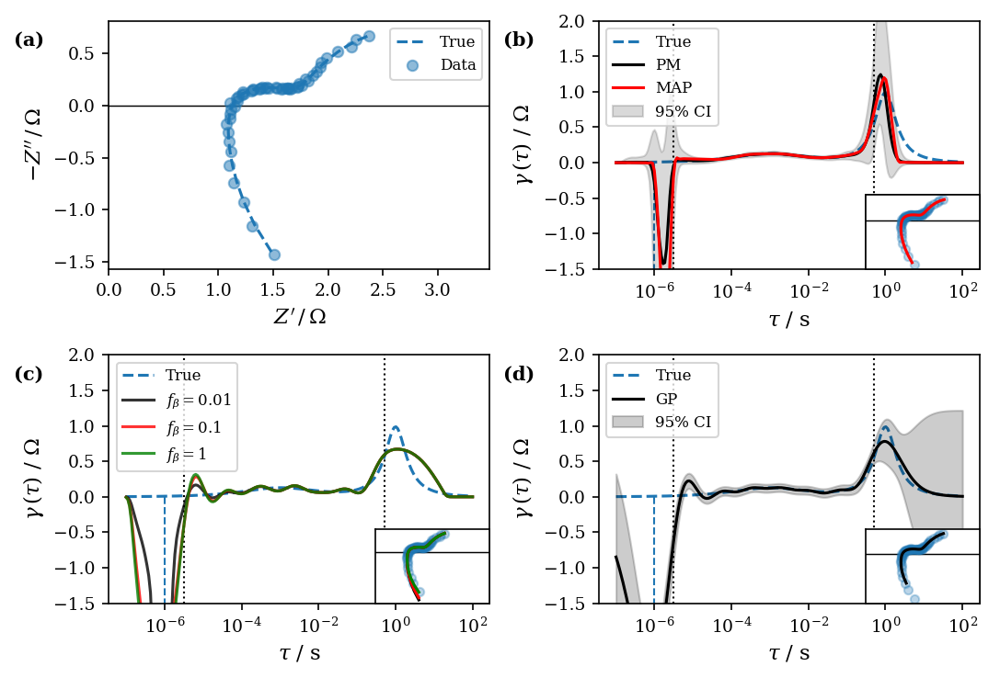

In [525]:
circ='trunc'
err_model='Macdonald'
# noise_level = 2.5

for noise_level in [0.25,1.0]:#,2.5]:
    fig,axes = compare_sim_drt(circ,err_model,noise_level,subfig_labels=True,trunc_tau_plot=False,
                              models=['PM','MAP','HB','GP'])#,tmin=1e-2,tmax=10**2.5)

#     axes[0,1].set_xlim(axes[0,1].get_xlim()[0],2e3)
#     axes[0,1].set_ylim(axes[0,1].get_ylim()[0],1)
    axes[0,1].set_ylim(-1.5,2)
#     axes[0,0].set_ylim(-0.5,0.8)

<IPython.core.display.Javascript object>


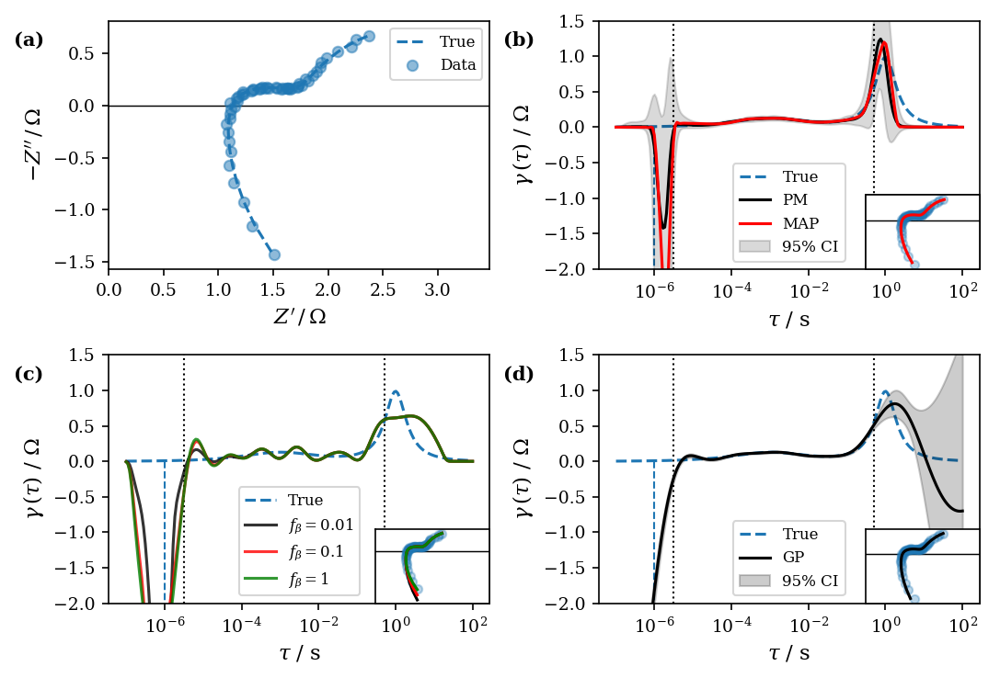

In [532]:
circ='trunc'
err_model='uniform'
noise_level = 0.25

fig,axes = compare_sim_drt(circ,err_model,noise_level,subfig_labels=True,trunc_tau_plot=False,
                           models=['PM','MAP','HB','GP'])
# axes[0,1].set_xlim(1e-6,10**1.5)
axes[0,1].set_ylim(-2,1.5)
for ax in axes.ravel()[1:]:
    ax.legend(loc='lower center')
    
fig.savefig(os.path.join(plotdir,f'DistCompare_{circ}_{err_model}_{noise_level}.png'),dpi=500)
fig.savefig(os.path.join(latexdir,f'DistCompare_{circ}_{err_model}_{noise_level}.pdf'),dpi=500)

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.


<IPython.core.display.Javascript object>


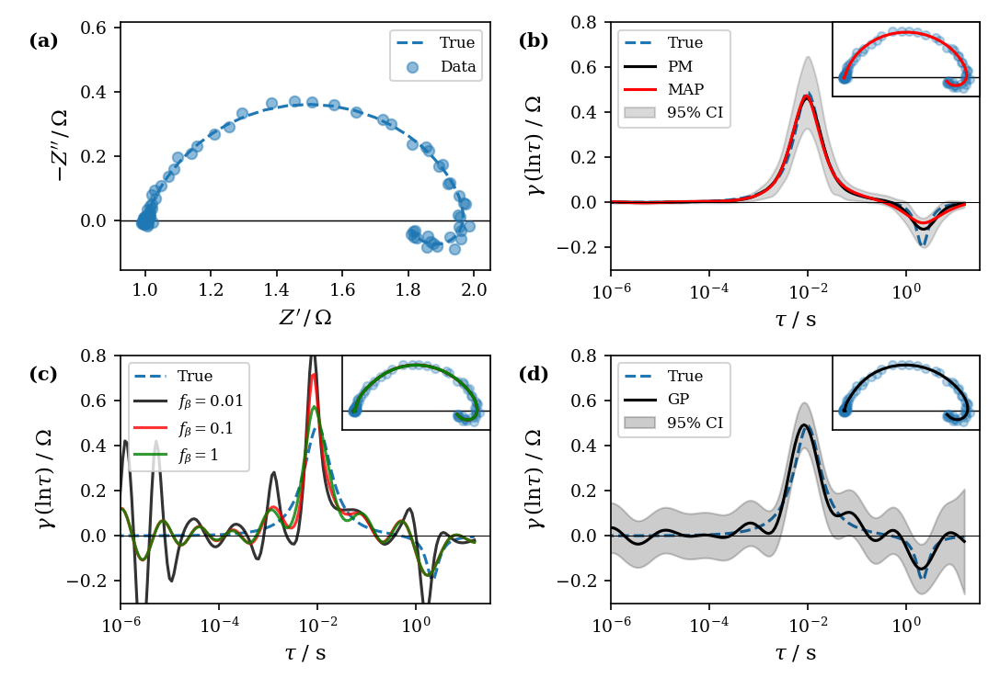

In [837]:
circ='ZARC-RL'
err_model='Orazem'
noise_level = 1.0

fig,axes = compare_sim_drt(circ,err_model,noise_level,subfig_labels=True,trunc_tau_plot=True,
                           models=['PM','MAP','HB','GP'])
axes[0,1].set_xlim(1e-6,10**1.5)
axes[0,1].set_ylim(-0.3,0.8)
for ax in axes.ravel()[1:]:
    ax.axhline(0,lw=0.5,c='k')
fig.savefig(os.path.join(plotdir,f'DistCompare_{circ}_{err_model}_{noise_level}.png'),dpi=500)
fig.savefig(os.path.join(latexdir,f'DistCompare_{circ}_{err_model}_{noise_level}.pdf'),dpi=500)

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


<IPython.core.display.Javascript object>


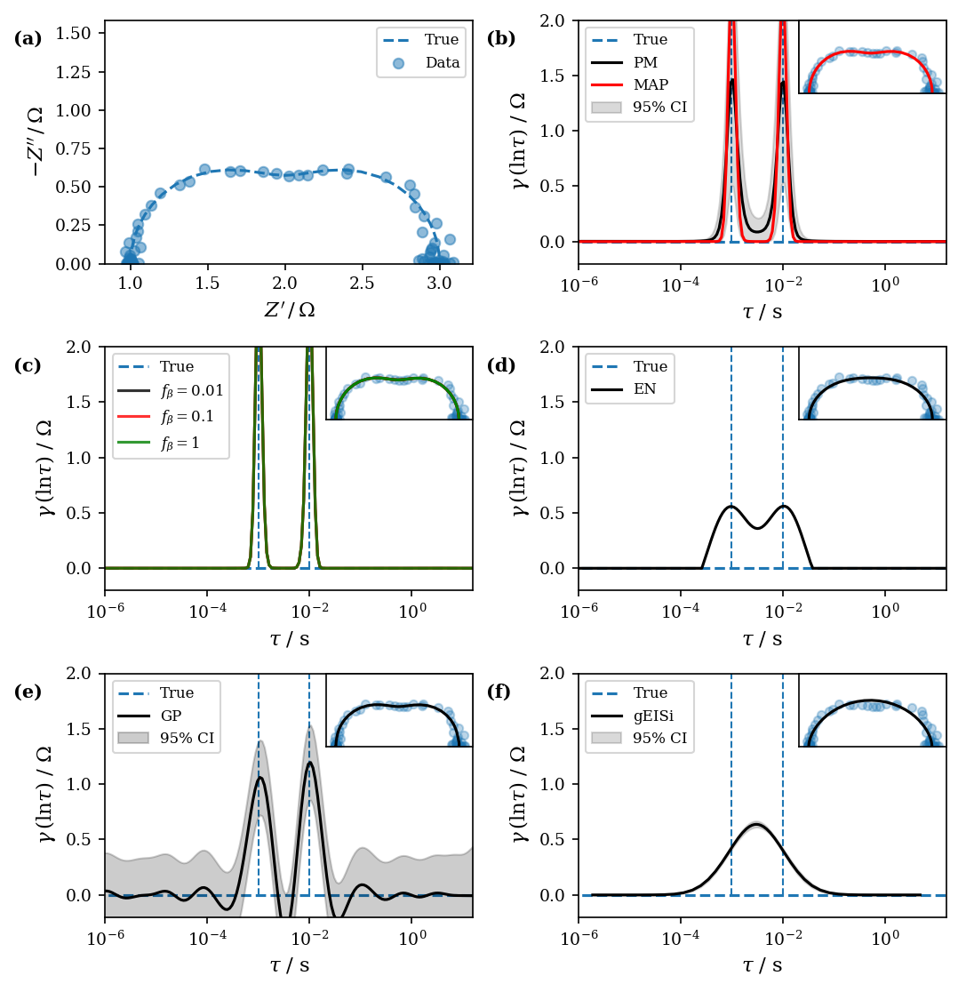

In [835]:
circ='2RC'
err_model='Macdonald'
noise_level = 1.0

fig,axes = compare_sim_drt(circ,err_model,noise_level,subfig_labels=True,trunc_tau_plot=True)
axes[0,1].set_xlim(1e-6,10**1.2)
axes[0,1].set_ylim(-0.2,2)
fig.savefig(os.path.join(plotdir,f'DistCompare_{circ}_{err_model}_{noise_level}.png'),dpi=500)
fig.savefig(os.path.join(latexdir,f'DistCompare_{circ}_{err_model}_{noise_level}.pdf'),dpi=500)

<IPython.core.display.Javascript object>


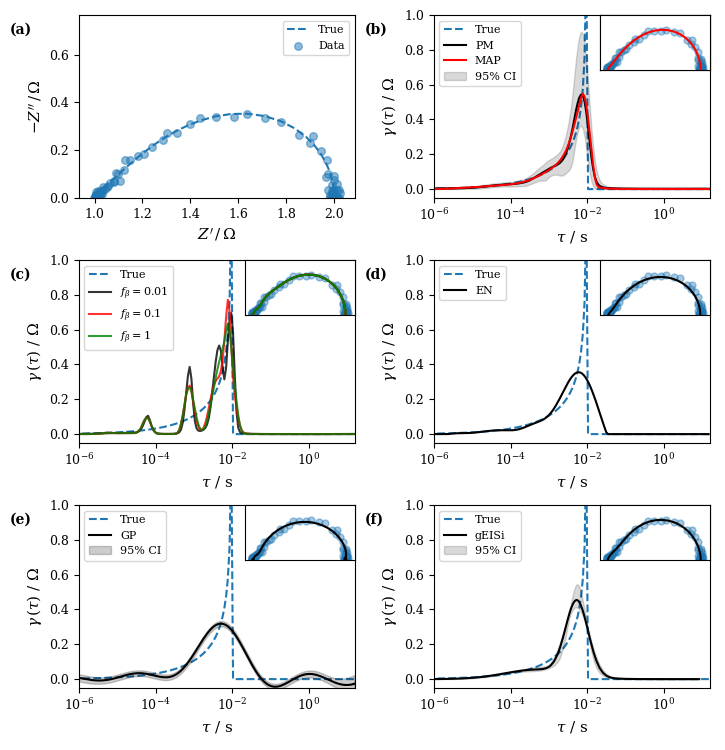

In [462]:
circ='Gerischer'
err_model='Orazem'
noise_level = 1.0

fig,axes = compare_sim_drt(circ,err_model,noise_level,subfig_labels=True,trunc_tau_plot=True)
axes[0,1].set_xlim(1e-6,10**1.2)
axes[0,1].set_ylim(-0.05,1)
fig.savefig(os.path.join(plotdir,f'DistCompare_{circ}_{err_model}_{noise_level}.png'),dpi=500)
fig.savefig(os.path.join(latexdir,f'DistCompare_{circ}_{err_model}_{noise_level}.pdf'),dpi=500)

<IPython.core.display.Javascript object>


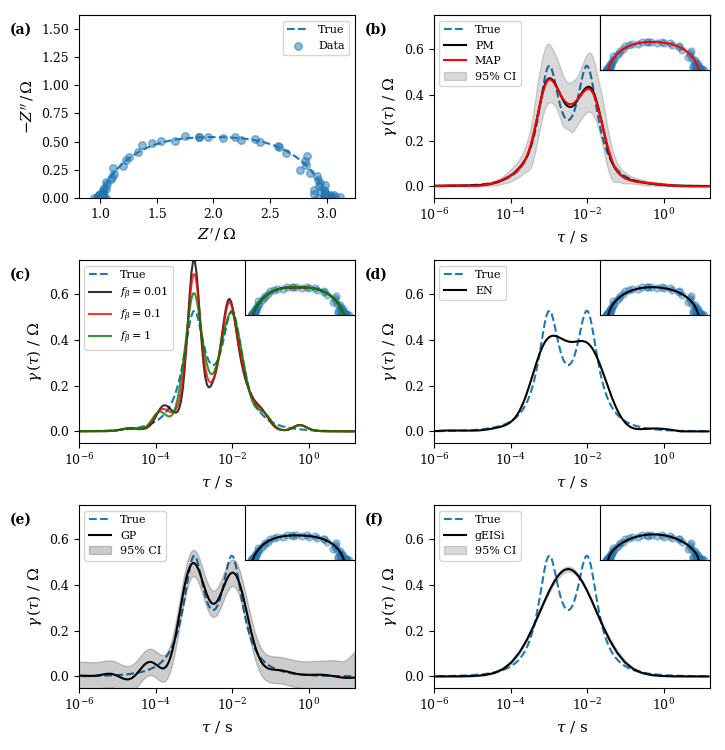

In [463]:
circ='2ZARC'
err_model='Macdonald'
noise_level = 1.0

fig,axes = compare_sim_drt(circ,err_model,noise_level,subfig_labels=True,trunc_tau_plot=True)
axes[0,1].set_xlim(1e-6,10**1.2)
axes[0,1].set_ylim(-0.05,0.75)
fig.savefig(os.path.join(plotdir,f'DistCompare_{circ}_{err_model}_{noise_level}.png'),dpi=500)
fig.savefig(os.path.join(latexdir,f'DistCompare_{circ}_{err_model}_{noise_level}.pdf'),dpi=500)

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


<IPython.core.display.Javascript object>


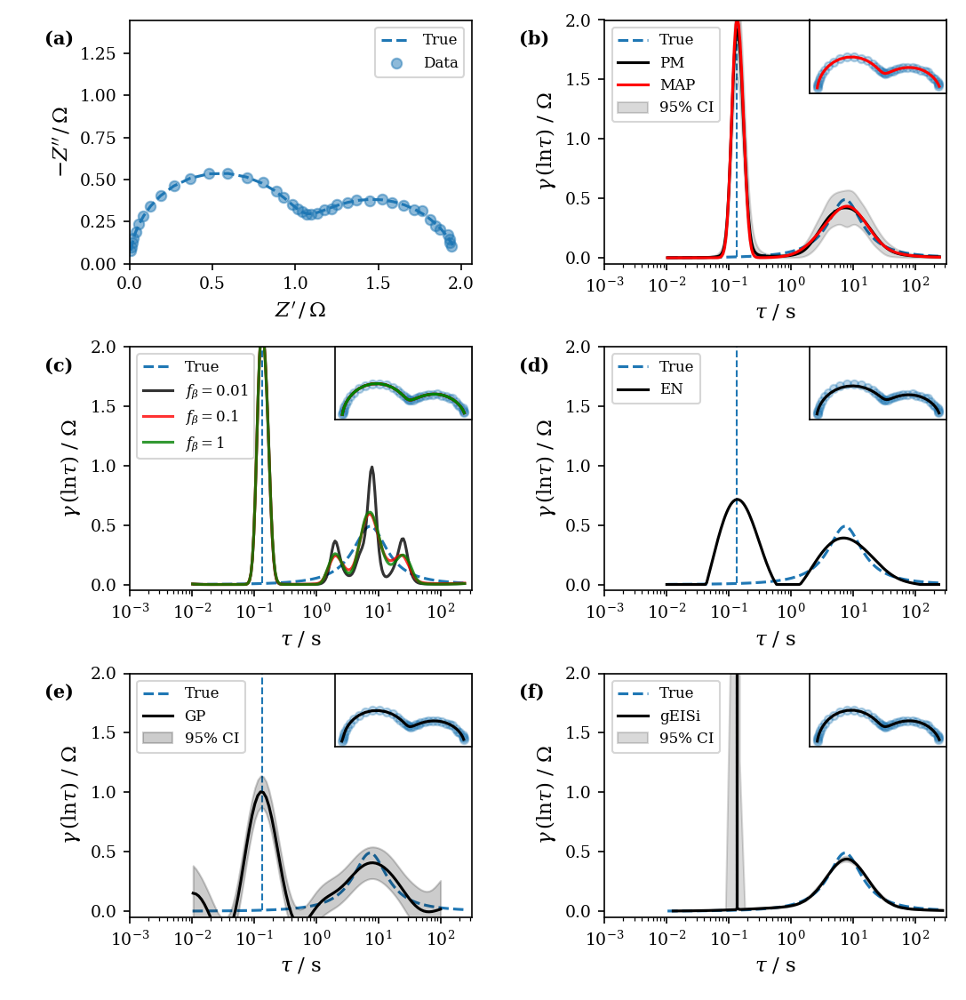

In [833]:
circ='RC-ZARC'
err_model='Orazem'
noise_level = 0.25

fig,axes = compare_sim_drt(circ,err_model,noise_level,subfig_labels=True,trunc_tau_plot=True,tmin=1e-2,tmax=10**2.5)

axes[0,0].set_xlim(0,axes[0,0].get_xlim()[1])
# axes[0,0].set_ylim(0,axes[0,0].get_ylim()[1])

axes[0,1].set_ylim(-0.05,2)
axes[0,1].set_xlim(1e-3,10**2.5)
fig.savefig(os.path.join(plotdir,f'DistCompare_{circ}_{err_model}_{noise_level}.png'),dpi=500)
fig.savefig(os.path.join(latexdir,f'DistCompare_{circ}_{err_model}_{noise_level}.pdf'),dpi=500)

## DDT

In [72]:
ddt_model_info = {'PM':{'path':'bayes_results','color':'k','order':0},
              'MAP':{'path':'map_results','color':'r','order':0},
              'HB':{'path':'comparisons/hyper-ridge/results','color':'k','order':1},
              'gEISi':{'path':'comparisons/gEISi/results','color':'k','order':2}
             }

In [73]:
def plot_true_ddt(circ,ax,trunc_tau_plot,Zdf,tmin=None,tmax=None,**kw):
    """plot true DDT"""
    if tmin is None:
        tmin = 1/(2*np.pi*Zdf['Freq'].max())
    if tmax is None:
        tmax = 1/(2*np.pi*Zdf['Freq'].min())
    
    g_file = os.path.join(data_path,'simulated',f'gamma_{circ}.csv')
    g_true = pd.read_csv(g_file)
    if trunc_tau_plot:
        g_true = g_true[(g_true['tau']>= tmin) & 
                        (g_true['tau']<= tmax)
                       ]
    ax.plot(g_true['tau'],g_true['gamma'],label='True',zorder=-10,**kw)
            
    ax.set_xscale('log')
    ax.set_xlabel(r'$\tau$ / s')
    ax.set_ylabel(r'$p \, (\ln{\tau})$')
        
def compare_sim_ddt(circ,err_model,noise_level,plot_nyquist=True,subfig_labels=True,axes=None,
                    trunc_tau_plot=True,tmin=None,tmax=None):
    if axes is None:
        if plot_nyquist:
            fig, axes = plt.subplots(2,2,figsize=(7.25,5))
        else:
            fig, axes = plt.subplots(3,1,figsize=(3.625,7.5))
    else:
        fig = axes[0].get_figure()
        
    if plot_nyquist:
        ddt_axes = axes.ravel()[1:]
    else:
        ddt_axes = axes.ravel()
        
    # share y axes for all DDT plots
    ddt_axes[0].get_shared_y_axes().join(*ddt_axes.ravel())
    ddt_axes[0].get_shared_x_axes().join(*ddt_axes.ravel())
        
    # get filename suffix
    if noise_level==0:
        suffix = f'{circ}_noiseless'
    else:
        suffix = f'{circ}_{err_model}_{noise_level}'
        
    # plot impedance data
    Z_file = os.path.join(data_path,'simulated',f'Z_{circ}_noiseless.csv')
    Zn_file = os.path.join(data_path,'simulated',f'Z_{suffix}.csv')
    Zdf = pd.read_csv(Z_file)
    Zndf = pd.read_csv(Zn_file)
    if plot_nyquist:
        gt.plot_nyquist(Zdf,ax=axes[0,0],label='True',plot_func='plot',ls='--',label_size=label_size)
        gt.plot_nyquist(Zndf,ax=axes[0,0],label='Data',s=30,alpha=0.5,label_size=label_size)
    
    # plot true DDT on all DDT axes
    for ax in ddt_axes:
        plot_true_ddt(circ,ax,trunc_tau_plot,Zdf,tmin=tmin,tmax=tmax,ls='--',c=default_colors[0])
        
    # plot model DDTs
    for model_name,info in ddt_model_info.items():
        order = info['order']
        ax = ddt_axes[order]
        if circ=='BimodalTP-DDT':
            inset_rect = [0.6,0.7,0.4,0.3]
        elif circ=='BimodalBP-DDT':
            inset_rect = [0.75,0.5,0.25,0.5]
        plot_sim_fit(model_name,circ,err_model,noise_level,ax,trunc_tau_plot,tmin=tmin,tmax=tmax,
                     f_betas=[1e-2,1e-1,1],inset_rect=inset_rect)
        
    # subfigure labels
    if subfig_labels:
        for n,ax in enumerate(axes.ravel()):
            let = chr(n+97)
            ax.text(-0.25,0.9,f'({let})',transform=ax.transAxes,fontweight='bold')
        
    fig.tight_layout()
    
    return fig,axes

<IPython.core.display.Javascript object>


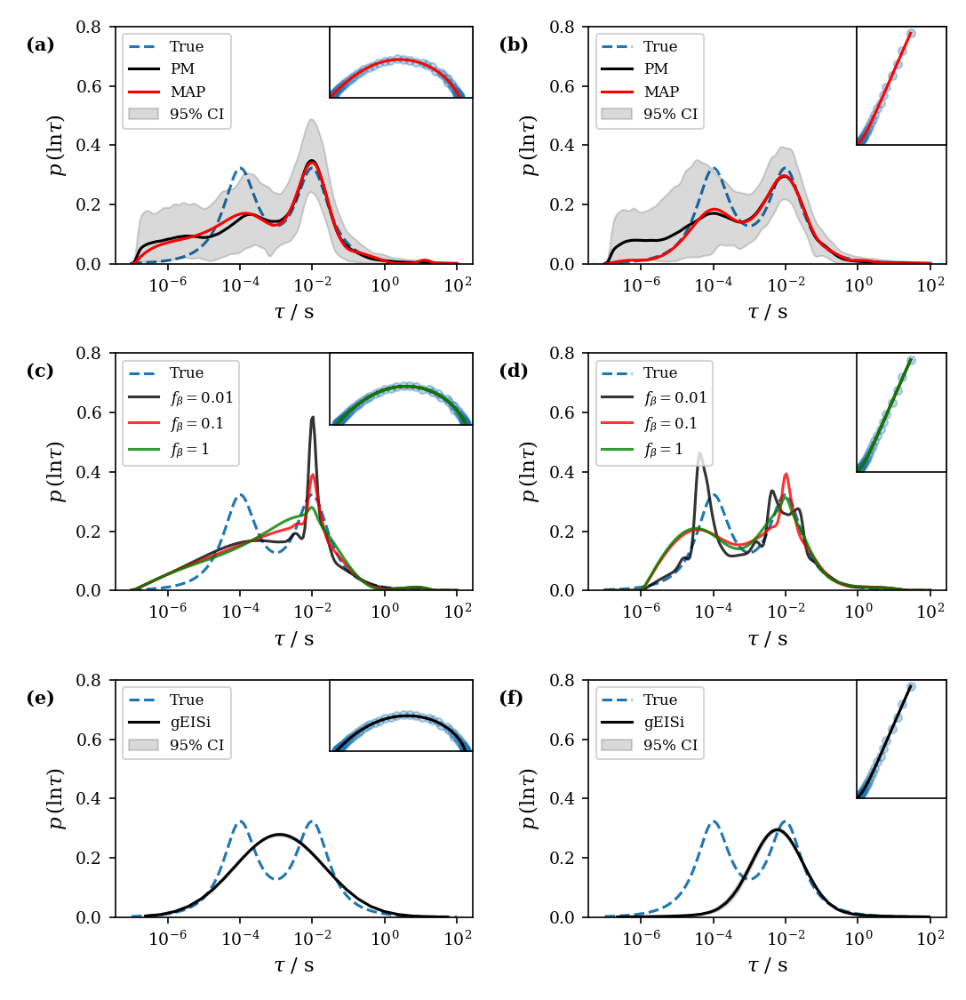

In [85]:
fig,axes = plt.subplots(3,2,figsize=(7.25,7.5))
err_model='Orazem'
noise_level = 0.25

circ='BimodalTP-DDT'
fig,axes1 = compare_sim_ddt(circ,err_model,noise_level,subfig_labels=False,trunc_tau_plot=True,tmin=1e-7,tmax=1e2,
                           plot_nyquist=False,axes=axes[:,0])

circ='BimodalBP-DDT'
fig,axes2 = compare_sim_ddt(circ,err_model,noise_level,subfig_labels=False,trunc_tau_plot=True,tmin=1e-7,tmax=1e2,
                           plot_nyquist=False,axes=axes[:,1])

axes[0,0].set_ylim(0,0.8)
axes[0,1].set_ylim(0,0.8)

for n,ax in enumerate(axes.ravel()):
    let = chr(n+97)
    ax.text(-0.25,0.9,f'({let})',transform=ax.transAxes,fontweight='bold')

fig.tight_layout()
# fig.savefig(os.path.join(plotdir,f'DistCompare_TpDDT_{err_model}.png'),dpi=500)
fig.savefig(os.path.join(latexdir,f'DistCompare_BothDDTs_{err_model}.pdf'),dpi=500)

<IPython.core.display.Javascript object>


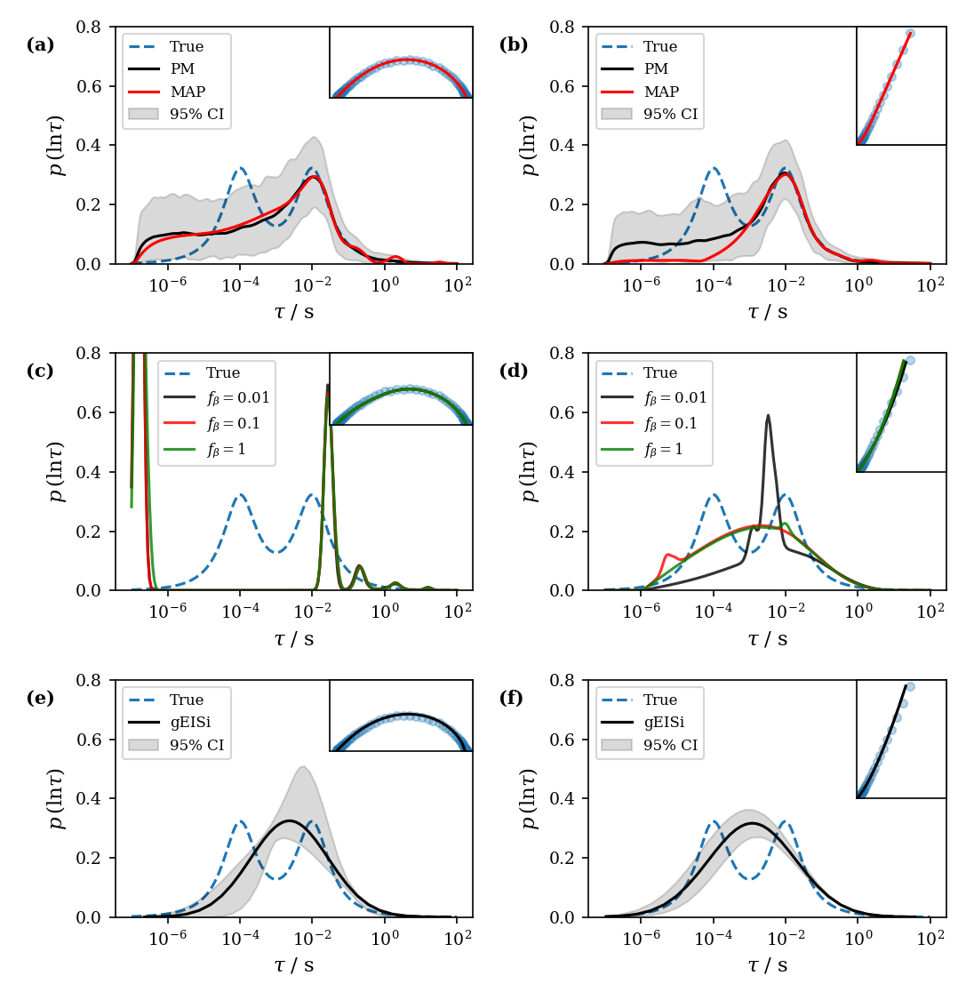

In [89]:
fig,axes = plt.subplots(3,2,figsize=(7.25,7.5))
err_model='uniform'
noise_level = 0.25

circ='BimodalTP-DDT'
fig,axes1 = compare_sim_ddt(circ,err_model,noise_level,subfig_labels=False,trunc_tau_plot=True,tmin=1e-7,tmax=1e2,
                           plot_nyquist=False,axes=axes[:,0])

circ='BimodalBP-DDT'
fig,axes2 = compare_sim_ddt(circ,err_model,noise_level,subfig_labels=False,trunc_tau_plot=True,tmin=1e-7,tmax=1e2,
                           plot_nyquist=False,axes=axes[:,1])

axes[0,0].set_ylim(0,0.8)
axes[0,1].set_ylim(0,0.8)

axes[1,0].legend(loc='upper left',bbox_to_anchor=(0.1,1))

for n,ax in enumerate(axes.ravel()):
    let = chr(n+97)
    ax.text(-0.25,0.9,f'({let})',transform=ax.transAxes,fontweight='bold')

fig.tight_layout()
# fig.savefig(os.path.join(plotdir,f'DistCompare_TpDDT_{err_model}.png'),dpi=500)
fig.savefig(os.path.join(latexdir,f'DistCompare_BothDDTs_{err_model}.pdf'),dpi=500)

<IPython.core.display.Javascript object>


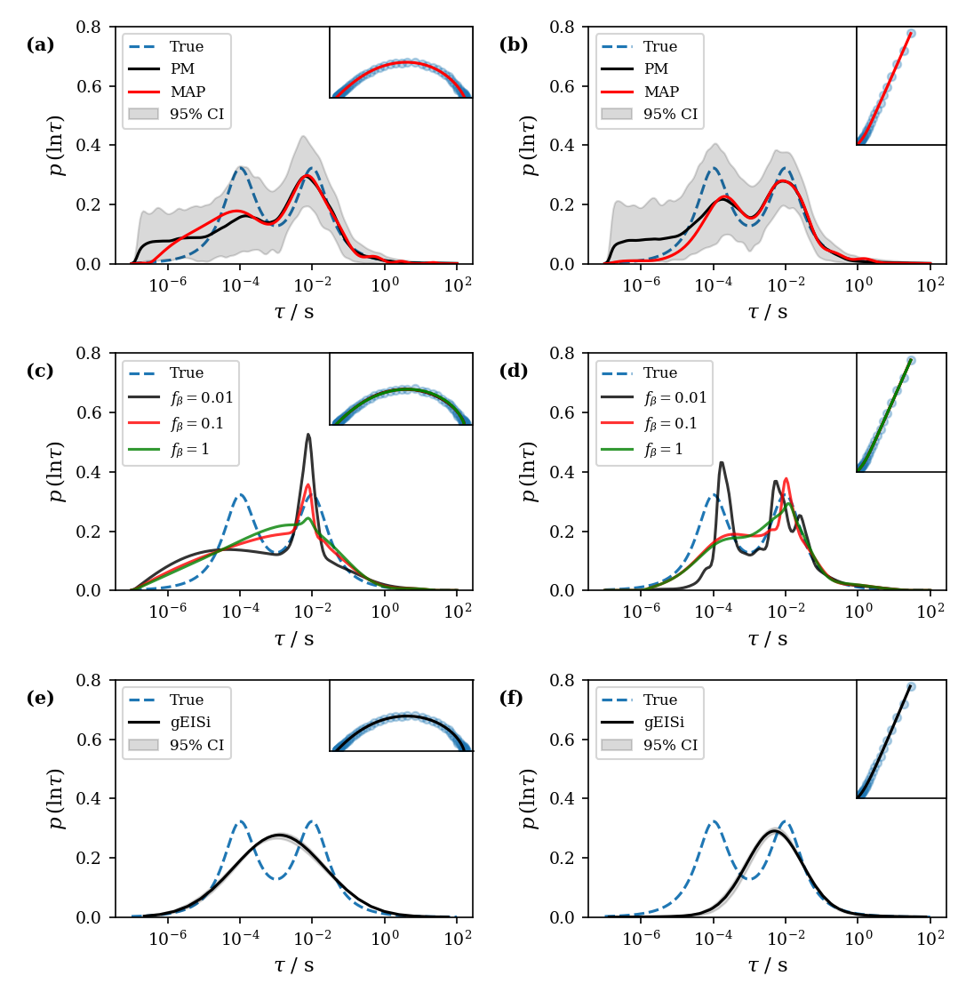

In [87]:
fig,axes = plt.subplots(3,2,figsize=(7.25,7.5))
err_model='Macdonald'
noise_level = 0.25

circ='BimodalTP-DDT'
fig,axes1 = compare_sim_ddt(circ,err_model,noise_level,subfig_labels=False,trunc_tau_plot=True,tmin=1e-7,tmax=1e2,
                           plot_nyquist=False,axes=axes[:,0])

circ='BimodalBP-DDT'
fig,axes2 = compare_sim_ddt(circ,err_model,noise_level,subfig_labels=False,trunc_tau_plot=True,tmin=1e-7,tmax=1e2,
                           plot_nyquist=False,axes=axes[:,1])

axes[0,0].set_ylim(0,0.8)
axes[0,1].set_ylim(0,0.8)

for n,ax in enumerate(axes.ravel()):
    let = chr(n+97)
    ax.text(-0.25,0.9,f'({let})',transform=ax.transAxes,fontweight='bold')

fig.tight_layout()
# fig.savefig(os.path.join(plotdir,f'DistCompare_TpDDT_{err_model}.png'),dpi=500)
fig.savefig(os.path.join(latexdir,f'DistCompare_BothDDTs_{err_model}.pdf'),dpi=500)

<IPython.core.display.Javascript object>


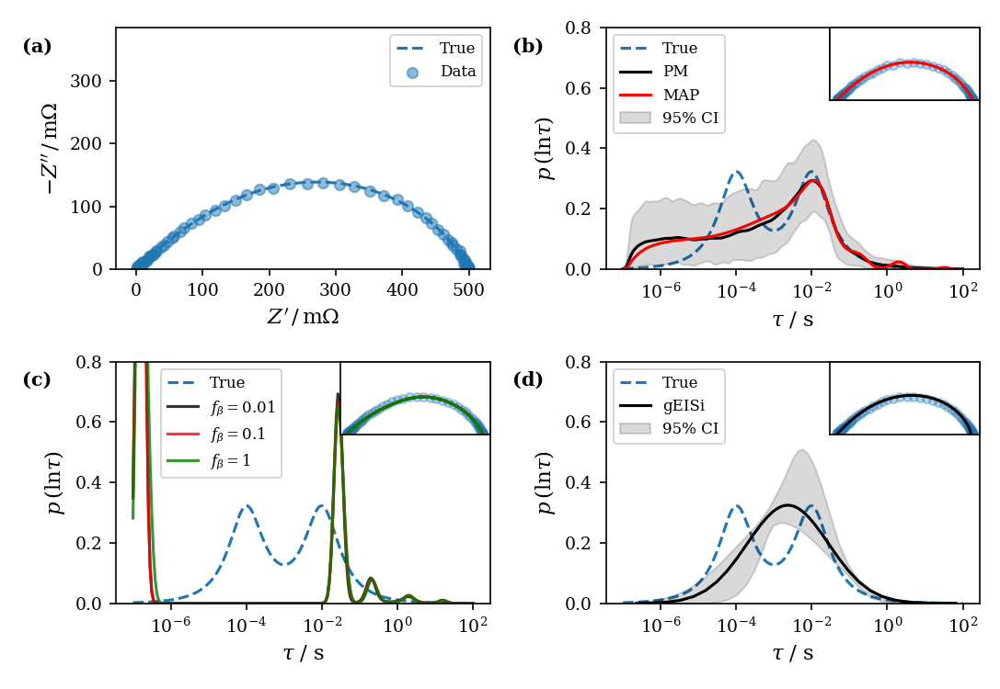

In [77]:
circ='BimodalTP-DDT'
err_model='uniform'
noise_level = 0.25

fig,axes = compare_sim_ddt(circ,err_model,noise_level,subfig_labels=True,trunc_tau_plot=True,tmin=1e-7,tmax=1e2,
                           plot_nyquist=True)

axes[0,1].set_ylim(0,0.8)
axes[1,0].legend(loc='upper left',bbox_to_anchor=(0.1,1))
fig.tight_layout()
# fig.savefig(os.path.join(plotdir,f'DistCompare_TpDDT_{err_model}.png'),dpi=500)
# fig.savefig(os.path.join(latexdir,f'DistCompare_TpDDT_{err_model}.pdf'),dpi=500)

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


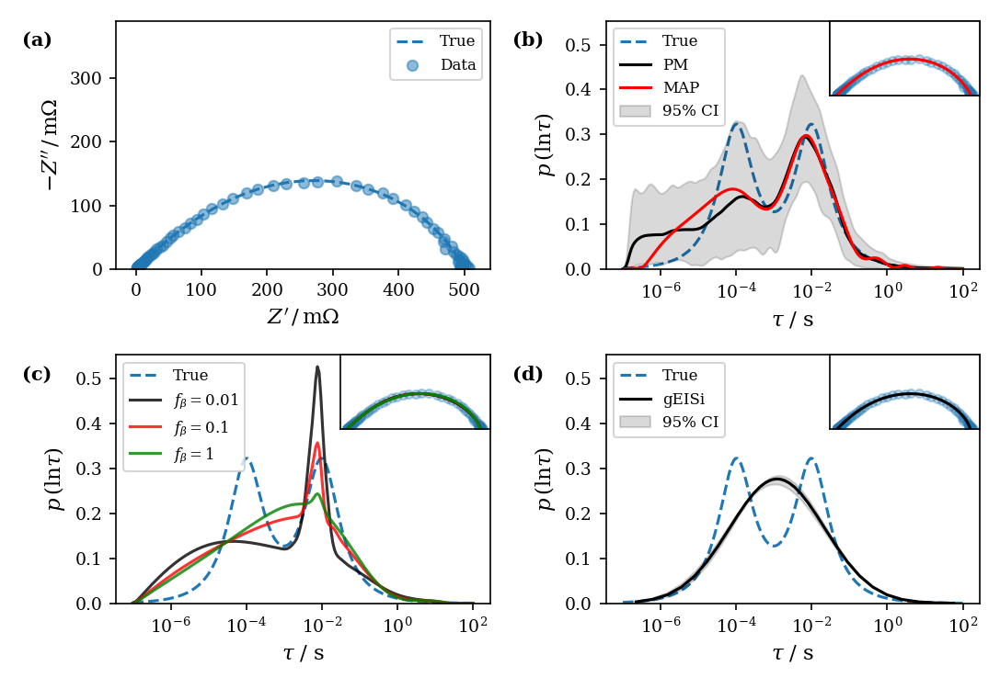

In [936]:
circ='BimodalTP-DDT'
err_model='Macdonald'
noise_level = 0.25

fig,axes = compare_sim_ddt(circ,err_model,noise_level,subfig_labels=True,trunc_tau_plot=True,tmin=1e-7,tmax=1e2)

axes[0,1].set_ylim(0,axes[0,1].get_ylim()[1])
fig.tight_layout()
fig.savefig(os.path.join(plotdir,f'DistCompare_TpDDT_{err_model}.png'),dpi=500)
fig.savefig(os.path.join(latexdir,f'DistCompare_TpDDT_{err_model}.pdf'),dpi=500)

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


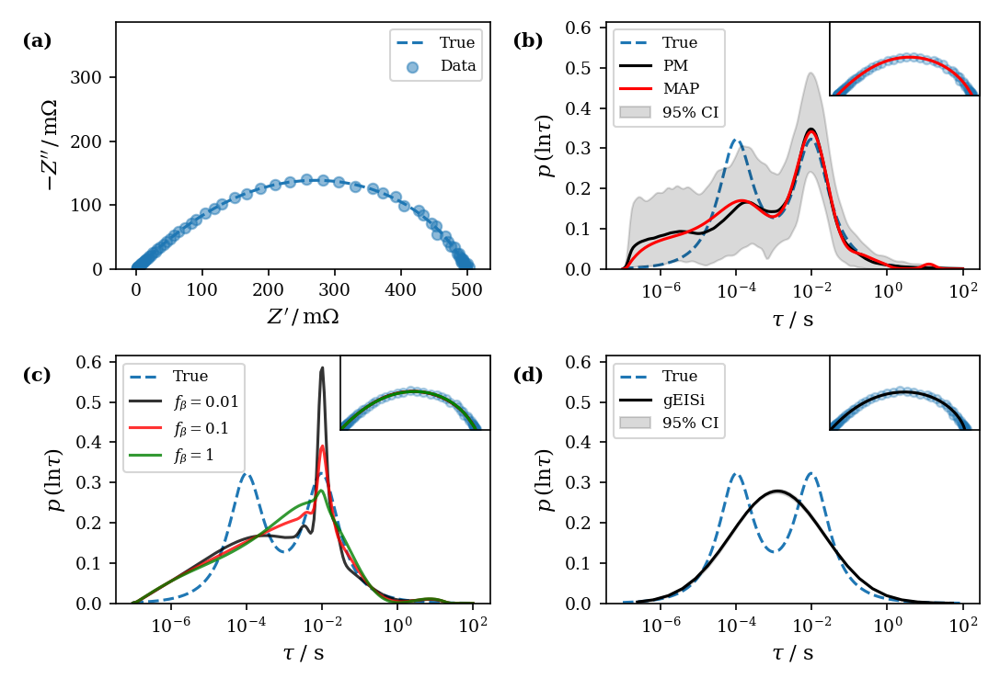

In [937]:
circ='BimodalTP-DDT'
err_model='Orazem'
noise_level = 0.25

fig,axes = compare_sim_ddt(circ,err_model,noise_level,subfig_labels=True,trunc_tau_plot=True,tmin=1e-7,tmax=1e2)

axes[0,1].set_ylim(0,axes[0,1].get_ylim()[1])
fig.tight_layout()
# fig.savefig(os.path.join(plotdir,f'DistCompare_TpDDT_{err_model}.png'),dpi=500)
# fig.savefig(os.path.join(latexdir,f'DistCompare_TpDDT_{err_model}.pdf'),dpi=500)

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


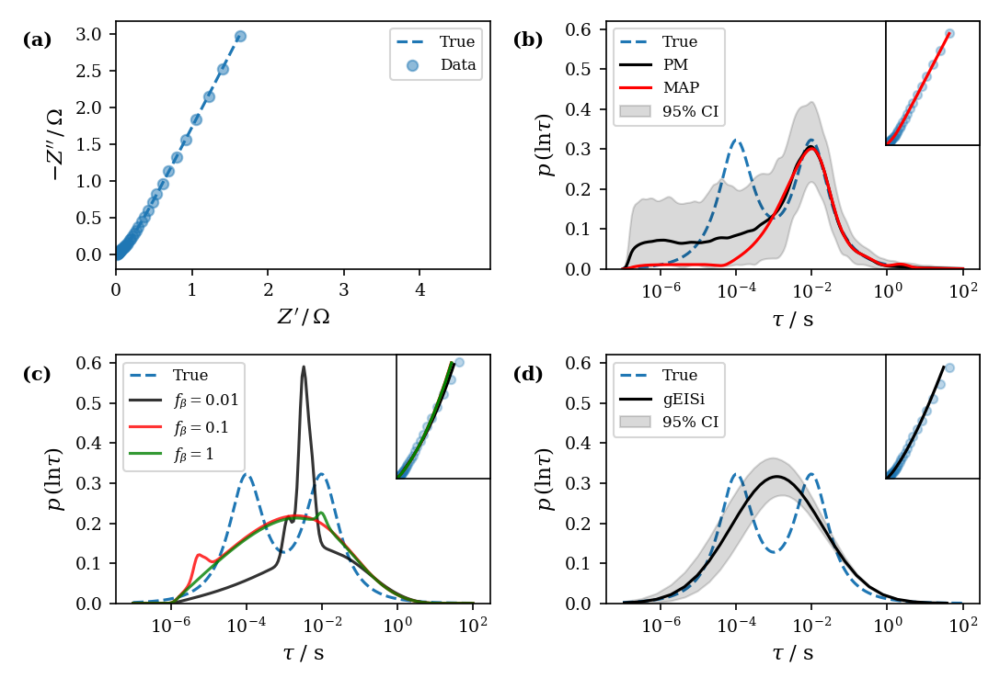

In [938]:
circ='BimodalBP-DDT'
err_model='uniform'
noise_level = 0.25

fig,axes = compare_sim_ddt(circ,err_model,noise_level,subfig_labels=True,trunc_tau_plot=True,tmin=1e-7,tmax=1e2)

axes[0,1].set_ylim(0,axes[0,1].get_ylim()[1])
fig.tight_layout()
fig.savefig(os.path.join(plotdir,f'DistCompare_BpDDT_{err_model}.png'),dpi=500)
fig.savefig(os.path.join(latexdir,f'DistCompare_BpDDT_{err_model}.pdf'),dpi=500)

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


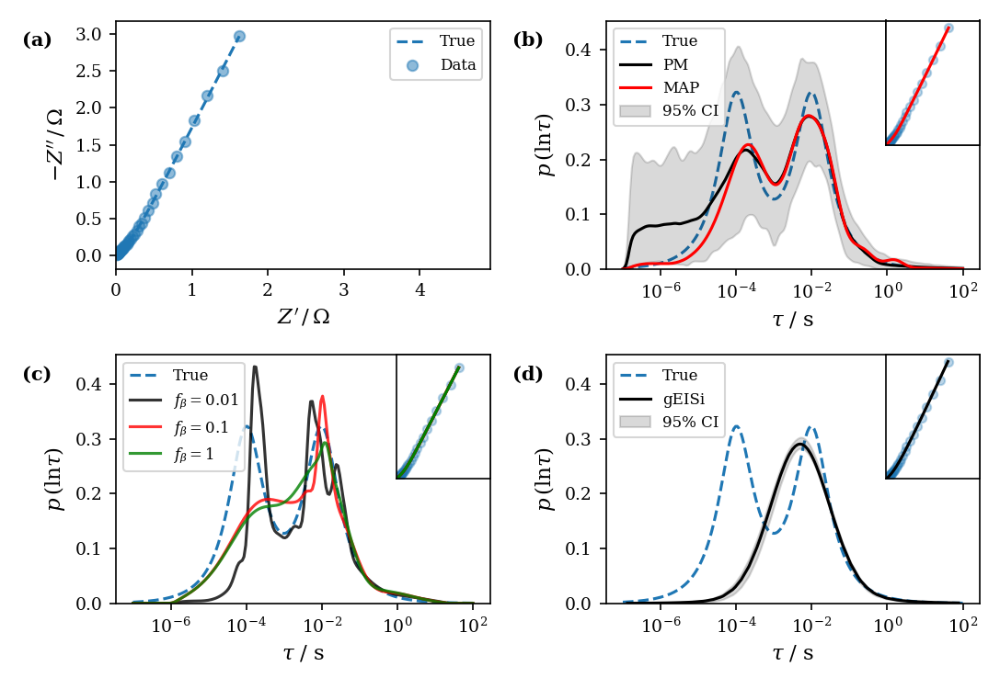

In [939]:
circ='BimodalBP-DDT'
err_model='Macdonald'
noise_level = 0.25

fig,axes = compare_sim_ddt(circ,err_model,noise_level,subfig_labels=True,trunc_tau_plot=True,tmin=1e-7,tmax=1e2)

axes[0,1].set_ylim(0,axes[0,1].get_ylim()[1])
fig.tight_layout()
fig.savefig(os.path.join(plotdir,f'DistCompare_BpDDT_{err_model}.png'),dpi=500)
fig.savefig(os.path.join(latexdir,f'DistCompare_BpDDT_{err_model}.pdf'),dpi=500)

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


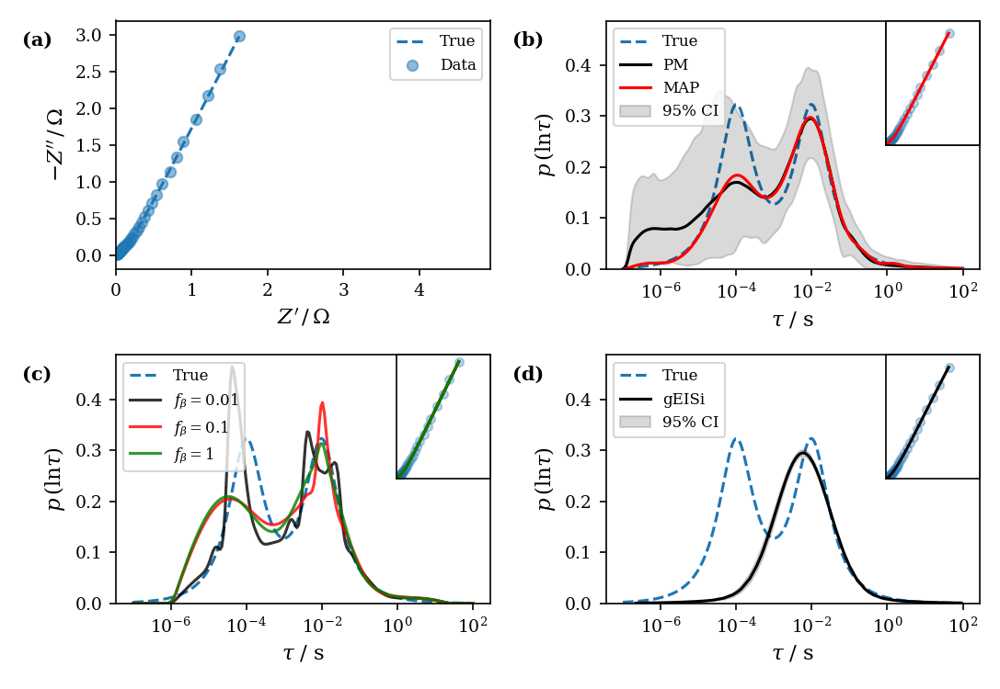

In [940]:
circ='BimodalBP-DDT'
err_model='Orazem'
noise_level = 0.25

fig,axes = compare_sim_ddt(circ,err_model,noise_level,subfig_labels=True,trunc_tau_plot=True,tmin=1e-7,tmax=1e2)

axes[0,1].set_ylim(0,axes[0,1].get_ylim()[1])
fig.tight_layout()
fig.savefig(os.path.join(plotdir,f'DistCompare_BpDDT_{err_model}.png'),dpi=500)
fig.savefig(os.path.join(latexdir,f'DistCompare_BpDDT_{err_model}.pdf'),dpi=500)

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


<IPython.core.display.Javascript object>


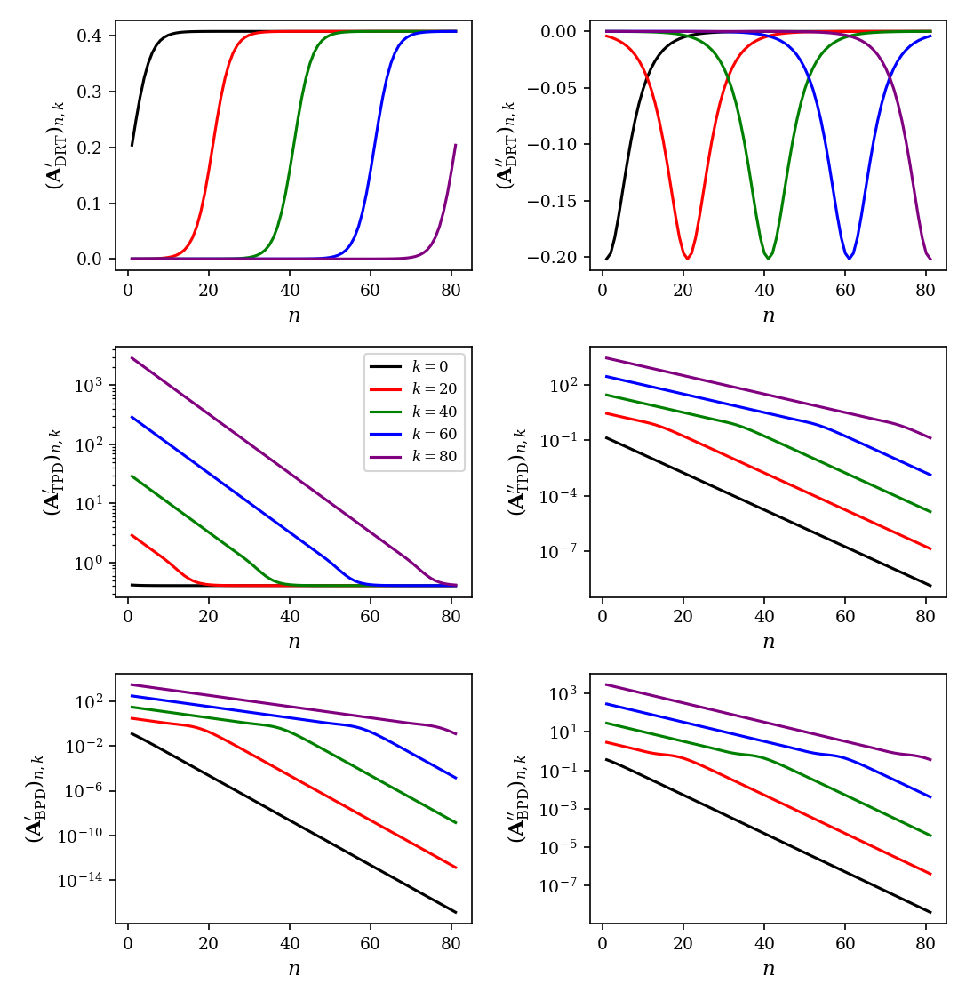

In [869]:
# compare A matrices for DRT and DDT

dr_s2p = load_pickle(os.path.join(model_info['PM']['path'],'obj_DRT-TpDDT-BpDDT_uniform_0.25.pkl'))
# dr_s2p = drt.DRT(distributions = )
freq = dr_s2p.basis_freq

fig,axes = plt.subplots(3,2,figsize=(7.25,7.5))

for dist,axrow in zip(['DRT','TP-DDT','BP-DDT'],axes):
    A_re = dr_s2p.distribution_matrices[dist]['A_re']
    A_im = dr_s2p.distribution_matrices[dist]['A_im']
    
    for col,color in zip([0,20,40,60,80],['k','r','g','b','purple']):
        n = np.arange(1,A_re.shape[0]+1)
        axrow[0].plot(n,A_re[:,col],label=f'$k={col}$',c=color)
        axrow[1].plot(n,A_im[:,col],label=f'$k={col}$',c=color)
        
        if dist=='TP-DDT':
            sub = 'TPD'
        elif dist=='BP-DDT':
            sub = 'BPD'
        else:
            sub = dist
        
        axrow[0].set_ylabel(f'$(\mathbf{{A}}^{{\prime}}_{{\mathrm{{{sub}}}}})_{{n,k}}$')
        axrow[1].set_ylabel(f'$(\mathbf{{A}}^{{\prime\prime}}_{{\mathrm{{{sub}}}}})_{{n,k}}$')
                     
for ax in axes.ravel():
#     ax.set_xscale('log')
#     ax.set_xlabel('$f$ / Hz')
    ax.set_xlabel('$n$')
    
for ax in axes.ravel()[2:]:
    ax.set_yscale('log')
    
axes[1,0].legend()
    
fig.tight_layout()
fig.savefig(os.path.join(latexdir,'A_mat_columns.pdf'),dpi=500)
    

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


<IPython.core.display.Javascript object>


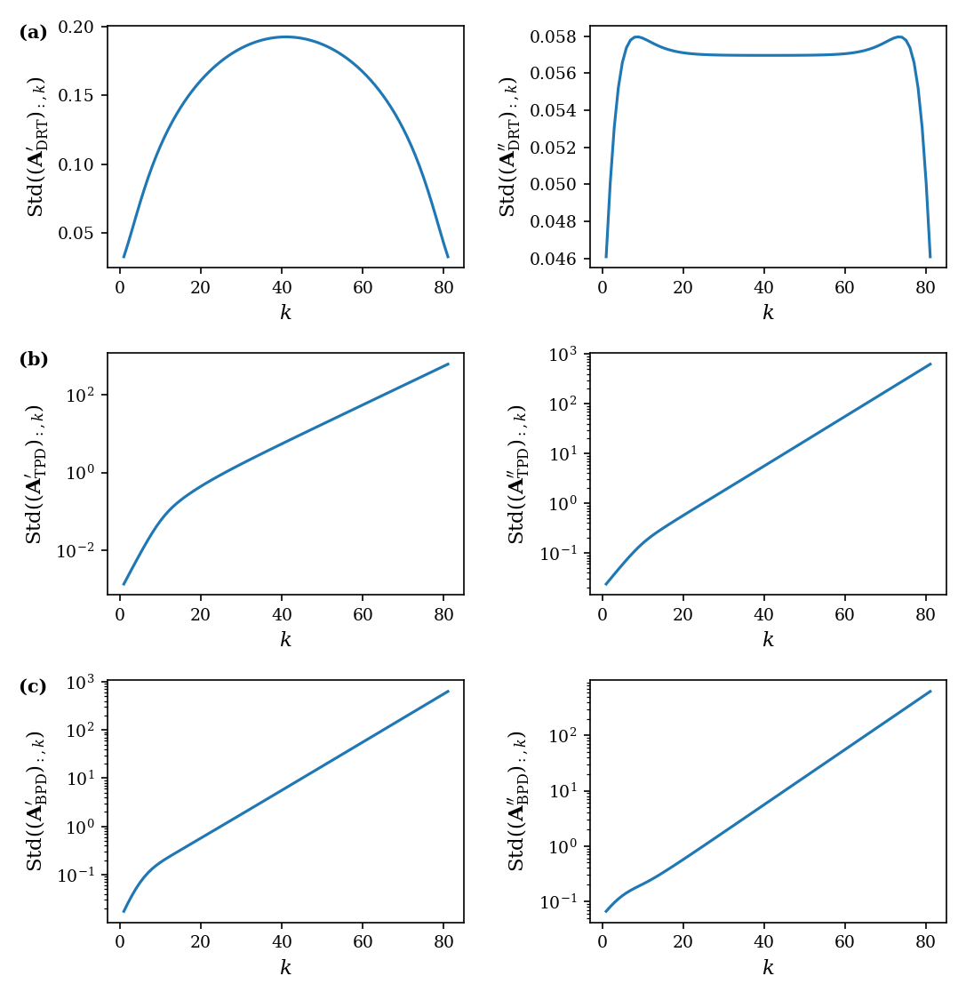

In [886]:
# compare A matrices for DRT and DDT

dr_s2p = load_pickle(os.path.join(model_info['PM']['path'],'obj_DRT-TpDDT-BpDDT_uniform_0.25.pkl'))
# dr_s2p = drt.DRT(distributions = )
freq = dr_s2p.basis_freq

fig,axes = plt.subplots(3,2,figsize=(7.25,7.5))

for dist,axrow in zip(['DRT','TP-DDT','BP-DDT'],axes):
    A_re = dr_s2p.distribution_matrices[dist]['A_re']
    A_im = dr_s2p.distribution_matrices[dist]['A_im']
    
    
    k = np.arange(1,A_re.shape[1]+1)
    recol_std = np.std(A_re,axis=0)
    imcol_std = np.std(A_im,axis=0)
    axrow[0].plot(k,recol_std)
    axrow[1].plot(k,imcol_std)
        
    if dist=='TP-DDT':
        sub = 'TPD'
    elif dist=='BP-DDT':
        sub = 'BPD'
    else:
        sub = dist

    axrow[0].set_ylabel(f'$\mathrm{{Std}} ( (\mathbf{{A}}^{{\prime}}_{{\mathrm{{{sub}}}}})_{{:,k}} )$')
    axrow[1].set_ylabel(f'$\mathrm{{Std}} ( (\mathbf{{A}}^{{\prime\prime}}_{{\mathrm{{{sub}}}}})_{{:,k}} )$')
                     
for ax in axes.ravel():
#     ax.set_xscale('log')
#     ax.set_xlabel('$f$ / Hz')
    ax.set_xlabel('$k$')
    
for ax in axes.ravel()[2:]:
    ax.set_yscale('log')
    
for n,ax in enumerate(axes[:,0]):
    let = chr(n+97)
    ax.text(-0.25,0.95,f'({let})',transform=ax.transAxes,fontweight='bold')
    
    
    
fig.tight_layout()
fig.savefig(os.path.join(latexdir,'A_mat_columnStd.pdf'),dpi=500)
    

## DRT-TpDDT

In [11]:
def plot_true_dist(circ,dist_name,ax,trunc_tau_plot,Zdf,tmin=None,tmax=None,**kw):
    """plot true DDT"""
    if tmin is None:
        tmin = 1/(2*np.pi*Zdf['Freq'].max())
    if tmax is None:
        tmax = 1/(2*np.pi*Zdf['Freq'].min())
    
    g_file = os.path.join(data_path,'simulated',f'gamma_{circ}.csv')
    g_true = pd.read_csv(g_file)
    if trunc_tau_plot:
        g_true = g_true[(g_true['tau']>= tmin) & 
                        (g_true['tau']<= tmax)
                       ]
    ax.plot(g_true['tau'],g_true[dist_name],zorder=-10,**kw)
            
    ax.set_xscale('log')
    ax.set_xlabel(r'$\tau$ / s')
    
    if dist_name=='gamma':
        ylabel = r'$\gamma \, (\ln{\tau}) \ / \ \Omega$'
    elif dist_name=='ftp':
        ylabel = r'$p_{\,\mathrm{TP}} \, (\ln{\tau})$'
    elif dist_name=='fbp':
        ylabel = r'$p_{\,\mathrm{BP}} \, (\ln{\tau})$'    
    ax.set_ylabel(ylabel)
        

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


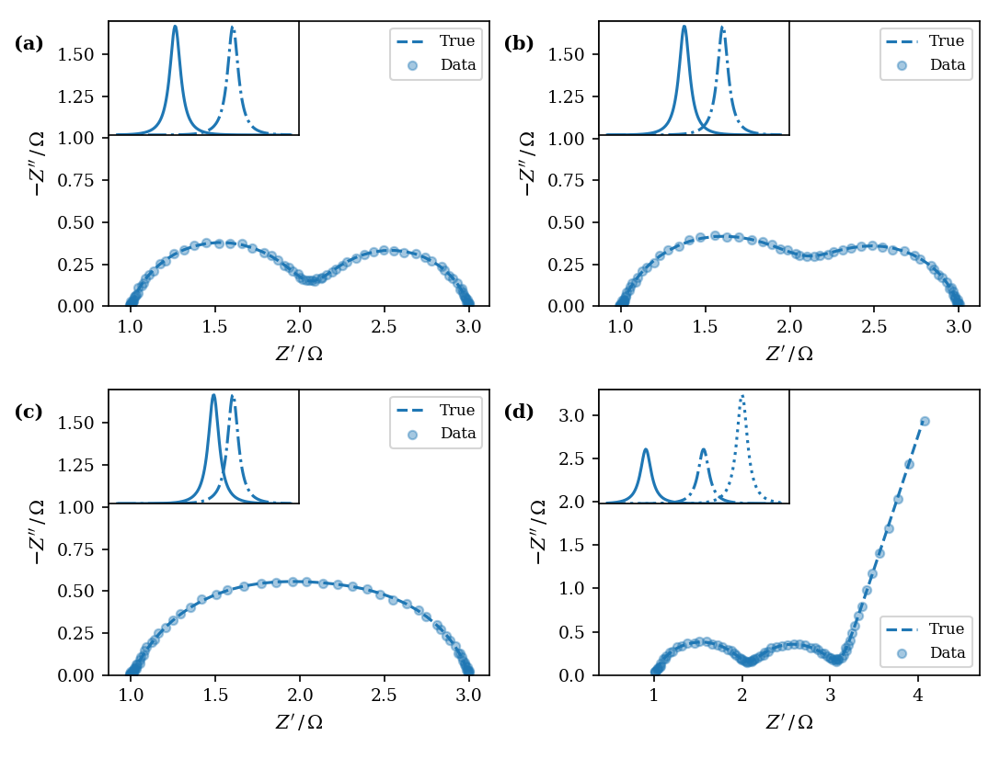

In [779]:
fig,axes = plt.subplots(2,2,figsize=(7.25,5.5))

circuits = ['DRT-4-TpDDT','DRT-3-TpDDT','DRT-2-TpDDT','DRT-TpDDT-BpDDT']

for circ,ax in zip(circuits,axes.ravel()):
    # plot Z
    Z_file = os.path.join(data_path,f'simulated/Z_{circ}_noiseless.csv')
    Zn_file = os.path.join(data_path,f'simulated/Z_{circ}_uniform_0.25.csv')
    Zdf = pd.read_csv(Z_file)
    Zndf = pd.read_csv(Zn_file)
    gt.plot_nyquist(Zdf,ax=ax,plot_func='plot',label='True',ls='--')
    gt.plot_nyquist(Zndf,ax=ax,label='Data',s=20,alpha=0.4)
    ax.legend(loc='upper right')
    
    # plot distributions
    g_true = pd.read_csv(os.path.join(data_path,f'simulated/gamma_{circ}.csv'))
    axi = ax.inset_axes([0.,0.6,0.5,0.4])
    axi.plot(g_true['tau'],g_true['gamma'])
    axi.plot(g_true['tau'],g_true['ftp'],ls='-.',c=default_colors[0])
    if circ=='DRT-TpDDT-BpDDT':
        axi.plot(g_true['tau'],g_true['fbp'],ls=':',c=default_colors[0])
    axi.set_xscale('log')
    axi.set_xticks([])
    axi.set_yticks([])
    axi.set_ylim(0,axi.get_ylim()[1])
    
axes[1,1].set_ylim(0,3.3)
axes[1,1].legend(loc='lower right')
    
for n,ax in enumerate(axes.ravel()):
    let = chr(n+97)
    ax.text(-0.25,0.9,f'({let})',transform=ax.transAxes,fontweight='bold')
    
    
fig.tight_layout()
fig.savefig(os.path.join(plotdir,'DRT-DDT_Nyquists.png'),dpi=500)
fig.savefig(os.path.join(latexdir,'DRT-DDT_Nyquists.pdf'),dpi=500)

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


<IPython.core.display.Javascript object>


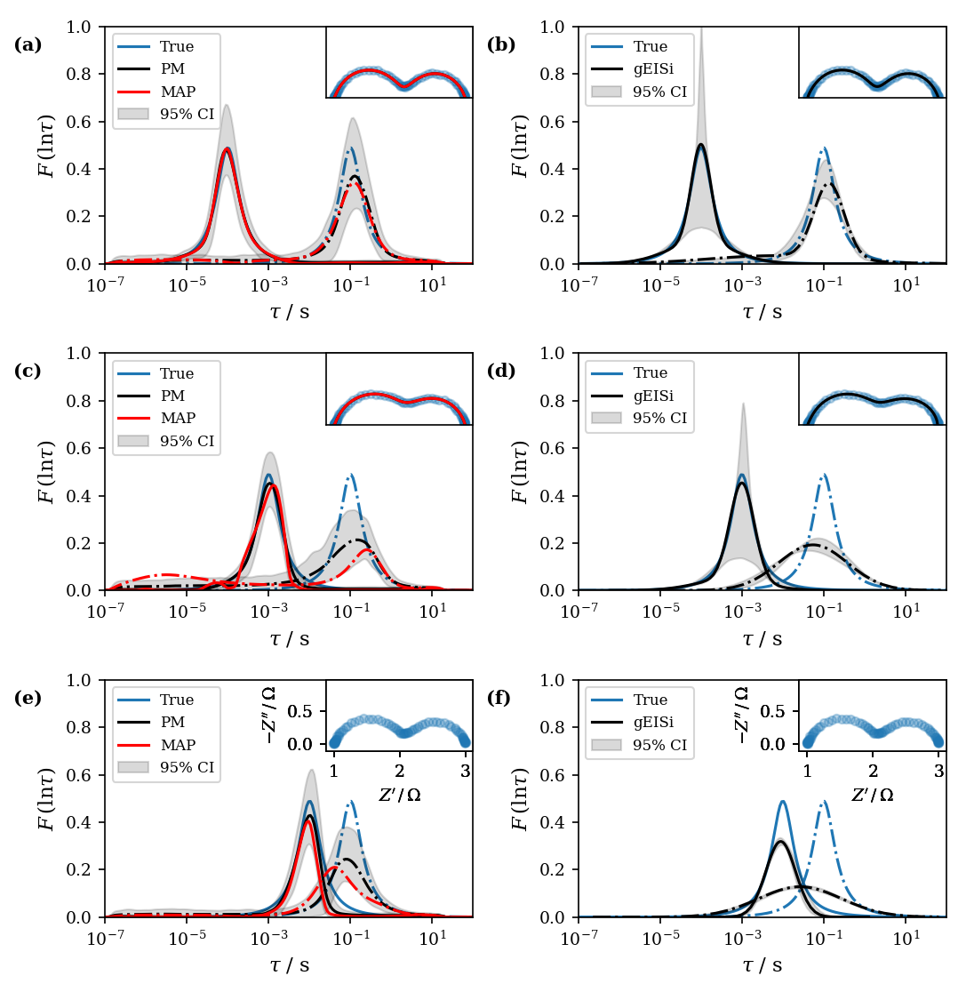

In [1273]:
trunc_tau_plot = True
tmin = 1e-7
tmax = 1e2

fig,axes = plt.subplots(3,2,figsize=(7.25,7.5))

axes[0,0].get_shared_x_axes().join(*axes.ravel())
axes[0,0].get_shared_y_axes().join(*axes.ravel())

for t_zarc,axrow in zip([-4,-3,-2],axes):
    circ = f'DRT{t_zarc}-TpDDT'
    suffix = f'{circ}_uniform_0.25'
    
    
    Zn_file = os.path.join(data_path,'simulated',f'Z_{suffix}.csv')
    Zndf = pd.read_csv(Zn_file)
    if tmin is None:
        tmin = 1/(2*np.pi*Zdf['Freq'].max())
    if tmax is None:
        tmax = 1/(2*np.pi*Zdf['Freq'].min())
    
    # plot Nyquist of data on inset
    axi0 = axrow[0].inset_axes([0.6,0.7,0.4,0.3])
    axi1 = axrow[1].inset_axes([0.6,0.7,0.4,0.3])
    for axi in [axi0,axi1]:
        gt.plot_nyquist(Zndf,ax=axi,s=20,alpha=0.3,label_size=tick_size)
        
    # plot true distributions
    for dist,ls in zip(['gamma','ftp'],['-','-.']): 
        if dist=='gamma':
            label = 'True'
        else:
            label = ''
        for ax in axrow:
            plot_true_dist(circ,dist,ax,trunc_tau_plot,Zndf,tmin=tmin,tmax=tmax,ls=ls,label=label,c=default_colors[0])
        
    # plot recovered DRT and impedance fit for model
    for model_name in ['PM','MAP','gEISi']:
    
        path = model_info[model_name]['path']
        color = model_info[model_name]['color']
        if model_name in ['PM','MAP']:
            ax = axrow[0]
            axi = axi0
        else:
            ax = axrow[1]
            axi = axi1

        # load Gout
        if model_name in ['PM','MAP']:
            Gout = f'Gout_{suffix}.csv'
            Gres = pd.read_csv(os.path.join(path,Gout))
            if trunc_tau_plot:
                # limit dist range to data range
                Gres = Gres[(Gres['tau']>= tmin) & (Gres['tau']<= tmax)]


        # plot recovered distributions on main axis
        if model_name=='PM':
            for dist,ls in zip(['gamma','ftp'],['-','-.']):
                # only label 1st distribution
                if dist=='gamma':
                    label1 = model_name
                    label2 = '95% CI'
                else:
                    label1 = ''
                    label2 = ''
                ax.plot(Gres['tau'],Gres[dist],label=label1,c=color,ls=ls)
                ax.fill_between(Gres['tau'],Gres[f'{dist}_lo'],Gres[f'{dist}_hi'],alpha=0.15,label=label2,
                                       color=color,lw=1)
        elif model_name=='MAP':
            for dist,ls in zip(['gamma','ftp'],['-','-.']):
                # only label 1st distribution
                if dist=='gamma':
                    label = model_name
                else:
                    label = ''
                ax.plot(Gres['tau'],Gres[dist],label=label,c=color,ls=ls)
        elif model_name=='gEISi':
            for dist,ls in zip(['gamma','ftp'],['-','-.']):
                # load distribution file (stored separately)
                if dist=='gamma':
                    dist_file = f'Gout_{suffix}.csv'
                    label1 = model_name
                    label2 = '95% CI'
                elif dist=='ftp':
                    dist_file = f'Ftp_{suffix}.csv'
                    label1 = ''
                    label2 = ''
                dist_res = pd.read_csv(os.path.join(path,dist_file))               
                dist_res['tau'] = np.exp(dist_res['tau'])               
                if trunc_tau_plot:
                    # limit dist range to data range
                    dist_res = dist_res[(dist_res['tau']>= tmin) & (dist_res['tau']<= tmax)]
                # plot distribution    
                ax.plot(dist_res['tau'],dist_res[dist],label=label1,c=color,ls=ls)
                ax.fill_between(dist_res['tau'],dist_res[f'{dist}_lo'],dist_res[f'{dist}_hi'],alpha=0.15,label=label2,
                                       color=color,lw=1)
     

        # plot fitted impedance on inset
        Zout = f'Zout_{suffix}.csv'
        try:
            Zres = pd.read_csv(os.path.join(path,Zout))
    #         if model_name=='PM':
    #             # parse complex numbers
    #             real_cols = ['freq','Zreal','Zimag']
    #             for col in real_cols:
    #                 Zres[col] = Zres[col].str.replace('i','j').apply(lambda x: np.complex(x))
    #                 Zres[col] = np.real(Zres[col])
    #             imag_cols = ['Zlo','Zhi']
    #             for col in imag_cols:
    #                 Zres[col] = Zres[col].str.replace('i','j').apply(lambda x: np.complex(x))

            gt.plot_nyquist(Zres,ax=axi,plot_func='plot',label=model_name,c=color,lw=1.5)
        except FileNotFoundError:
            pass
        
        for ax in axrow:    
#             ax.set_xscale('log')
#             ax.set_xlabel(r'$\tau$ / s')
            ax.set_ylabel(r'$F \, (\ln{\tau})$')
            ax.legend(loc='upper left')
    
    # simplify inset
    for axi in [axi0,axi1]:
        axi.set_xticks([])
        axi.set_yticks([])
        axi.get_legend().remove()
        axi.set_ylim(0,axi.get_ylim()[1])
        axi.set_xlabel('')
        axi.set_ylabel('')

axes[0,0].set_xlim(1e-7,1e2)#axes[0,0].get_xlim()[0],10**2.5)
# axes[0,0].set_ylim(axes[0,0].get_ylim()[0],1)
axes[0,0].set_ylim(0,1)

for n,ax in enumerate(axes.ravel()):
    let = chr(n+97)
    ax.text(-0.25,0.9,f'({let})',transform=ax.transAxes,fontweight='bold')

fig.tight_layout()
# fig.savefig(os.path.join(plotdir,'DistCompare_DRT-TpDDT.png'),dpi=500)
# fig.savefig(os.path.join(latexdir,'DistCompare_DRT-TpDDT.pdf'),dpi=500)

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


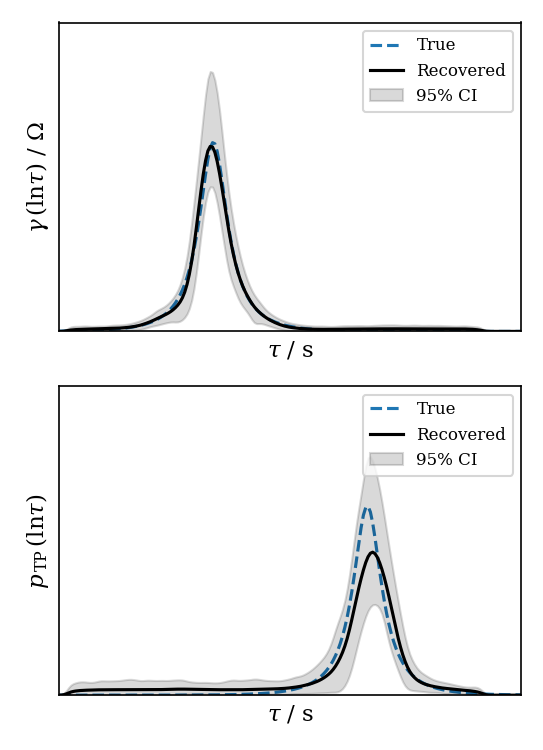

<IPython.core.display.Javascript object>


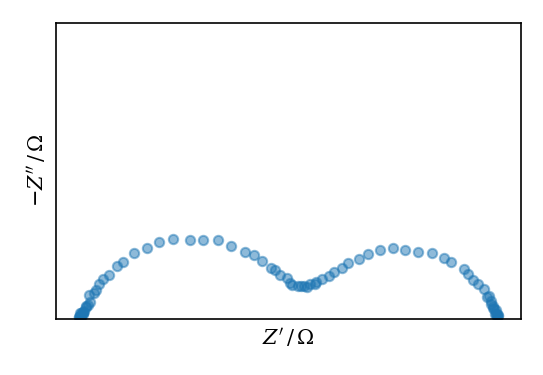

In [1284]:
"Plot DRT-DDT deconvolution for graphical abstract"
trunc_tau_plot = True
tmin = 1e-7
tmax = 1e2

fig,axes = plt.subplots(2,1,figsize=(3.625,5))
fig2,ax2 = plt.subplots(figsize=(3.625,2.5))

axes[0].get_shared_x_axes().join(*axes.ravel())

t_zarc = -4
circ = f'DRT{t_zarc}-TpDDT'
suffix = f'{circ}_uniform_0.25'


Zn_file = os.path.join(data_path,'simulated',f'Z_{suffix}.csv')
Zndf = pd.read_csv(Zn_file)
if tmin is None:
    tmin = 1/(2*np.pi*Zdf['Freq'].max())
if tmax is None:
    tmax = 1/(2*np.pi*Zdf['Freq'].min())
gt.plot_nyquist(Zndf,ax=ax2,s=20,alpha=0.5)
ax2.set_ylim(0,ax2.get_ylim()[1])


# plot true distributions
for dist,ax in zip(['gamma','ftp'],axes): 
    plot_true_dist(circ,dist,ax,trunc_tau_plot,Zndf,tmin=tmin,tmax=tmax,ls='--',label='True',c=default_colors[0])

# plot recovered DRT and impedance fit for model
model_name = 'PM'

path = model_info[model_name]['path']
color = model_info[model_name]['color']

# load Gout
if model_name in ['PM','MAP']:
    Gout = f'Gout_{suffix}.csv'
    Gres = pd.read_csv(os.path.join(path,Gout))
    if trunc_tau_plot:
        # limit dist range to data range
        Gres = Gres[(Gres['tau']>= tmin) & (Gres['tau']<= tmax)]


# plot recovered distributions on main axis
if model_name=='PM':
    for dist,ax in zip(['gamma','ftp'],axes):
        ax.plot(Gres['tau'],Gres[dist],label='Recovered',c=color)
        ax.fill_between(Gres['tau'],Gres[f'{dist}_lo'],Gres[f'{dist}_hi'],alpha=0.15,label='95% CI',
                               color=color,lw=1)

for ax in axes:    
    ax.legend()#loc='upper left')
    ax.set_ylim(0,0.8)
    ax.set_xticks([])
    ax.set_yticks([])
    
ax2.set_xticks([])
ax2.set_yticks([])

axes[0].set_xlim(1e-7,1e2)

fig.tight_layout()
fig2.tight_layout()
fig.savefig(os.path.join(plotdir,'GraphAbs_DRT-DDT_distributions.png'),dpi=500)
fig2.savefig(os.path.join(plotdir,'GraphAbs_DRT-DDT_nyquist.png'),dpi=500)

## DRT-TpDDT-BpDDT

<IPython.core.display.Javascript object>


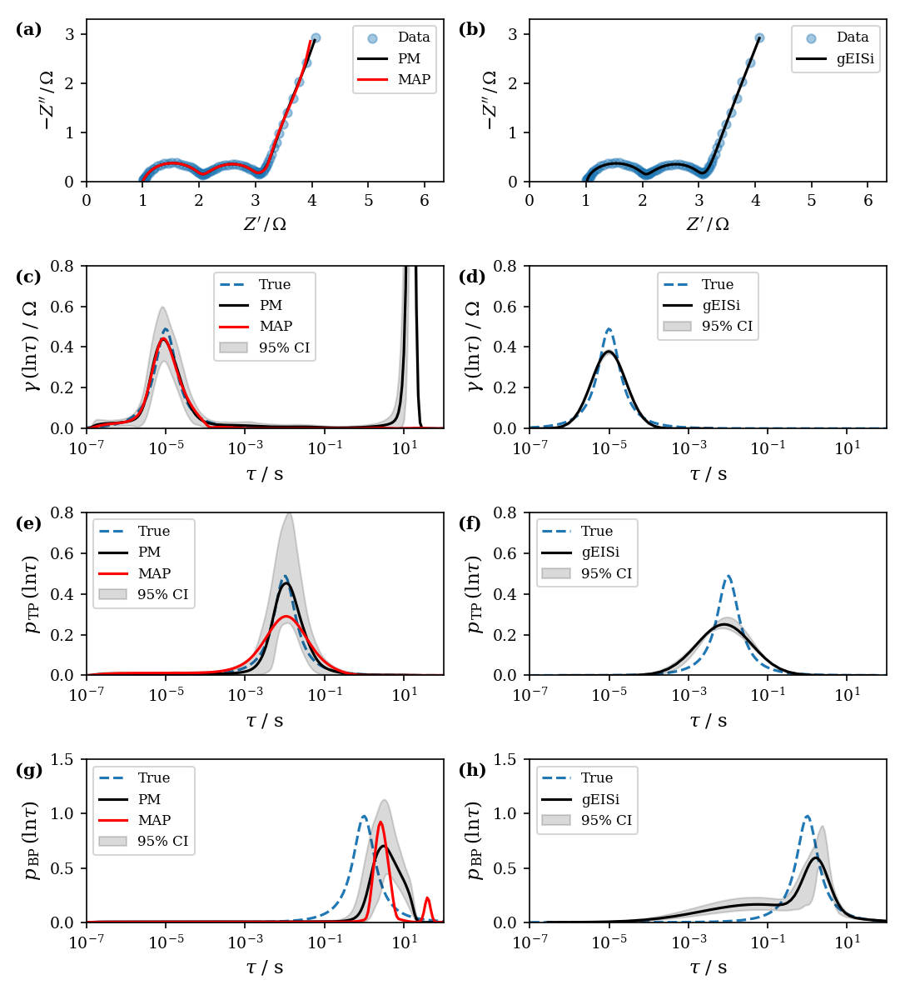

In [133]:
trunc_tau_plot = True
tmin = 1e-7
tmax = 1e2

fig,axes = plt.subplots(4,2,figsize=(7.25,8))

axes[0,0].get_shared_x_axes().join(*axes[0])
axes[0,0].get_shared_y_axes().join(*axes[0])

axes[1,0].get_shared_x_axes().join(*axes[1:,:].ravel())
axes[1,0].get_shared_y_axes().join(*axes[1])
axes[2,0].get_shared_y_axes().join(*axes[2])
axes[3,0].get_shared_y_axes().join(*axes[3])


circ = f'DRT-TpDDT-BpDDT'
suffix = f'{circ}_uniform_0.25'


Zn_file = os.path.join(data_path,'simulated',f'Z_{suffix}.csv')
Zndf = pd.read_csv(Zn_file)
if tmin is None:
    tmin = 1/(2*np.pi*Zdf['Freq'].max())
if tmax is None:
    tmax = 1/(2*np.pi*Zdf['Freq'].min())

# plot Nyquist of data on top axes
for ax in axes[0]:
    gt.plot_nyquist(Zndf,ax=ax,s=25,alpha=0.4,label='Data')

# plot true distributions
for dist,axrow in zip(['gamma','ftp','fbp'],axes[1:,:]): 
    for ax in axrow:
        plot_true_dist(circ,dist,ax,trunc_tau_plot,Zndf,tmin=tmin,tmax=tmax,ls='--',label='True',c=default_colors[0])

# plot recovered DRT and impedance fit for model
for model_name in ['PM','MAP','gEISi']:

    path = model_info[model_name]['path']
    color = model_info[model_name]['color']
    if model_name in ['PM','MAP']:
        ax_z = axes[0,0]
    else:
        ax_z = axes[0,1]

    # load Gout
    if model_name in ['PM','MAP']:
        Gout = f'Gout_{suffix}.csv'
        Gres = pd.read_csv(os.path.join(path,Gout))
        if trunc_tau_plot:
            # limit dist range to data range
            Gres = Gres[(Gres['tau']>= tmin) & (Gres['tau']<= tmax)]

    for dist, axrow in zip(['gamma','ftp','fbp'],axes[1:,:]): 
        # plot recovered distributions on main axis
        if model_name=='PM':
            ax_dist = axrow[0]
            ax_dist.plot(Gres['tau'],Gres[dist],label=model_name,c=color)
            ax_dist.fill_between(Gres['tau'],Gres[f'{dist}_lo'],Gres[f'{dist}_hi'],alpha=0.15,label='95% CI',
                                   color=color,lw=1)
        elif model_name=='MAP':
            ax_dist = axrow[0]
            ax_dist.plot(Gres['tau'],Gres[dist],label=model_name,c=color)
        elif model_name=='gEISi':
            ax_dist = axrow[1]
            # load distribution file (stored separately)
            if dist=='gamma':
                dist_file = f'Gout_{suffix}.csv'
            elif dist=='ftp':
                dist_file = f'Ftp_{suffix}.csv'
            elif dist=='fbp':
                dist_file = f'Fbp_{suffix}.csv'
            dist_res = pd.read_csv(os.path.join(path,dist_file))               
            dist_res['tau'] = np.exp(dist_res['tau'])               
            if trunc_tau_plot:
                # limit dist range to data range
                dist_res = dist_res[(dist_res['tau']>= tmin) & (dist_res['tau']<= tmax)]
            # plot distribution    
            ax_dist.plot(dist_res['tau'],dist_res[dist],label=model_name,c=color)
            ax_dist.fill_between(dist_res['tau'],dist_res[f'{dist}_lo'],dist_res[f'{dist}_hi'],alpha=0.15,
                                 label='95% CI',color=color,lw=1)


    # plot fitted impedance on inset
    Zout = f'Zout_{suffix}.csv'
    try:
        Zres = pd.read_csv(os.path.join(path,Zout))
        gt.plot_nyquist(Zres,ax=ax_z,plot_func='plot',label=model_name,c=color)
    except FileNotFoundError:
        pass

for ax in axes[1]:
    ax.legend(loc='upper center')
for ax in axes[2:,:].ravel():
    ax.legend(loc='upper left')
    
# reorder Nyquist legends (data first)
for j,ax in enumerate(axes[0]):
    h,l = ax.get_legend_handles_labels()
    if j==0:
        sort_idx = [2,0,1]
    else:
        sort_idx = [1,0]
    ax.legend(handles=[h[i] for i in sort_idx],labels=[l[i] for i in sort_idx])


# axes[0,0].set_xlim(axes[0,0].get_xlim()[0],10**2.5)
# axes[0,0].set_ylim(axes[0,0].get_ylim()[0],1)
axes[1,0].set_xlim(1e-7,1e2)
axes[1,0].set_ylim(0,0.8)
axes[2,0].set_ylim(0,0.8)
axes[3,0].set_ylim(0,1.5)

# subfig labels
for n,ax in enumerate(axes.ravel()):
    let = chr(n+97)
    ax.text(-0.2,0.9,f'({let})',transform=ax.transAxes,fontweight='bold')

fig.tight_layout()
# fig.savefig(os.path.join(plotdir,'DistCompare_DRT-TpDDT-BpDDT.png'),dpi=500)
fig.savefig(os.path.join(latexdir,'DistCompare_DRT-TpDDT-BpDDT.pdf'),dpi=500)

# Comparison figures: experimental data

In [103]:
def plot_ecm_fit(Zdf,ecm_param_file,g_file,ec_model):
    "Generate plot of ECM fit and ECM DRT only"
    fig, axes = plt.subplots(1,2,figsize=(7.25,3))

    ecm_params = load_pickle(ecm_param_file)   
    g_ref = pd.read_csv(g_file)

    # get impedance scale
    unit_scale = gt.get_unit_scale(Zdf)
    unit_map = {-2:'$\mu$',-1:'m',0:'',1:'k',2:'M',3:'G'}
    rev_map = {v:k for k,v in unit_map.items()}
    scale_factor = 10**(3*rev_map[unit_scale])
    
    # plot nyquist
    gt.plot_nyquist(Zdf,ax=axes[0],label='Data',s=20,alpha=0.4,unit_scale=unit_scale)
#     default_colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
    gt.plot_model(ec_model,ecm_params,w=Zdf['Freq'],axes=axes[0],plot_type='nyquist',label='ECM',
                  unit_scale=unit_scale,c='k')
#                  mark_peaks=True,c=default_colors[0])

    # reorder legend items
    h,l = axes[0].get_legend_handles_labels()
    axes[0].legend(handles=h[::-1],labels=l[::-1])
    
    # plot DRT from ECM
    axes[1].plot(g_ref['tau'],g_ref['gamma']/scale_factor,label='ECM',c='k')
    axes[1].set_xscale('log')
    axes[1].set_xlabel(r'$\tau$ / s')
    axes[1].set_ylabel(fr'$\gamma \,(\ln{{\tau}})\ / \ {unit_scale}\Omega$')
    
    # plot measurement boundaries
    axes[1].axvline(1/(2*np.pi*Zdf['Freq'].min()),ls=':',c='k')
    axes[1].axvline(1/(2*np.pi*Zdf['Freq'].max()),ls=':',c='k')
    
    # subfigure labels
    for n,ax in enumerate(axes.ravel()):
        let = chr(n+97)
        ax.text(-0.25,0.9,f'({let})',transform=ax.transAxes,fontweight='bold')

    fig.tight_layout()
    
    return fig, axes

def plot_exp_fit(model_name,Zndf,suffix,ax,trunc_tau_plot=True,tmin=None,tmax=None,
                 f_betas=[1e-2,1e-1,1],inset_rect=[0.6,0.5,0.4,0.5],color=None,label=None):
    "Plot recovered DRT on main axis and Nyquist fit on inset"
    
    # create inset axis
    axi = ax.inset_axes(inset_rect)
    if tmin is None:
        tmin = 1/(2*np.pi*Zdf['Freq'].max())
    if tmax is None:
        tmax = 1/(2*np.pi*Zdf['Freq'].min())
    unit_scale = gt.get_unit_scale(Zndf)
    scale_factor = gt.get_scale_factor(Zndf)
        
    # plot recovered DRT and impedance fit for model
    path = model_info[model_name]['path']
    if color is None:
        color = model_info[model_name]['color']
    
    if label is None:
        main_label = model_name
    else:
        main_label = label
    
    
    if model_name!='HB':
        Gout = f'Gout_{suffix}.csv'
        Gres = pd.read_csv(os.path.join(path,Gout))
        # apply scale factor
        for col in Gres.columns[1:]:
            if col.find('gamma') > -1:
                Gres[col] /= scale_factor
                
        if model_name=='gEISi':
            Gres['tau'] = np.exp(Gres['tau'])
#             Gres.loc[-1] = [tmin,0]
#             Gres.loc[Gres.index.max()+1] = [tmax,0]
        if trunc_tau_plot:
            # limit DRT range to data range
            Gres = Gres[(Gres['tau']>= tmin) & (Gres['tau']<= tmax)]
        

    # plot recovered DRT on main axis
    if model_name in ('PM','gEISi'):
        ax.plot(Gres['tau'],Gres['gamma'],label=main_label,c=color)
        ax.fill_between(Gres['tau'],Gres['gamma_lo'],Gres['gamma_hi'],alpha=0.15,label='95% CI',
                               color=color,lw=1)
    elif model_name=='GP':
        ax.plot(Gres['tau'],Gres['gamma'],c=color,label=main_label)
        ax.fill_between(Gres['tau'],Gres['gamma']-2*Gres['sigma_gamma'],Gres['gamma']+2*Gres['sigma_gamma'],
                            alpha=0.2,color=color,label='95% CI',lw=1)
    elif model_name=='HB':
        if f_betas is None:
            Gout = f'Gout_{suffix}.csv'
            Gres = pd.read_csv(os.path.join(path,Gout))
            # apply scale factor
            for col in Gres.columns[1:]:
                if col.find('gamma') > -1:
                    Gres[col] /= scale_factor
            if trunc_tau_plot:
                # limit DRT range to data range
                Gres = Gres[(Gres['tau']>= tmin) & (Gres['tau']<= tmax)]
            ax.plot(Gres['tau'],Gres['gamma'],c=color,label=main_label)
        else:
            for color,f_beta in zip(['k','r','g'],f_betas):
                Gout = 'Gout_{}_fbeta={:.3g}.csv'.format(suffix,f_beta)
                Gres = pd.read_csv(os.path.join(path,Gout))
                # apply scale factor
                for col in Gres.columns[1:]:
                    if col.find('gamma') > -1:
                        Gres[col] /= scale_factor
                if trunc_tau_plot:
                    # limit DRT range to data range
                    Gres = Gres[(Gres['tau']>= tmin) & (Gres['tau']<= tmax)]
                if label is None:
                    ax.plot(Gres['tau'],Gres['gamma'],c=color,label=r'$f_\beta = {:.3g}$'.format(f_beta),alpha=0.8)
                else:
                    ax.plot(Gres['tau'],Gres['gamma'],c=color,label=main_label,alpha=0.8)
    else:
        ax.plot(Gres['tau'],Gres['gamma'],c=color,label=main_label)

    # plot fitted impedance on inset
    # use xy_eq=False tp avoid setting hard axis limits
    # appropriate limits will be set when running plot_nyquist for data
    if model_name!='HB':
        Zout = f'Zout_{suffix}.csv'
        Zres = pd.read_csv(os.path.join(path,Zout))
        gt.plot_nyquist(Zres,ax=axi,plot_func='plot',label=model_name,c=color,unit_scale=unit_scale,eq_xy=False)
    else:
        if f_betas is None:
            Zout = f'Zout_{suffix}.csv'
            Zres = pd.read_csv(os.path.join(path,Zout))
            gt.plot_nyquist(Zres,ax=axi,plot_func='plot',label=main_label,c=color,unit_scale=unit_scale,eq_xy=False)
        else:
            for color,f_beta in zip(['k','r','g'],f_betas):
                Zout = 'Zout_{}_fbeta={:.3g}.csv'.format(suffix,f_beta)
                Zres = pd.read_csv(os.path.join(path,Zout))
                gt.plot_nyquist(Zres,ax=axi,plot_func='plot',label=main_label,c=color,unit_scale=unit_scale,eq_xy=False)
            
    ax.set_xscale('log')
    ax.set_xlabel(r'$\tau$ / s')
    ax.set_ylabel(fr'$\gamma \, (\ln{{\tau}}) \ / \ \mathrm{{{unit_scale}}}\Omega$')
    ax.legend(loc='upper left')
    
    # plot Nyquist of data on inset
    # do last to ensure appropriate axis limits
    gt.plot_nyquist(Zndf,ax=axi,s=20,alpha=0.3,unit_scale=unit_scale,zorder=-10,label='Data')
    
    # simplify inset
    axi.set_xticks([])
    axi.set_yticks([])
    axi.get_legend().remove()
    axi.set_xlabel('')#'$Z^{\prime}$',size=tick_size-1,ha='right',x=0.9)
    axi.set_ylabel('')#'$-Z^{\prime\prime}$',size=tick_size-1,ha='right',y=0.9)
    
    if suffix[:3]=='LIB':
        # indicate zero Z''
        axi.axhline(0,lw=0.7,c='k',zorder=-10)
    else:
        axi.set_ylim(0,axi.get_ylim()[1])
        
def moving_average(a, n=3) :
    ret = np.cumsum(a, dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    return ret[n - 1:] / n
        
def plot_exp_resid(model_name,Zndf,Zfile,axes,label=None,freq_label=False):
    
    unit_scale = gt.get_unit_scale(Zndf)
    scale_factor = gt.get_scale_factor(Zndf)    

    if model_name=='ECM':
        path = os.path.join(data_path,'experimental')
    else:
        path = model_info[model_name]['path']
    
    if label is None:
        main_label = model_name
    else:
        main_label = label
    
    # load fitted Z and calculate residuals
    Zres = pd.read_csv(os.path.join(path,Zfile))
    re_err = (Zres['Zreal'].values - Zndf['Zreal'].values)/scale_factor
    im_err = (Zres['Zimag'].values - Zndf['Zimag'].values)/scale_factor
    
    # plot residuals
    tau = 1/(2*np.pi*Zndf['Freq'].values)
    axes[0].scatter(tau,re_err,s=20,alpha=0.5,label=main_label + ' residuals')
    axes[1].scatter(tau,im_err,s=20,alpha=0.5,label=main_label + ' residuals')
    
    # plot error scales
    if 'sigma_re' in Zres.columns:
        if model_name=='HB':
            # HB weights are not scaled - scale to appropriate magnitude
            max_sigma = max(Zres['sigma_re'].max(),Zres['sigma_im'].max())
            Zres['sigma_re']*= 0.4/max_sigma
            Zres['sigma_im']*= 0.4/max_sigma
            axes[0].fill_between(tau,-Zres['sigma_re'],Zres['sigma_re'],
                                alpha=0.15,color='k',label=main_label + ' $\pm c/\sqrt{w}$')
            axes[1].fill_between(tau,-Zres['sigma_im'],Zres['sigma_im'],
                                alpha=0.15,color='k',label=main_label + ' $\pm c/\sqrt{w}$')
        else:
            axes[0].fill_between(tau,-3*Zres['sigma_re']/scale_factor,3*Zres['sigma_re']/scale_factor,
                                alpha=0.15,color='k',label=main_label + ' $\pm 3\sigma$')
            axes[1].fill_between(tau,-3*Zres['sigma_im']/scale_factor,3*Zres['sigma_im']/scale_factor,
                                alpha=0.15,color='k',label=main_label + ' $\pm 3\sigma$')
    
    for ax in axes:
        ax.set_xscale('log')
        ax.set_xlabel(r'$\tau$ / s')
        ax.axhline(0,lw=0.5,c='k',zorder=-10)
        # add freq axis
        ax2 = ax.twiny()
        ax2.set_xlim(ax.get_xlim())
        ax2.set_xscale('log')
        freq_powers = np.array([6,4,2,0,-2])
        freq_ticks = 10.0**freq_powers
        freq_labels = [f'$10^{{{power}}}$' for power in freq_powers]
        ax2.set_xticks(1/(2*np.pi*freq_ticks))
        ax2.set_xticklabels(freq_labels,fontsize=tick_size-1)
        ax.tick_params(axis='x',labelsize=tick_size-1)
        ax2.set_xlim(ax.get_xlim())
        if freq_label:
            ax2.set_xlabel('$f$ / Hz')
    
    axes[0].set_ylabel(f'$\hat{{Z}}^{{\prime}}-Z^{{\prime}}_{{\mathrm{{exp}}}}$ / {unit_scale}$\Omega$')
    axes[1].set_ylabel(f'$\hat{{Z}}^{{\prime\prime}}-Z^{{\prime\prime}}_{{\mathrm{{exp}}}}$ / {unit_scale}$\Omega$')
    

def plot_resid_mod(model_name,Zndf,Zfile,ax,label=None,freq_axis=False,c='k',window=5,freq_label=True,
                   rel_to=None,Z_offset=None,exclude_idx=None):
    
    unit_scale = gt.get_unit_scale(Zndf)
    scale_factor = gt.get_scale_factor(Zndf)    

    if model_name=='ECM':
        path = os.path.join(data_path,'experimental')
    else:
        path = model_info[model_name]['path']
    
    if label is None:
        main_label = model_name
    else:
        main_label = label
    
    # load fitted Z and calculate residuals
    Zres = pd.read_csv(os.path.join(path,Zfile))
    if exclude_idx is not None:
        Zndf = Zndf.copy()
        Zndf = Zndf[~Zndf.index.isin(exclude_idx)]
        Zres = Zres.copy()
        Zres = Zres[~Zres.index.isin(exclude_idx)]
    
    if Z_offset is not None:
        Zres['Zreal'] += Z_offset.real
        Zres['Zimag'] += Z_offset.imag
    re_err = (Zres['Zreal'].values - Zndf['Zreal'].values)/scale_factor
    im_err = (Zres['Zimag'].values - Zndf['Zimag'].values)/scale_factor
    err_mod = (re_err**2 + im_err**2)**0.5
    # calculate moving average
    inc = int(window/2)
    err_ma = moving_average(np.abs(err_mod),window)
    
    # 
    if rel_to is not None:
        Zref = pd.read_csv(rel_to)
        re_err_ref = (Zref['Zreal'].values - Zndf['Zreal'].values)/scale_factor
        im_err_ref = (Zref['Zimag'].values - Zndf['Zimag'].values)/scale_factor
        err_mod_ref = (re_err_ref**2 + im_err_ref**2)**0.5
        ref_ma = moving_average(err_mod_ref,window)
        err_ma /= ref_ma
    
    tau = 1/(2*np.pi*Zndf['Freq'].values)
    ax.plot(tau[inc:-inc],err_ma,c=c,label=main_label)
    
    ax.set_xscale('log')
    ax.set_xlabel(r'$\tau$ / s')
    # add freq axis
    if freq_axis:
        ax2 = ax.twiny()
        ax2.set_xlim(ax.get_xlim())
        ax2.set_xscale('log')
        freq_powers = np.array([6,4,2,0,-2])
        freq_ticks = 10.0**freq_powers
        freq_labels = [f'$10^{{{power}}}$' for power in freq_powers]
        ax2.set_xticks(1/(2*np.pi*freq_ticks))
        ax2.set_xticklabels(freq_labels)
        ax2.set_xlim(ax.get_xlim())
        if freq_label:
            ax2.set_xlabel('$f$ / Hz')
    
    ax.set_ylabel(f'$| \hat{{Z}}-Z_{{\mathrm{{exp}}}} |$ / {unit_scale}$\Omega$')

## LIB

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


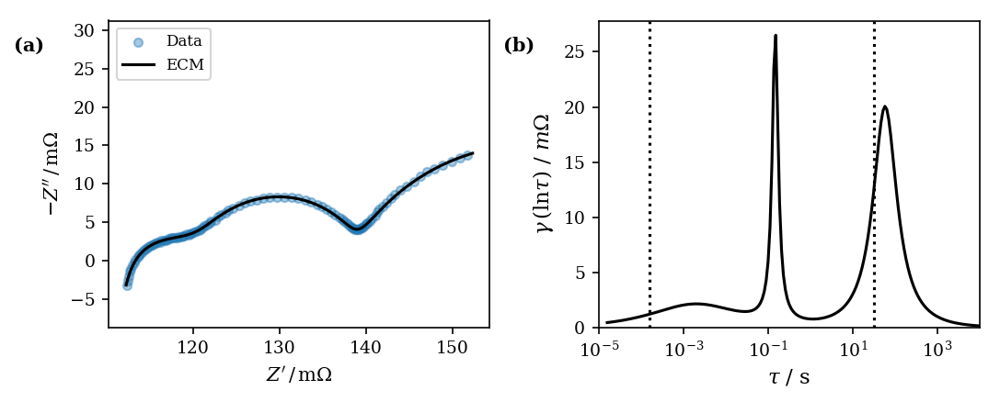

In [1153]:
Z_file = '../data/experimental/DRTtools_LIB_data.txt'
Zdf = pd.read_csv(Z_file,sep='\t',header=None)
Zdf = pd.DataFrame(Zdf.values,columns=['Freq','Zreal','Zimag'])

ecm_param_file = '../data/experimental/EcmParams_LIB.pkl'
g_file = '../data/experimental/gamma_LIB_ECM.csv'

ec_model = gt.Z_var_num_RC

fig,axes = plot_ecm_fit(Zdf,ecm_param_file,g_file,ec_model)

h,l = axes[0].get_legend_handles_labels()
axes[0].legend(h[::-1],l[::-1],loc='upper left')

axes[1].set_ylim(0,axes[1].get_ylim()[1])
axes[1].set_xlim(1e-5,1e4)

# fig.savefig(os.path.join(plotdir,'EcmFit_LIB.jpg'),dpi=500)
fig.savefig(os.path.join(latexdir,'EcmFit_LIB.pdf'),dpi=500)

<IPython.core.display.Javascript object>


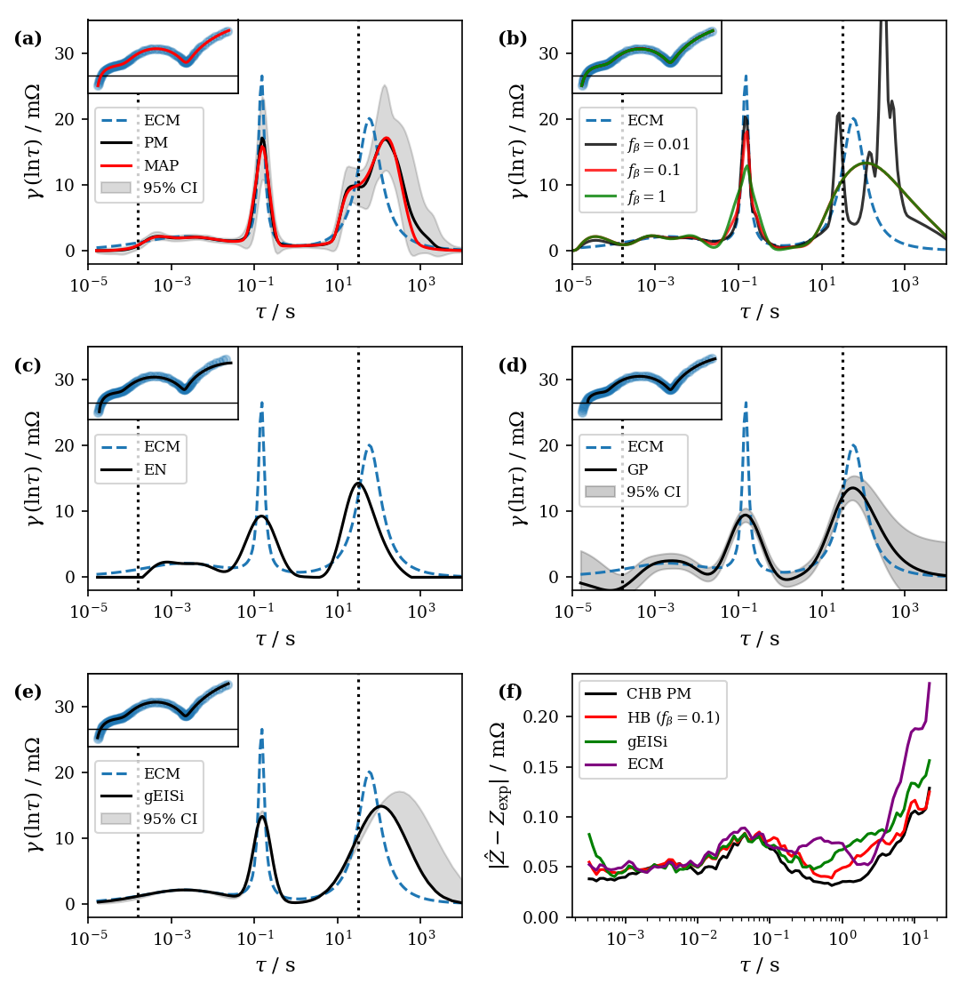

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\pandas\core\series.py:679: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [121]:
"New version with residuals in last panel"
# plot LIB DRTs for all models
Z_file = '../data/experimental/DRTtools_LIB_data.txt'
Zndf = pd.read_csv(Z_file,sep='\t',header=None)
Zndf = pd.DataFrame(Zndf.values,columns=['Freq','Zreal','Zimag'])

# Zq_file = '../data/experimental/DRTtools_LIB_data_qtr.csv'
# Zndf_qtr = pd.read_csv(Zq_file)

Zecm_file = '../data/experimental/Z_ECM_LIB.csv'
gecm_file = '../data/experimental/gamma_LIB_ECM.csv'
base_suffix = 'LIB_data'

fig, axes = plt.subplots(3,2,figsize=(7.25,7.5))

trunc_tau_plot = True
tmin = 1e-5
tmax = 1e4

# share y axes for all DRT plots
axes[0,0].get_shared_y_axes().join(*axes.ravel()[:-1])
axes[0,0].get_shared_x_axes().join(*axes.ravel()[:-1])

# plot impedance data
# Zecm_df = pd.read_csv(Zecm_file)
# gt.plot_nyquist(Zecm_df,ax=axes[0,0],label='ECM',plot_func='plot',c='k')
# gt.plot_nyquist(Zndf,ax=axes[0,0],label='Data',s=30,alpha=0.5)

# plot reference DRT on all DRT axes
g_ecm = pd.read_csv(gecm_file)
g_ecm = g_ecm[(g_ecm['tau']>=tmin) & (g_ecm['tau']<=tmax)]
for ax in axes.ravel()[:-1]:
    ax.plot(g_ecm['tau'],g_ecm['gamma']*1e3,ls='--',label='ECM')
    
# plot model DRTs
for model_name,info in model_info.items():
    order = info['order']
    ax = axes.ravel()[order]
    
    inset_rect=[0.,0.7,0.4,0.3]
    
    if model_name=='HB':
        suffix = base_suffix
        plot_exp_fit(model_name,Zndf,suffix,ax,trunc_tau_plot,f_betas=[1e-2,1e-1,1],
             tmin=tmin,tmax=tmax,inset_rect=inset_rect,color=color)
    elif model_name=='gEISi':
        suffix = base_suffix + '_DRT-Induc'
        plot_exp_fit(model_name,Zndf,suffix,ax,trunc_tau_plot,f_betas=None,
                 tmin=tmin,tmax=tmax,inset_rect=inset_rect)
    else:
        suffix = base_suffix
        plot_exp_fit(model_name,Zndf,suffix,ax,trunc_tau_plot,f_betas=None,
                 tmin=tmin,tmax=tmax,inset_rect=inset_rect)
        
# plot moving average of residuals
window = 13

plot_resid_mod('PM',Zndf,'Zout_LIB_data.csv',ax=axes[2,1],c='k',window=window,label='CHB PM',freq_axis=False)
#               rel_to='../data/experimental/Z_ECM_LIB.csv')

plot_resid_mod('HB',Zndf,'Zout_LIB_data_fbeta=0.1.csv',ax=axes[2,1],c='r',window=window,label=r'HB ($f_\beta=0.1$)')
#               rel_to='../data/experimental/Z_ECM_LIB.csv')

# apply offset to fix underestimated Rinf and inductance of gEISi
Z_offset = 0.07*1e-3 + 1j*Zndf['Freq'].values*2*np.pi*4e-8 
plot_resid_mod('gEISi',Zndf,'Zout_LIB_data_DRT-Induc.csv',ax=axes[2,1],c='g',window=window,Z_offset=Z_offset)
              #rel_to='../data/experimental/Z_ECM_LIB.csv')

plot_resid_mod('ECM',Zndf,'Z_ECM_LIB.csv',ax=axes[2,1],c='purple',window=window)

axes[2,1].legend()
axes[2,1].set_ylim(0,axes[2,1].get_ylim()[1])

# subfigure labels
# if subfig_labels:
for n,ax in enumerate(axes.ravel()):
    let = chr(n+97)
    ax.text(-0.2,0.9,f'({let})',transform=ax.transAxes,fontweight='bold')

# mark data limit
for ax in axes.ravel()[:-1]:
    ax.axvline(1/(2*np.pi*Zndf['Freq'].min()),ls=':',c='k')
    ax.axvline(1/(2*np.pi*Zndf['Freq'].max()),ls=':',c='k')
    
for ax in axes.ravel()[:-1]:
    ax.legend(loc='upper left',bbox_to_anchor=(0,0.67))

axes[0,0].set_xlim(tmin,tmax)
axes[0,0].set_ylim(-2,35)

fig.tight_layout()

fig.savefig(os.path.join(latexdir,'DistCompare_LIB_DRT.pdf'),dpi=500)

<IPython.core.display.Javascript object>


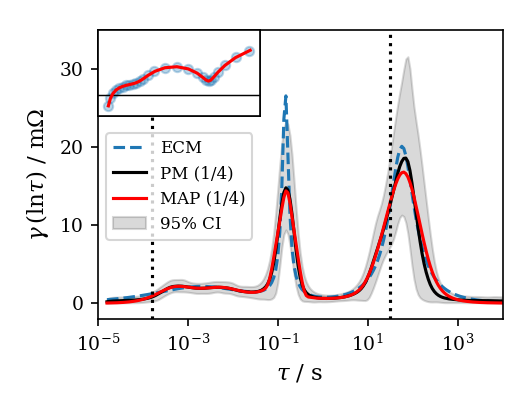

In [134]:
Z_file = '../data/experimental/DRTtools_LIB_data.txt'
Zndf = pd.read_csv(Z_file,sep='\t',header=None)
Zndf = pd.DataFrame(Zndf.values,columns=['Freq','Zreal','Zimag'])

Zq_file = '../data/experimental/DRTtools_LIB_data_qtr.csv'
Zndf_qtr = pd.read_csv(Zq_file)

Zecm_file = '../data/experimental/Z_ECM_LIB.csv'
gecm_file = '../data/experimental/gamma_LIB_ECM.csv'
base_suffix = 'LIB_data'

fig, ax = plt.subplots(figsize=(3.5,2.75))

trunc_tau_plot = True
tmin = 1e-5
tmax = 1e4


# plot reference DRT on all DRT axes
g_ecm = pd.read_csv(gecm_file)
g_ecm = g_ecm[(g_ecm['tau']>=tmin) & (g_ecm['tau']<=tmax)]
ax.plot(g_ecm['tau'],g_ecm['gamma']*1e3,ls='--',label='ECM')
    
inset_rect=[0.,0.7,0.4,0.3]

for model_name in ['PM','MAP']:
    # plot with full dataset and quarter density
    suffix = base_suffix + '_qtr'
    label = model_name + ' (1/4)'
    plot_exp_fit(model_name,Zndf_qtr,suffix,ax,trunc_tau_plot,f_betas=None,
         tmin=tmin,tmax=tmax,inset_rect=inset_rect,label=label)
       
ax.legend(loc='upper left',bbox_to_anchor=(0,0.67))
ax.set_xlim(tmin,tmax)
ax.set_ylim(-2,35)

# mark data limit
ax.axvline(1/(2*np.pi*Zndf['Freq'].min()),ls=':',c='k')
ax.axvline(1/(2*np.pi*Zndf['Freq'].max()),ls=':',c='k')

fig.tight_layout()

fig.savefig(os.path.join(latexdir,'LIB_DRT_qtr.pdf'),dpi=500)

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


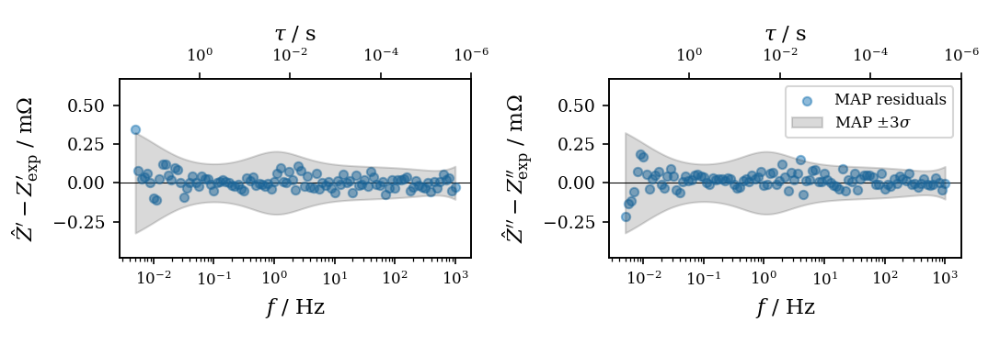

In [1107]:
# plot residuals for MAP (unused)
fig,axes = plt.subplots(1,2,figsize=(7.25,2.5))

Z_file = '../data/experimental/DRTtools_LIB_data.txt'
suffix = '_LIB_data'
Zndf = pd.read_csv(Z_file,sep='\t',header=None)
Zndf = pd.DataFrame(Zndf.values,columns=['Freq','Zreal','Zimag'])
freq = Zndf['Freq'].values

plot_exp_resid('MAP',Zndf,'Zout_LIB_data.csv',axes=axes,tau_label=True)

for ax in axes:
    ax.set_ylim(lib_resid_ylim)
    
axes[1].legend()
fig.tight_layout()
# fig.savefig(os.path.join(plotdir,'MapResiduals_LIB.jpg'),dpi=500)
fig.savefig(os.path.join(latexdir,'MapResiduals_LIB.pdf'),dpi=500)

## BZY thin film

<IPython.core.display.Javascript object>


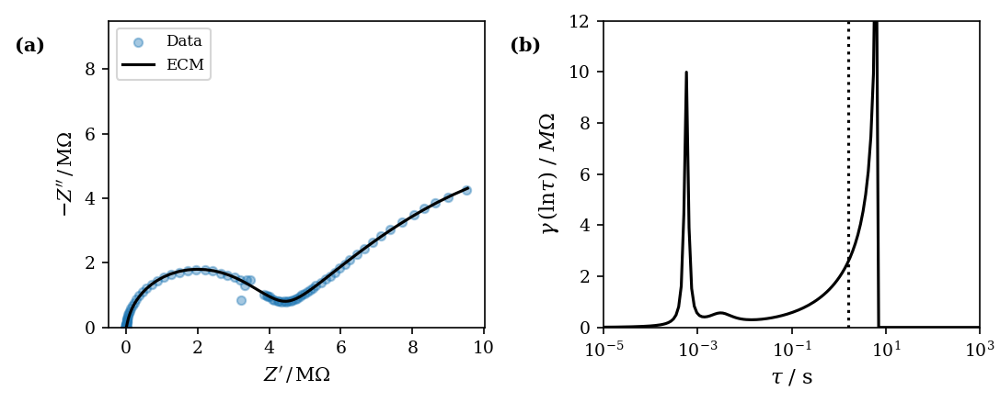

In [65]:
Z_file = '../data/experimental/PDAC_COM3_02109_Contact10_2065C_500C.txt'
Zdf = gt.read_eis_zdata(Z_file)


ecm_param_file = '../data/experimental/EcmParams_PDAC-ger.pkl'#'../data/experimental/EcmParams_PDAC-Ger.pkl'
g_file = '../data/experimental/gamma_PDAC_ECM-ger.csv' #'../data/experimental/gamma_PDAC_ECM-Ger.csv'

def Z_varRQ_ger(w,HFR,Y,t0,**RC_params):
    """
    Impedance of circuit with 1-n parallel RQ circuits in series with a resistor (HFR) and Gerischer element (Y, t0)
    Args:
        w: frequency (Hz)
        HFR: high-frequency resistance
        Y: admittance of Gerischer element
        t0: characteristic time constant of Gerischer element
        RC_params: parameters for each parallel RQ circuit. keys: R, Q, n
    """
    num_RC = int(len(RC_params)/3)

    Z_RC = [gt.Z_par(gt.Z_cpe(w,RC_params[f'Q{i}'],RC_params[f'n{i}']), RC_params[f'R{i}']) for i in range(num_RC)]

    return gt.Z_ger(w,Y,t0) + HFR + np.sum(Z_RC,axis=0)

ec_model = Z_varRQ_ger#gt.Z_var_num_RC_noL#

fig,axes = plot_ecm_fit(Zdf,ecm_param_file,g_file,ec_model)
h,l = axes[0].get_legend_handles_labels()
axes[0].legend(h[::-1],l[::-1],loc='upper left')
# set x and y lim for DRT
axes[1].set_xlim(1e-5,1e3)
axes[1].set_ylim(0,12)

# fig.savefig(os.path.join(plotdir,'EcmFit_TCO.jpg'),dpi=500)
fig.savefig(os.path.join(latexdir,'EcmFit_TCO.pdf'),dpi=500)

<IPython.core.display.Javascript object>


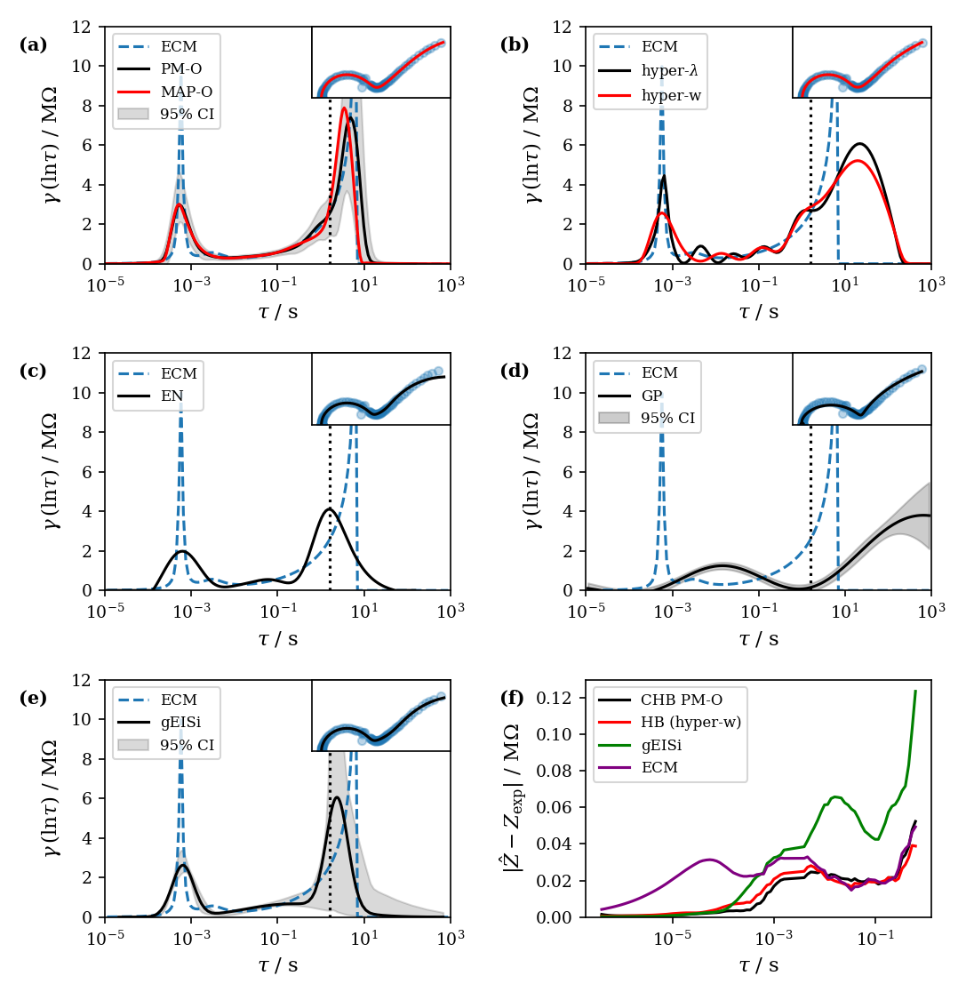

In [122]:
"New version with residuals in last panel"
# plot PDAC DRTs for all models
Z_file = '../data/experimental/PDAC_COM3_02109_Contact10_2065C_500C.txt'
Zndf = gt.read_eis_zdata(Z_file)

Zecm_file = '../data/experimental/Z_ECM-ger_PDAC.csv'
gecm_file = '../data/experimental/gamma_PDAC_ECM-ger.csv'
base_suffix = 'PDAC'

fig, axes = plt.subplots(3,2,figsize=(7.25,7.5))

trunc_tau_plot = True
tmin = 1e-5
tmax = 1e3

# share y axes for all DRT plots
axes[0,0].get_shared_y_axes().join(*axes.ravel()[:-1])
axes[0,0].get_shared_x_axes().join(*axes.ravel()[:-1])

# plot impedance data
# Zecm_df = pd.read_csv(Zecm_file)
# gt.plot_nyquist(Zecm_df,ax=axes[0,0],label='ECM',plot_func='plot',c='k')
# gt.plot_nyquist(Zndf,ax=axes[0,0],label='Data',s=30,alpha=0.5)

# plot reference DRT on all DRT axes
g_ecm = pd.read_csv(gecm_file)
g_ecm = g_ecm[(g_ecm['tau']>=tmin) & (g_ecm['tau']<=tmax)]
for ax in axes.ravel()[:-1]:
    ax.plot(g_ecm['tau'],g_ecm['gamma']*1e-6,ls='--',label='ECM')
    
# plot model DRTs
for model_name,info in model_info.items():
    order = info['order']
    ax = axes.ravel()[order]
    
    inset_rect=[0.6,0.7,0.4,0.3]
    
    if model_name in ['MAP','PM']:
        # plot with outlier detection
        suffix = base_suffix + '_outliers'
        plot_exp_fit(model_name,Zndf,suffix,ax,trunc_tau_plot,f_betas=None,
             tmin=tmin,tmax=tmax,inset_rect=inset_rect,label=model_name+'-O')
    elif model_name=='HB':
        for add_suffix,color,label in zip(['_fbeta=0.1','_hyper-w'],['k','r'],['hyper-$\lambda$','hyper-w']):
            suffix = base_suffix + add_suffix
            plot_exp_fit(model_name,Zndf,suffix,ax,trunc_tau_plot,f_betas=None,
                 tmin=tmin,tmax=tmax,inset_rect=inset_rect,color=color,label=label)
    elif model_name=='gEISi':
        suffix = base_suffix + '_DRT'
        plot_exp_fit(model_name,Zndf,suffix,ax,trunc_tau_plot,f_betas=None,
                 tmin=tmin,tmax=tmax,inset_rect=inset_rect)
    else:
        suffix = base_suffix
        plot_exp_fit(model_name,Zndf,suffix,ax,trunc_tau_plot,f_betas=None,
                 tmin=tmin,tmax=tmax,inset_rect=inset_rect)
        
# plot residual moving average
window = 13
exclude_idx=[61,62,63,64,65] # exclude outliers from moving avg

plot_resid_mod('PM',Zndf,'Zout_PDAC_outliers.csv',ax=axes[2,1],c='k',window=window,label='CHB PM-O',
              exclude_idx=exclude_idx)

plot_resid_mod('HB',Zndf,'Zout_PDAC_hyper-w.csv',ax=axes[2,1],c='r',window=window,label=r'HB (hyper-w)',
                 exclude_idx=exclude_idx)

plot_resid_mod('gEISi',Zndf,'Zout_PDAC_DRT.csv',ax=axes[2,1],c='g',window=window,
               exclude_idx=exclude_idx)

plot_resid_mod('ECM',Zndf,'Z_ECM-ger_PDAC.csv',ax=axes[2,1],c='purple',window=window, 
               exclude_idx=exclude_idx)

axes[2,1].legend()
axes[2,1].set_ylim(0,axes[2,1].get_ylim()[1])
        

# subfigure labels
# if subfig_labels:
for n,ax in enumerate(axes.ravel()):
    let = chr(n+97)
    ax.text(-0.25,0.9,f'({let})',transform=ax.transAxes,fontweight='bold')

# mark data limit
for ax in axes.ravel()[:-1]:
    ax.axvline(1/(2*np.pi*Zndf['Freq'].min()),ls=':',c='k')

axes[0,0].set_xlim(tmin,tmax)
axes[0,0].set_ylim(0,12)#axes[0,0].get_ylim()[1])
fig.tight_layout()

fig.savefig(os.path.join(latexdir,'DistCompare_TCO_DRT.pdf'),dpi=500)

<IPython.core.display.Javascript object>


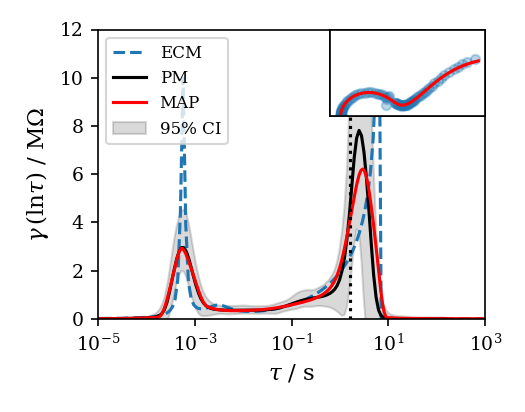

In [128]:
"Plot CHB without outlier detection"
Z_file = '../data/experimental/PDAC_COM3_02109_Contact10_2065C_500C.txt'
Zndf = gt.read_eis_zdata(Z_file)

Zecm_file = '../data/experimental/Z_ECM-ger_PDAC.csv'
gecm_file = '../data/experimental/gamma_PDAC_ECM-ger.csv'
base_suffix = 'PDAC'

fig, ax = plt.subplots(figsize=(3.5,2.75))

trunc_tau_plot = True
tmin = 1e-5
tmax = 1e3

# plot reference DRT
g_ecm = pd.read_csv(gecm_file)
g_ecm = g_ecm[(g_ecm['tau']>=tmin) & (g_ecm['tau']<=tmax)]
ax.plot(g_ecm['tau'],g_ecm['gamma']*1e-6,ls='--',label='ECM')
    
# plot model DRTs
inset_rect=[0.6,0.7,0.4,0.3]

for model_name in ['PM','MAP']:
    # plot without outlier detection
    plot_exp_fit(model_name,Zndf,base_suffix,ax,trunc_tau_plot,f_betas=None,
         tmin=tmin,tmax=tmax,inset_rect=inset_rect,label=model_name)
    
# mark data limit
ax.axvline(1/(2*np.pi*Zndf['Freq'].min()),ls=':',c='k')

ax.set_xlim(tmin,tmax)
ax.set_ylim(0,12)#axes[0,0].get_ylim()[1])
fig.tight_layout()

fig.savefig(os.path.join(latexdir,'TCO_DRT_NoSigmaOut.pdf'),dpi=500)

<IPython.core.display.Javascript object>


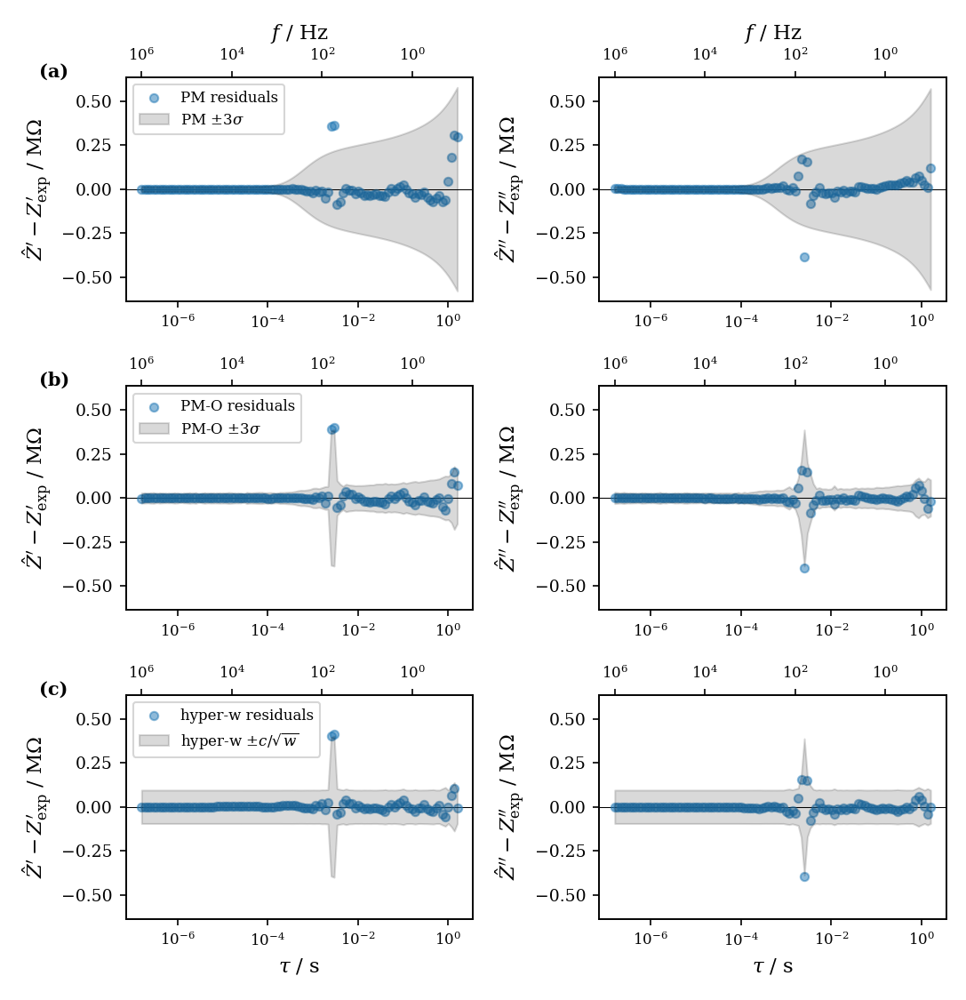

In [129]:
# plot residuals for CHB and HB to show outlier detection
fig,axes = plt.subplots(3,2,figsize=(7.25,7.5))

Z_file = '../data/experimental/PDAC_COM3_02109_Contact10_2065C_500C.txt'
Zndf = gt.read_eis_zdata(Z_file)

axes[0,0].get_shared_y_axes().join(*axes.ravel())

# plot_exp_resid('ECM',Zndf,'Z_ECM_PDAC.csv',axes=axes[0],tau_label=True)

plot_exp_resid('PM',Zndf,'Zout_PDAC.csv',axes=axes[0],label='PM',freq_label=True)

plot_exp_resid('PM',Zndf,'Zout_PDAC_outliers.csv',axes=axes[1],label='PM-O',freq_label=False)

plot_exp_resid('HB',Zndf,'Zout_PDAC_hyper-w.csv',axes=axes[2],label='hyper-w',freq_label=False)

# plot_exp_resid('gEISi',Zndf,'Zout_PDAC_DRT.csv',axes=axes[3])

for ax in axes.ravel()[:-2]:
    ax.set_xlabel('')
    
for n,ax in enumerate(axes[:,0]):
    let = chr(n+97)
    ax.text(-0.25,1,f'({let})',transform=ax.transAxes,fontweight='bold')
    
for ax in axes[:,0]:
    ax.legend()
    
# axes[0,0].set_ylim(-0.2,0.2)
# tco_resid_ylim = axes[0,0].get_ylim()
    
fig.tight_layout()
# fig.savefig(os.path.join(plotdir,'Residuals_TCO.jpg'),dpi=500)
fig.savefig(os.path.join(latexdir,'Residuals_TCO_DRT.pdf'),dpi=500)

<IPython.core.display.Javascript object>


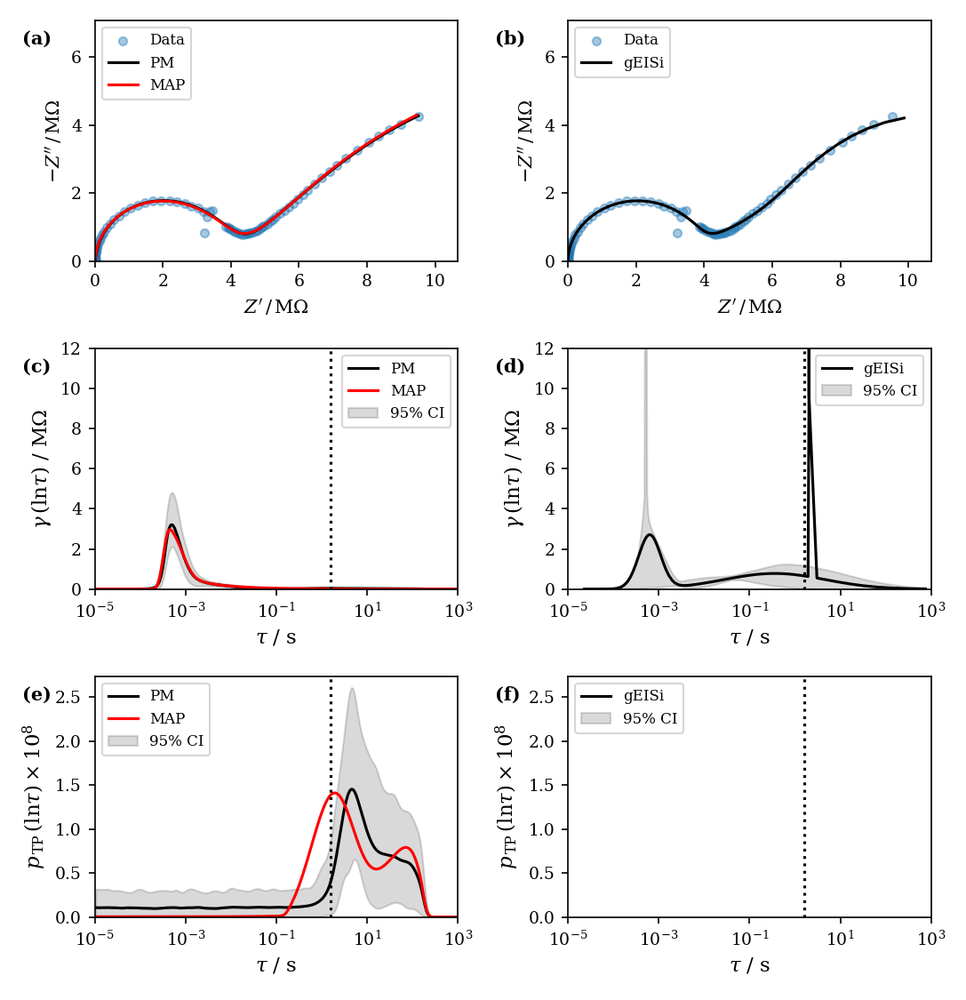

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\pandas\core\series.py:679: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [47]:
Z_file = '../data/experimental/PDAC_COM3_02109_Contact10_2065C_500C.txt'
Zndf = gt.read_eis_zdata(Z_file)

model_names = ['PM','MAP','gEISi']
suffixes = ['PDAC_DRT-TpDDT_outliers','PDAC_DRT-TpDDT_outliers','PDAC_DRT-TpDDT']
col_idx = [0,0,1]
label = None
trunc_tau_plot = True
tmin = 1e-5
tmax = 1e3

fig,axes = plt.subplots(3,2,figsize=(7.25,7.5))

for axrow in axes:
    axrow[0].get_shared_x_axes().join(*axrow)
    axrow[0].get_shared_y_axes().join(*axrow)

# for axrow in axes[:2]:
#     axrow[0].get_shared_y_axes().join(*axrow)

if tmin is None:
    tmin = 1/(2*np.pi*Zndf['Freq'].max())
if tmax is None:
    tmax = 1/(2*np.pi*Zndf['Freq'].min())
unit_scale = gt.get_unit_scale(Zndf)
scale_factor = gt.get_scale_factor(Zndf)
 # plot Nyquist of data on top axes
for ax in axes[0]:
    gt.plot_nyquist(Zndf,ax=ax,s=20,alpha=0.4,unit_scale=unit_scale,label='Data')

for model_name,suffix,col in zip(model_names,suffixes,col_idx):
    axcol = axes[:,col]
    
    path = model_info[model_name]['path']
    color = model_info[model_name]['color']
    
    # plot fitted impedance
    Zout = f'Zout_{suffix}.csv'
    Zres = pd.read_csv(os.path.join(path,Zout))
    gt.plot_nyquist(Zres,ax=axcol[0],plot_func='plot',label=model_name,c=color,unit_scale=unit_scale)
    
    
    # plot recovered DRT and impedance fit for model    
    if label is None:
        main_label = model_name
    else:
        main_label = label


    for dist,ax in zip(['gamma','ftp'],axcol[1:]):
        if dist=='ftp' and model_name=='gEISi':
            Gout = f'Ftp_{suffix}.csv'
            Gres = pd.read_csv(os.path.join(path,Gout))
        else:
            Gout = f'Gout_{suffix}.csv'
            Gres = pd.read_csv(os.path.join(path,Gout))
            
        # apply scale factor
        if dist=='ftp':
#             ftp_power = np.log10(np.max(Gres['ftp']))
#             ftp_power = int(np.sign(ftp_power)*(np.ceil(abs(ftp_power))))
            # fix the ftp power at the CHB value
            ftp_power = -8
        for col in Gres.columns[1:]:
            if col.find('gamma') > -1:
                Gres[col] /= scale_factor
            elif dist=='ftp' and col[:3]=='ftp':
                Gres[col] /= 10**ftp_power

        if model_name=='gEISi':
            Gres['tau'] = np.exp(Gres['tau'])
            
        if trunc_tau_plot:
            # limit tau range
            Gres = Gres[(Gres['tau']>= tmin) & (Gres['tau']<= tmax)]

        # plot recovered distribution
        if model_name in ('PM','gEISi'):
            ax.plot(Gres['tau'],Gres[dist],label=main_label,c=color)
            ax.fill_between(Gres['tau'],Gres[f'{dist}_lo'],Gres[f'{dist}_hi'],alpha=0.15,label='95% CI',
                                   color=color,lw=1)

        else:
            ax.plot(Gres['tau'],Gres[dist],c=color,label=main_label)

        ax.set_xscale('log')
        ax.set_xlabel(r'$\tau$ / s')
        if dist=='gamma':
            ax.set_ylabel(fr'$\gamma \, (\ln{{\tau}}) \ / \ \mathrm{{{unit_scale}}}\Omega$')
        elif dist=='ftp':
            ax.set_ylabel(r'$p_{{\,\mathrm{{TP}}}} \, (\ln{{\tau}}) \times 10^{{{}}}$'.format(-ftp_power))
        
        ax.legend()
        
for ax in axes[1:,:].ravel():
    ax.set_xlim(tmin,tmax)
    ax.set_ylim(0,ax.get_ylim()[1])
    ax.axvline(1/(2*np.pi*Zndf['Freq'].min()),ls=':',c='k')
    
# re-sort Nyquist legends
for ax,srt_idx in zip(axes[0],[[2,0,1],[1,0]]):
    h,l = ax.get_legend_handles_labels()
    ax.legend([h[i] for i in srt_idx],[l[i] for i in srt_idx],loc='upper left')
    
for ax in axes[2]:
    ax.legend(loc='upper left')
    
for n,ax in enumerate(axes.ravel()):
    let = chr(n+97)
    ax.text(-0.2,0.9,f'({let})',transform=ax.transAxes,fontweight='bold')
        
axes[1,0].set_ylim(0,12)
fig.tight_layout()
fig.savefig(os.path.join(latexdir,'DistCompare_TCO_DRT-TpDDT.pdf'),dpi=500)

# Supplementary figures
## Influence of sampling scheme

C:\Users\jdh10\anaconda3\envs\stan\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


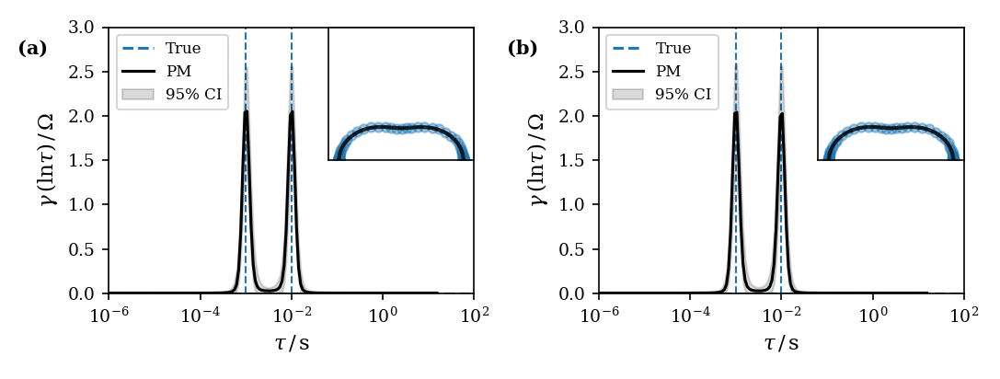

In [789]:
fig, axes = plt.subplots(1,2,figsize=(7.25,2.75))

# load impedance data
circ = '2RC'
err_model = 'uniform'
noise_level = 0.25
Z_file = os.path.join(data_path,'simulated',f'Z_{circ}_noiseless.csv')
Zn_file = os.path.join(data_path,'simulated',f'Z_{circ}_{err_model}_{noise_level}.csv')
Zdf = pd.read_csv(Z_file)
Zndf = pd.read_csv(Zn_file)

# share y axes for all DRT plots
axes[0].get_shared_y_axes().join(axes[0],axes[1])

# get results filenames
fname = os.path.split(Zn_file)[1]
suffix = fname[1:-4]
Zout = f'Zout{suffix}.csv'
Gout = f'Gout{suffix}.csv'

Zout_fs = f'Zout{suffix}_4x1000.csv'
Gout_fs = f'Gout{suffix}_4x1000.csv'

# plot DRT and impedance fit for each model
path = model_info['PM']['path']
color = model_info['PM']['color']
Zres_ss = pd.read_csv(os.path.join(path,Zout))
Gres_ss = pd.read_csv(os.path.join(path,Gout))
Zres_fs = pd.read_csv(os.path.join(path,Zout_fs))
Gres_fs = pd.read_csv(os.path.join(path,Gout_fs))

for Zres,Gres,ax in zip([Zres_ss,Zres_fs],[Gres_ss,Gres_fs],axes):
    # limit DRT range to data range
    tmin = 1/(2*np.pi*Zdf['Freq'].max())
    tmax = 1/(2*np.pi*Zdf['Freq'].min())
    Gres = Gres[(Gres['tau']>= tmin) & (Gres['tau']<= tmax)]

    # plot DRT
    ax.plot(Gres['tau'],Gres['gamma'],label='PM',c=color)
    ax.fill_between(Gres['tau'],Gres['gamma_lo'],Gres['gamma_hi'],alpha=0.15,label='95% CI',
                           color=color,lw=1)

    # plot fitted impedance
    # parse complex numbers
    axi = ax.inset_axes([0.6,0.5,0.4,0.5])
    gt.plot_nyquist(Zdf,ax=axi,plot_func='plot',ls='--',label_size=tick_size)
    gt.plot_nyquist(Zndf,ax=axi,s=25,alpha=0.4,label_size=tick_size)
    gt.plot_nyquist(Zres,ax=axi,plot_func='plot',label=model_name,c=color,lw=2,alpha=0.8,label_size=label_size)
    
    # formatting
    ax.set_xscale('log')
    ax.set_xlabel(r'$\tau \, / \, $s',size=label_size)
    ax.set_ylabel(r'$\gamma\,(\ln{\tau}) \, / \, \Omega$',size=label_size)
    ax.set_xlim(ax.get_xlim()[0],2e3)

    axi.set_xticks([])
    axi.set_yticks([])
    axi.get_legend().remove()
    axi.set_xlabel('')
    axi.set_ylabel('')
#     axi.xaxis.set_label_coords(0.8,-0.025)
#     axi.yaxis.set_label_coords(-0.025,0.72)
    
    # plot true DRT
    ax.axhline(0,ls='--',label='True',zorder=-10)
    ax.axvline(1e-3,ls='--',zorder=-10,lw=1)
    ax.axvline(1e-2,ls='--',zorder=-10,lw=1)
    
    # reorder legend
    h,l = ax.get_legend_handles_labels()
    srt_idx = [1,0,2]
    ax.legend(handles=[h[i] for i in srt_idx],labels=[l[i] for i in srt_idx],fontsize=tick_size-1,loc='upper left')

# subfigure labels
for n,ax in enumerate(axes):
    let = chr(n+97)
    ax.text(-0.25,0.9,f'({let})',transform=ax.transAxes,fontweight='bold')
    ax.set_ylim(0,3)
    ax.set_xlim(1e-6,1e2)

fig.tight_layout()
fig.savefig(os.path.join(plotdir,'SamplingComparison_2RC.jpg'),dpi=500)
fig.savefig(os.path.join(latexdir,'SamplingComparison_2RC.pdf'),dpi=500)